In [1]:
library(dplyr)
library(Seurat)
library(monocle3)
library("stringr")
library("factoextra")
library("Rtsne")


Attaching package: ‘dplyr’


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union


Attaching SeuratObject

Loading required package: Biobase

Loading required package: BiocGenerics

Loading required package: parallel


Attaching package: ‘BiocGenerics’


The following objects are masked from ‘package:parallel’:

    clusterApply, clusterApplyLB, clusterCall, clusterEvalQ,
    clusterExport, clusterMap, parApply, parCapply, parLapply,
    parLapplyLB, parRapply, parSapply, parSapplyLB


The following objects are masked from ‘package:dplyr’:

    combine, intersect, setdiff, union


The following objects are masked from ‘package:stats’:

    IQR, mad, sd, var, xtabs


The following objects are masked from ‘package:base’:

    anyDuplicated, append, as.data.frame, basename, cbind, colnames,
    dirname, do.call, duplicated, eval, evalq, Filter, Find, get, grep,
    grepl, 

In [2]:
disease <- read.table("~/RNAsingle/mm10RIScounts.txt", header=TRUE, sep=",", row.names=1)
normal <- read.table("~/RNAsingle/mm10Growingcounts.txt", header=TRUE, sep=",", row.names=1)

In [3]:
Disease <- CreateSeuratObject(counts = disease , project = "disease")

Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”


In [4]:
Normal <- CreateSeuratObject(counts = normal , project = "normal")

Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”


In [5]:
pbmc1 <- merge(Disease, y=Normal, add.cell.ids = c("Disease", "Normal"), project = "Diseasevsnormal",merge.data = TRUE)

In [6]:
dim(Normal)

[1] 16899   207

In [7]:
dim(Disease)

[1] 16902   273

In [8]:
dim(pbmc1)

[1] 16902   480

In [9]:
GetAssayData(pbmc1)

   [[ suppressing 32 column names ‘Disease_AAACGGGCAACCGCCA.1’, ‘Disease_AAACGGGGTGCCTGCA.1’, ‘Disease_AAAGCAATCCTAGAAC.1’ ... ]]

   [[ suppressing 32 column names ‘Disease_AAACGGGCAACCGCCA.1’, ‘Disease_AAACGGGGTGCCTGCA.1’, ‘Disease_AAAGCAATCCTAGAAC.1’ ... ]]

   [[ suppressing 32 column names ‘Disease_AAACGGGCAACCGCCA.1’, ‘Disease_AAACGGGGTGCCTGCA.1’, ‘Disease_AAAGCAATCCTAGAAC.1’ ... ]]



16902 x 480 sparse Matrix of class "dgCMatrix"
                                                                                             
WASH7P             .  .   .   .   .  .   1   .  .  .   1   .   .   .  .   .   .   .  .   .  .
RP11-34P13.10      .  .   .   .   .  .   .   .  .  .   .   .   .   .  .   .   .   .  .   .  .
AP006222.2         .  .   .   .   .  .   .   .  .  .   .   .   .   .  .   .   .   .  .   .  .
RP4-669L17.10      .  .   .   .   .  .   .   .  .  .   .   .   .   .  .   .   .   1  .   .  .
MTND1P23           .  .   .   .   .  .   .   .  .  .   2   .   .   .  .   .   .   1  .   .  .
MTND2P28           .  .   .   1   .  .   .   .  .  .   .   .   1   .  .   .   .   1  .   .  .
hsa-mir-6723       2  .   2   1   1  .   2   1  2  1   2   1   3   1  3   2   4   .  2   .  1
RP5-857K21.7       2  1   2   .   1  .   .   2  .  1   1   .   1   1  .   .   2   1  .   .  .
MTATP6P1           .  .   1   .   .  .   1   .  .  .   1   1   .   .  .   .   .   .  .   .  .
RP5-857K21.11

In [10]:
pbmcF <- CreateSeuratObject(counts=GetAssayData(pbmc1), project = "Diseasevsnormal", min.cells = 3, min.features = 200)

Warning message:
“CombinePlots is being deprecated. Plots should now be combined using the patchwork system.”


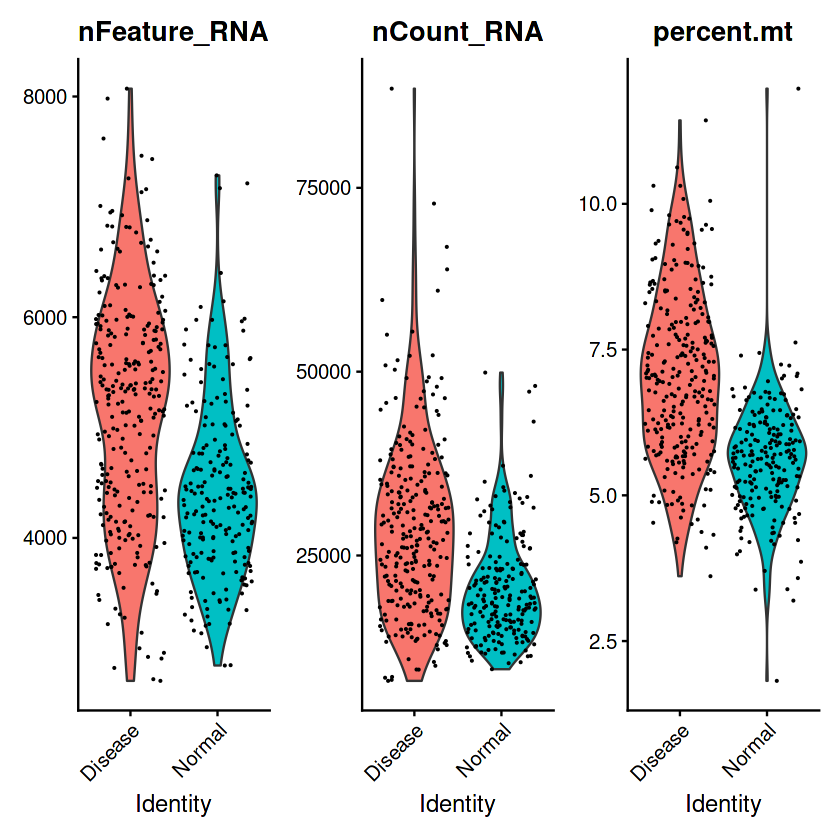

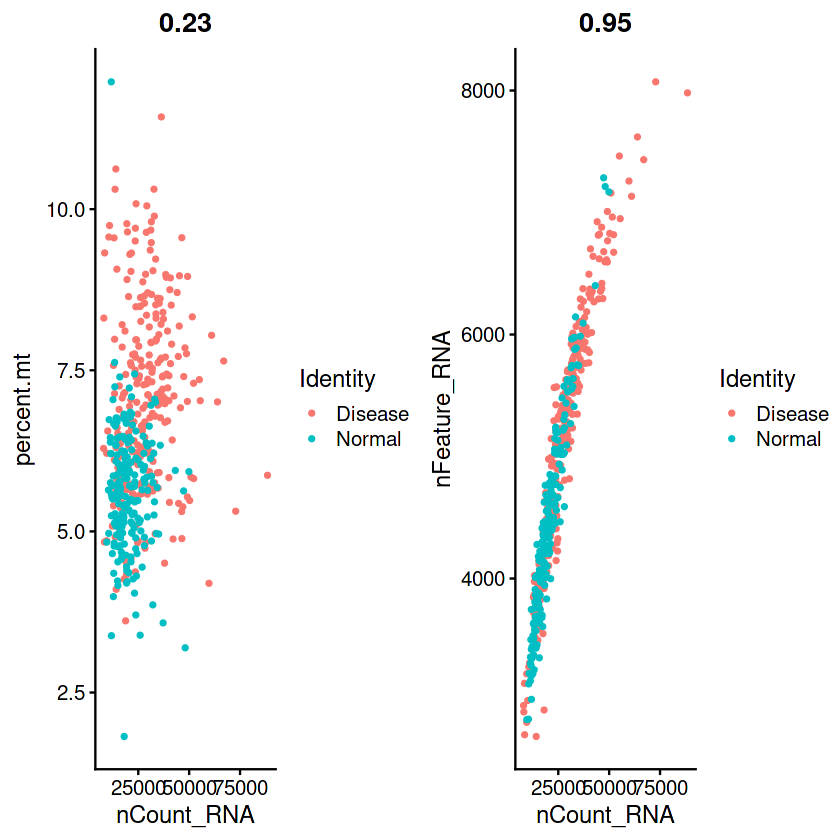

In [11]:
pbmcF[["percent.mt"]] <- PercentageFeatureSet(object = pbmcF, pattern = "^MT-")
VlnPlot(object = pbmcF, features = c("nFeature_RNA", "nCount_RNA", "percent.mt"), ncol = 3)
plot1 <- FeatureScatter(object = pbmcF, feature1 = "nCount_RNA", feature2 = "percent.mt") 
plot2 <- FeatureScatter(object = pbmcF, feature1 = "nCount_RNA", feature2 = "nFeature_RNA") 
CombinePlots(plots = list(plot1,plot2))
#pbmcF <- subset(x = pbmcF, subset = nFeature_RNA > 200 & nFeature_RNA < 2500 & percent.mt < 5)

In [12]:
pbmcF <- NormalizeData(object = pbmcF, normalization.method = "LogNormalize", scale.factor = 1e4)
#pbmc <- NormalizeData(object = pbmc)

In [13]:
levels(pbmcF)

[1] "Disease" "Normal"

In [14]:
pbmcF <- FindVariableFeatures(object = pbmcF,selection.method = 'vst', nfeatures = 2000)
top10 <- head(x = VariableFeatures(object = pbmcF), 10)
plot1 <- VariableFeaturePlot(object = pbmcF)
plot2 <- LabelPoints(plot = plot1, points = top10, repel = TRUE)


When using repel, set xnudge and ynudge to 0 for optimal results



Warning message:
“CombinePlots is being deprecated. Plots should now be combined using the patchwork system.”
Centering and scaling data matrix

Centering and scaling data matrix

Regressing out percent.mt

Centering and scaling data matrix



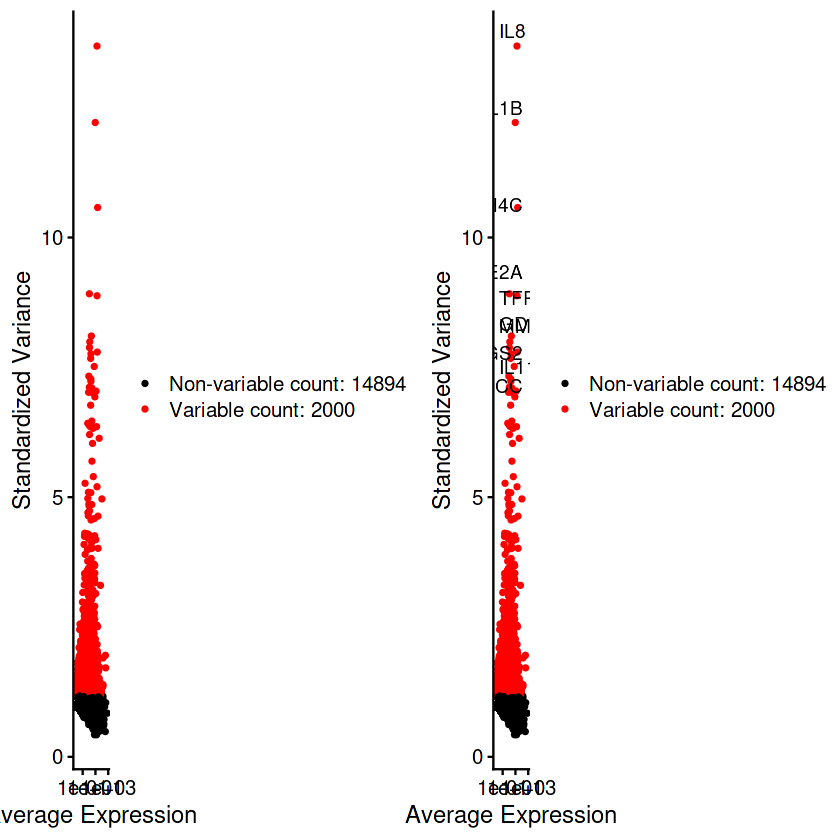

In [15]:
CombinePlots(plots = list(plot1, plot2))
all.genes <- rownames(x = pbmcF)
pbmcF <- ScaleData(object = pbmcF, features = all.genes)
pbmcF <- ScaleData(object = pbmcF)
pbmcF <- ScaleData(object = pbmcF, vars.to.regress = 'percent.mt')


In [16]:
levels(pbmcF)

[1] "Disease" "Normal"

In [17]:
monocyte.de.markers <- FindMarkers(pbmcF, ident.1 = "Normal", ident.2 = "Disease")
# view results
head(monocyte.de.markers)

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
IL8,6.180446e-81,-3.354359,0.034,0.989,1.044124e-76
RPS29,3.375001e-78,2.240193,1.000,1.000,5.701727e-74
MT-ND3,4.330933e-78,1.724440,1.000,1.000,7.316678e-74
RPS27,8.807209e-78,1.728281,1.000,1.000,1.487890e-73
RPL37,1.074620e-77,1.276088,1.000,1.000,1.815463e-73
RPL37A,1.639546e-77,1.361985,1.000,1.000,2.769849e-73


In [24]:
s.genes <- cc.genes$s.genes
g2m.genes <- cc.genes$g2m.genes

In [18]:
write.csv(monocyte.de.markers, file = "~RNAsingle/normvsdiseaseall.csv")

In [ ]:
pbmcF$groups <- sample(c("Normal", "Disease"), size = ncol(pbmcF), replace = TRUE)
features <- c("TSC2","TSC1","MTOR","TRIM21","TPM4","TOM1L1","AKT1","AKT3","EIF4E","LAMTOR2","PRKCA","RICTOR")
VlnPlot(pbmcF, features = features)


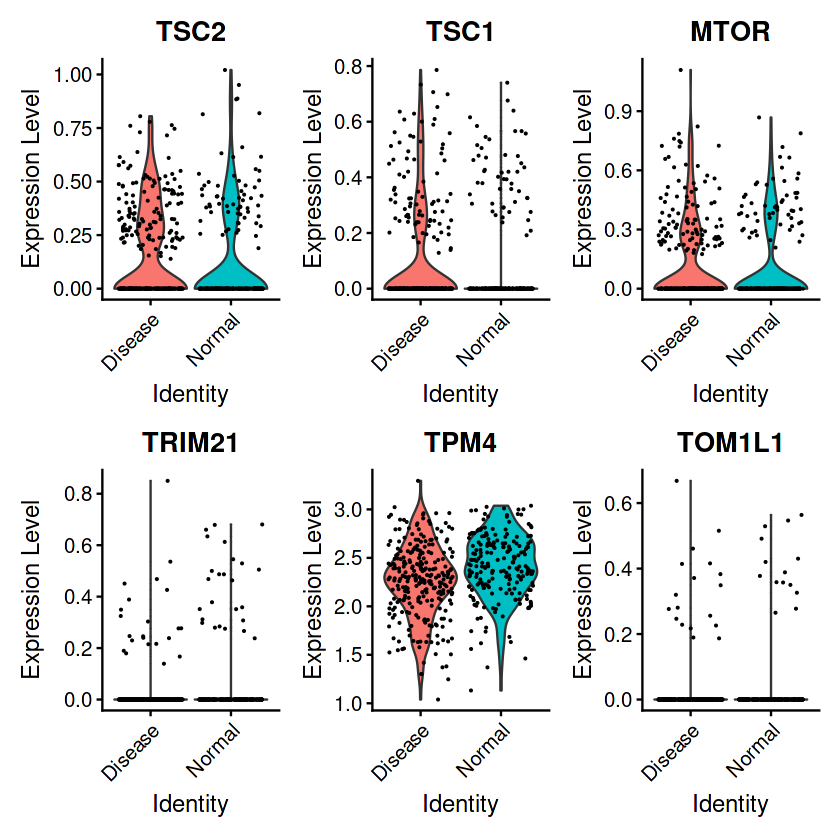

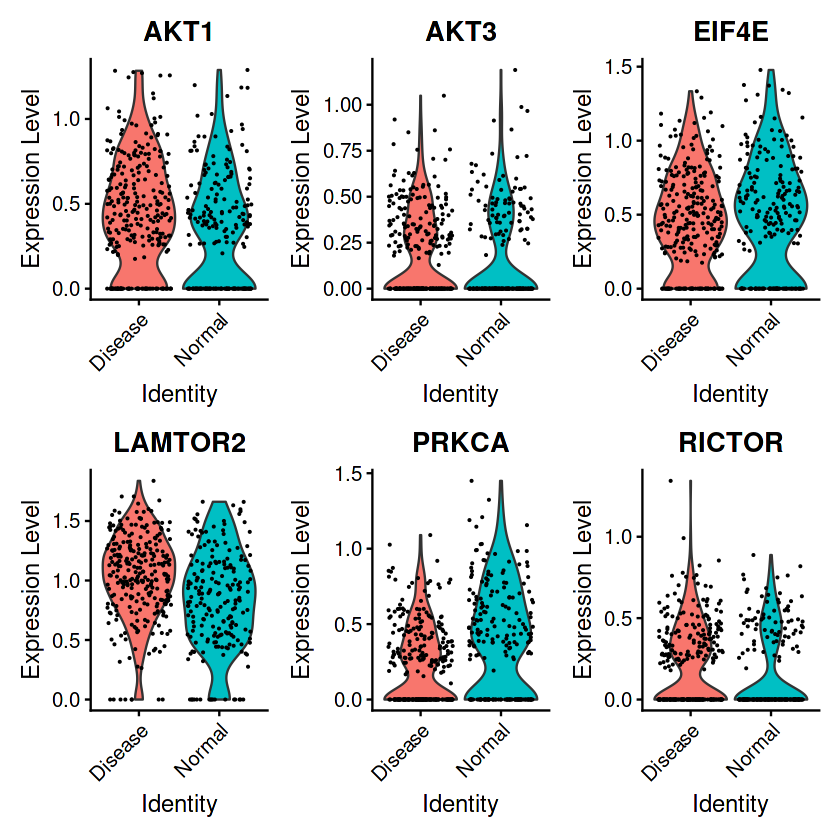

Warning message in FetchData(object = object, vars = features, slot = slot):
“The following requested variables were not found: RAS, GRK3”


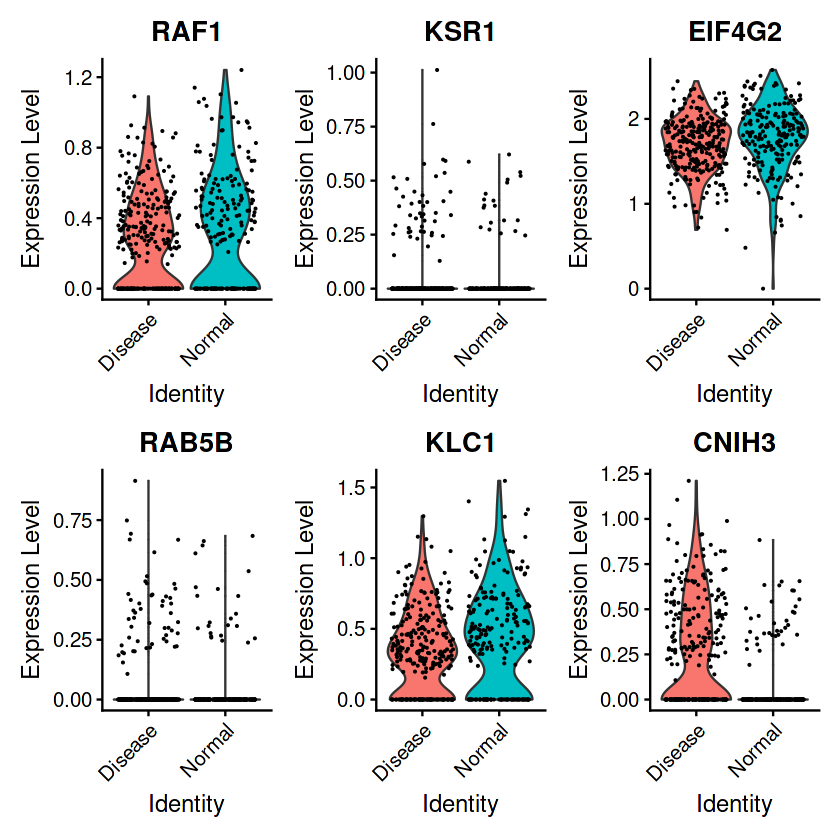

Warning message in FetchData(object = object, vars = features, slot = slot):
“The following requested variables were not found: ATP5PF, ATP5F1B”


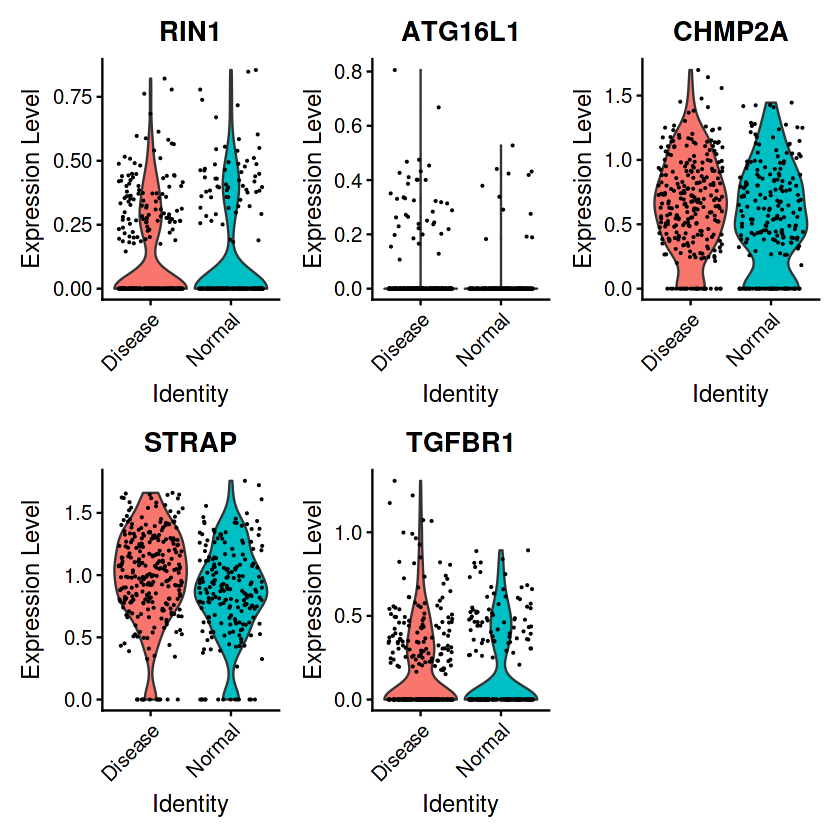

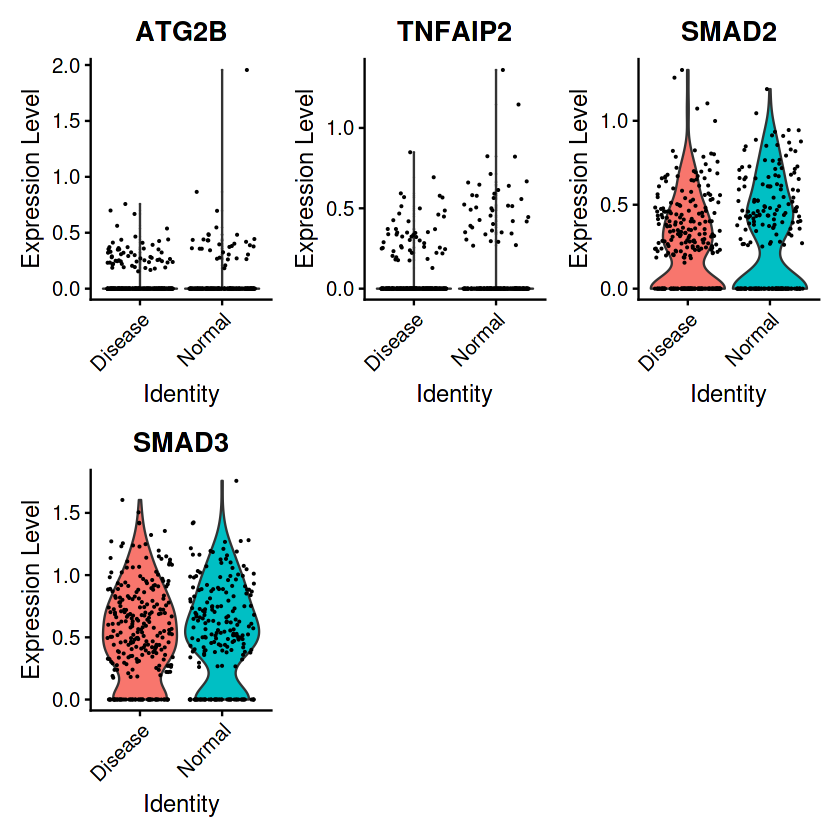

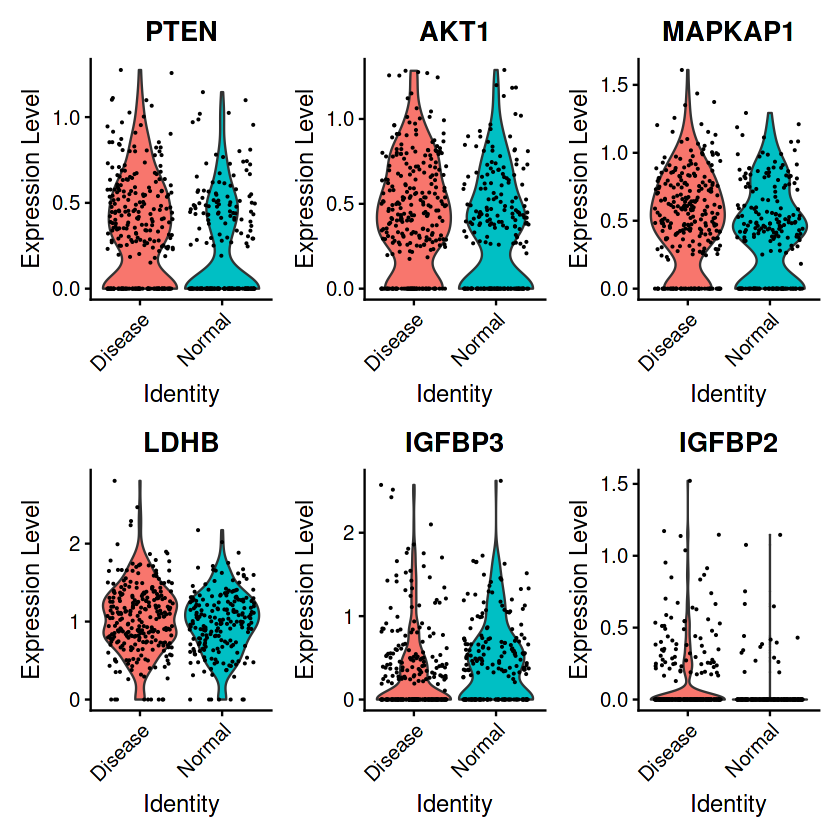

Warning message in FetchData(object = object, vars = features, slot = slot):
“The following requested variables were not found: ATP5PF, ATP5F1B”


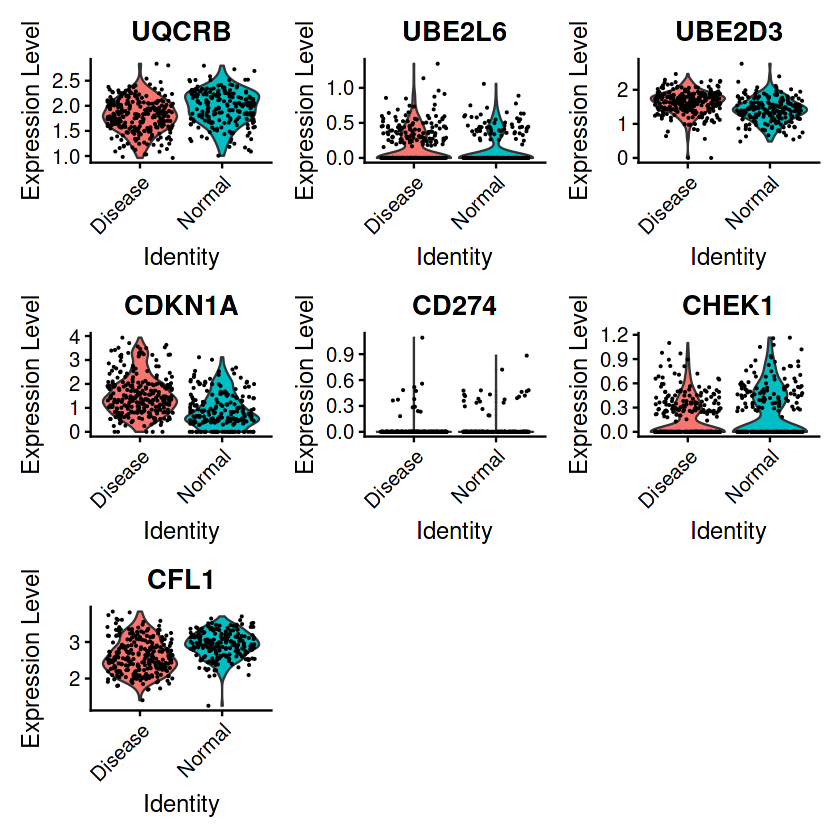

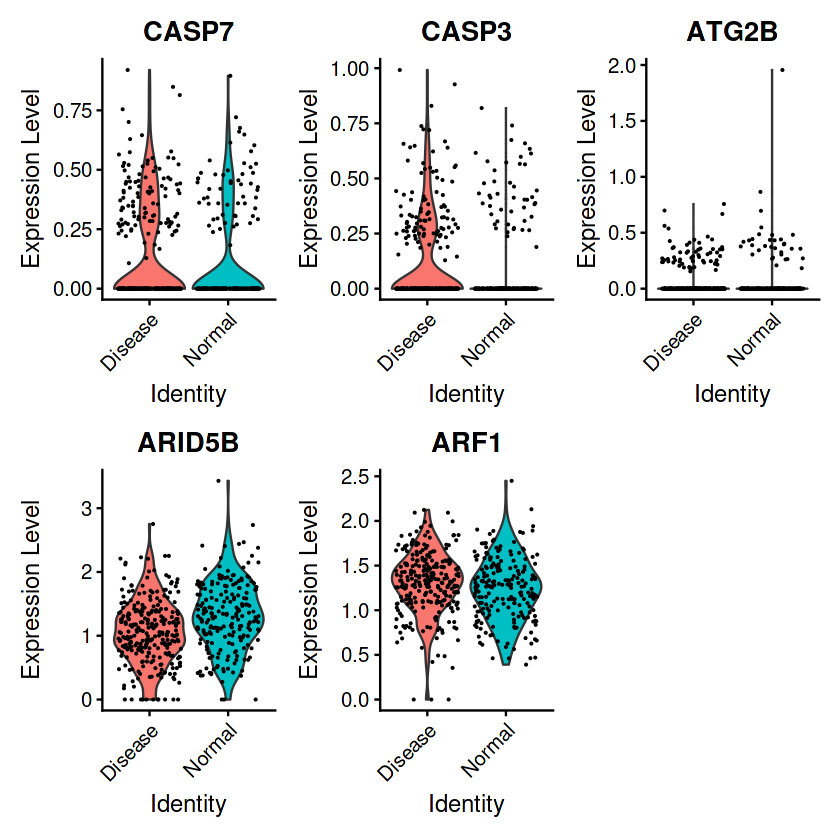

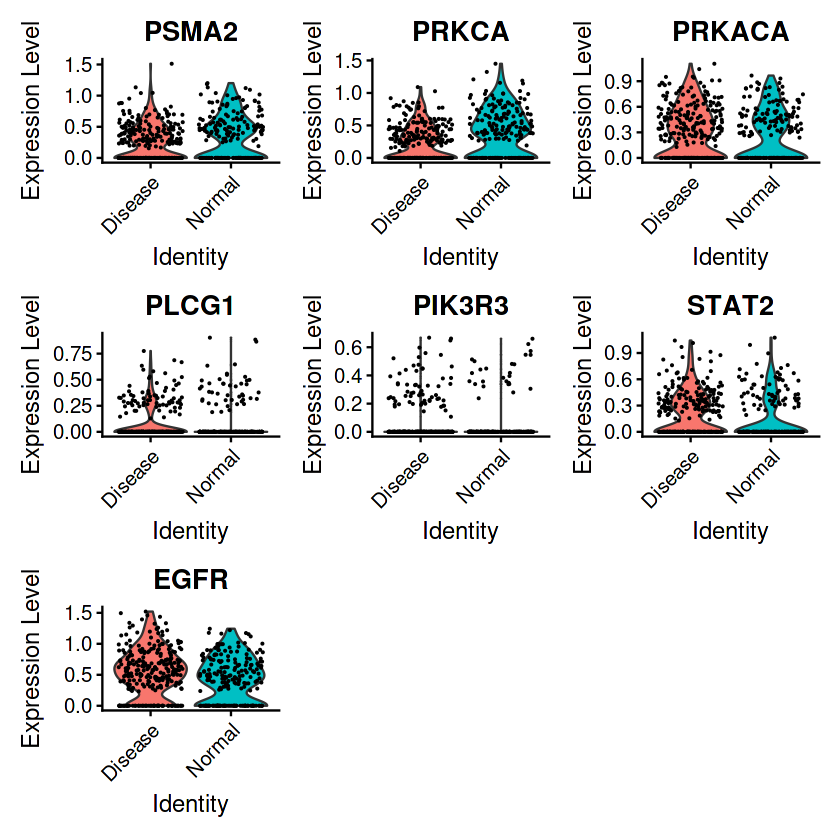

Warning message in FetchData(object = object, vars = features, slot = slot):
“The following requested variables were not found: NDUFB8”


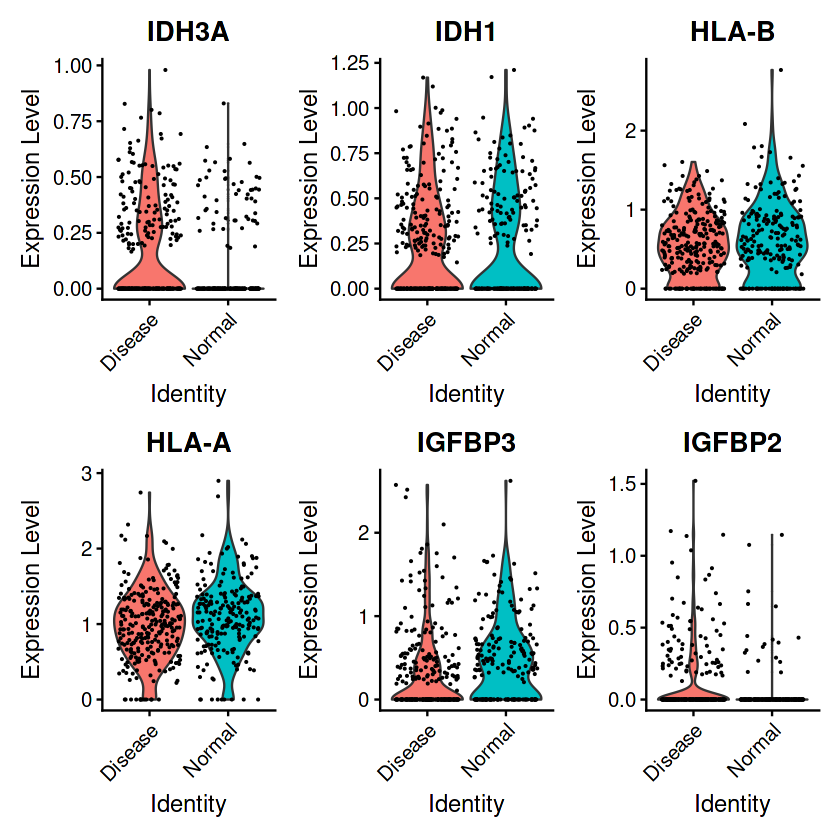

Warning message in FetchData(object = object, vars = features, slot = slot):
“The following requested variables were not found: NDUFA7”


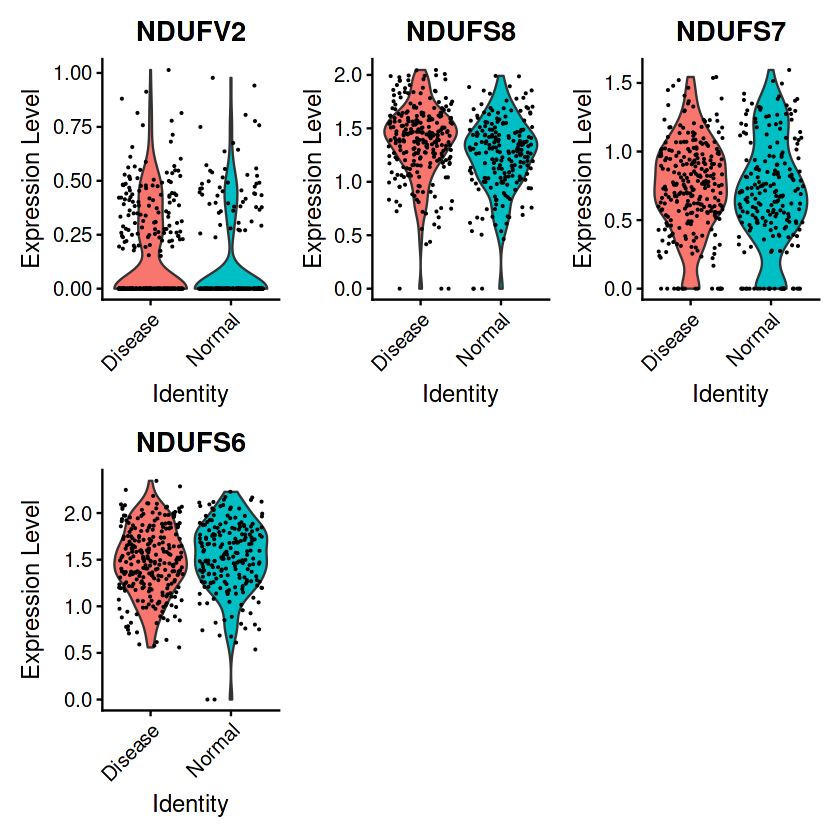

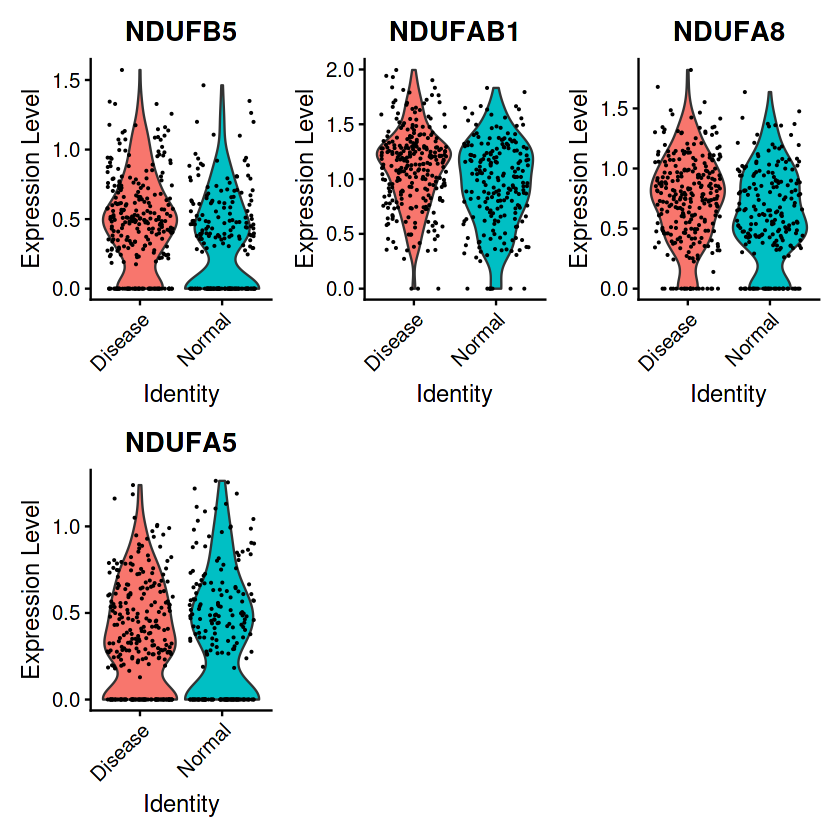

In [19]:
pbmcF$groups <- sample(c("Normal", "Disease"), size = ncol(pbmcF), replace = TRUE)
features <- c("TSC2","TSC1","MTOR","TRIM21","TPM4","TOM1L1","AKT1","AKT3","EIF4E","LAMTOR2","PRKCA","RICTOR")
VlnPlot(pbmcF, features = features)
features <- c("AKT1","AKT3","EIF4E","LAMTOR2","PRKCA","RICTOR")
VlnPlot(pbmcF, features = features)
features <- c("RAF1","KSR1","EIF4G2","RAB5B","KLC1","CNIH3")
VlnPlot(pbmcF, features = features)
features <- c("RAS","RIN1","ATG16L1","CHMP2A","GRK3","STRAP","TGFBR1")

VlnPlot(pbmcF, features = features)
features <- c("ATP5PF","ATP5F1B","ATG2B","TNFAIP2","SMAD2", "SMAD3")
VlnPlot(pbmcF, features = features)
features <- c("PTEN","AKT1","MAPKAP1","LDHB","IGFBP3","IGFBP2")
VlnPlot(pbmcF, features = features)
features <- c("UQCRB","UBE2L6","UBE2D3","CDKN1A","CD274","CHEK1","CFL1")
VlnPlot(pbmcF, features = features)
features <- c("CASP7","CASP3","ATP5PF","ATP5F1B","ATG2B","ARID5B","ARF1")
VlnPlot(pbmcF, features = features)
features <- c("PSMA2","PRKCA","PRKACA","PLCG1","PIK3R3","STAT2","EGFR")
VlnPlot(pbmcF, features = features)
features <- c("IDH3A","IDH1","HLA-B","HLA-A","IGFBP3","IGFBP2")
VlnPlot(pbmcF, features = features)
features <- c("NDUFV2","NDUFS8","NDUFS7","NDUFS6","NDUFB8")
VlnPlot(pbmcF, features = features)
features <- c("NDUFB5","NDUFAB1","NDUFA8","NDUFA7","NDUFA5")
VlnPlot(pbmcF, features = features)


Warning message in FetchData(object = object, vars = features, slot = slot):
“The following requested variables were not found: NOTCH2NLB, H3C10, RACK1, TMPPE”


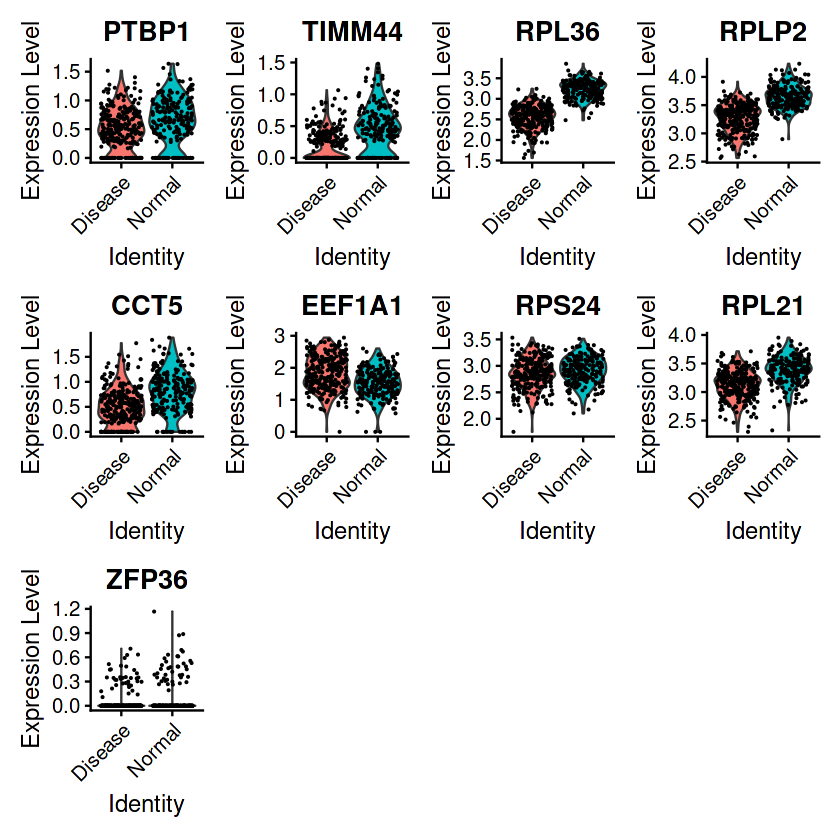

Warning message in FetchData(object = object, vars = features, slot = slot):
“The following requested variables were not found: H2BC4, NOTCH2NLB, H3C10”


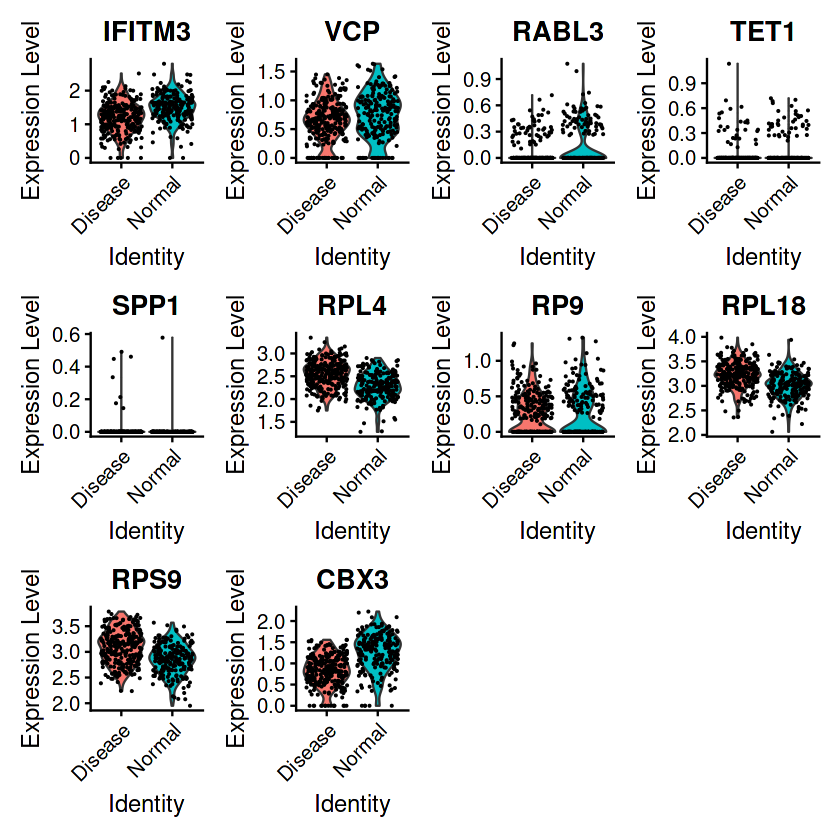

Warning message in FetchData(object = object, vars = features, slot = slot):
“The following requested variables were not found: H2BC4”


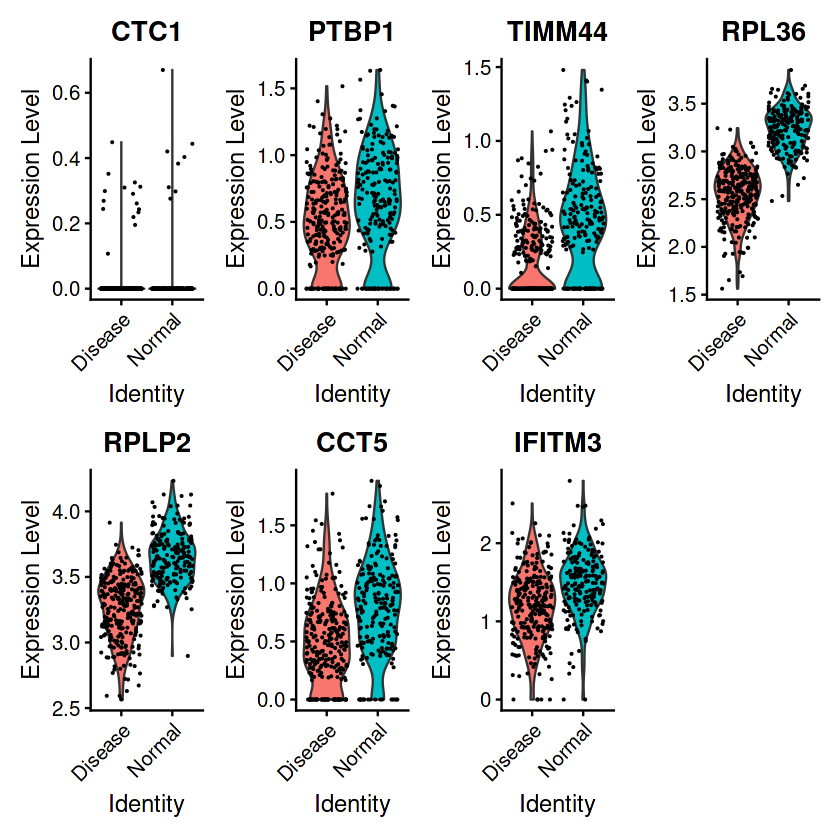

Warning message in FetchData(object = object, vars = features, slot = slot):
“The following requested variables were not found: SLC22A12”


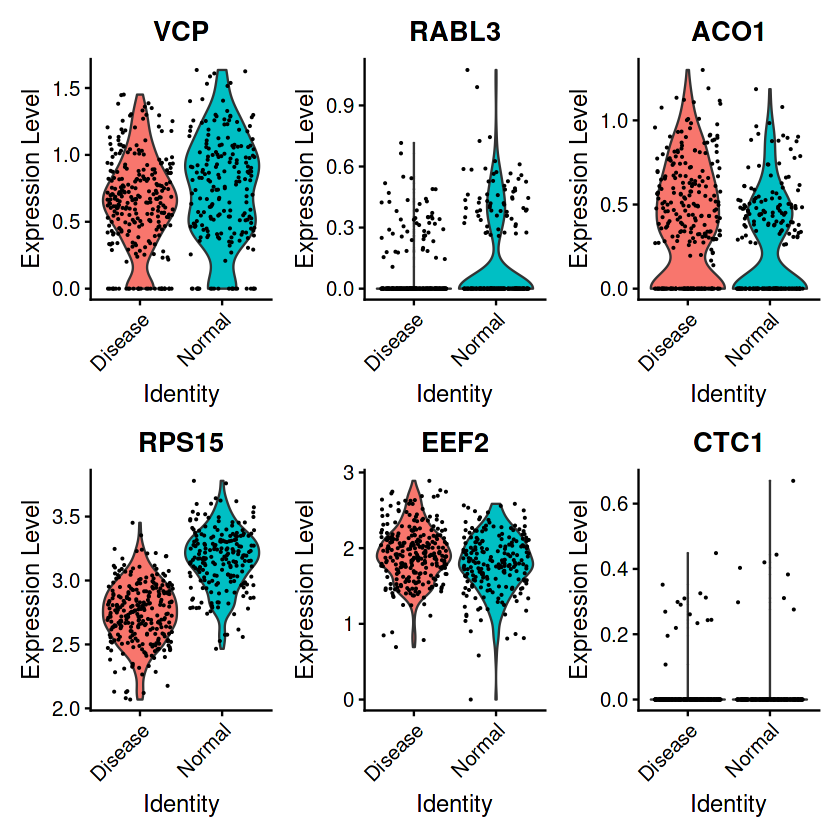

Warning message in FetchData(object = object, vars = features, slot = slot):
“The following requested variables were not found: TNS2, PTPN6”


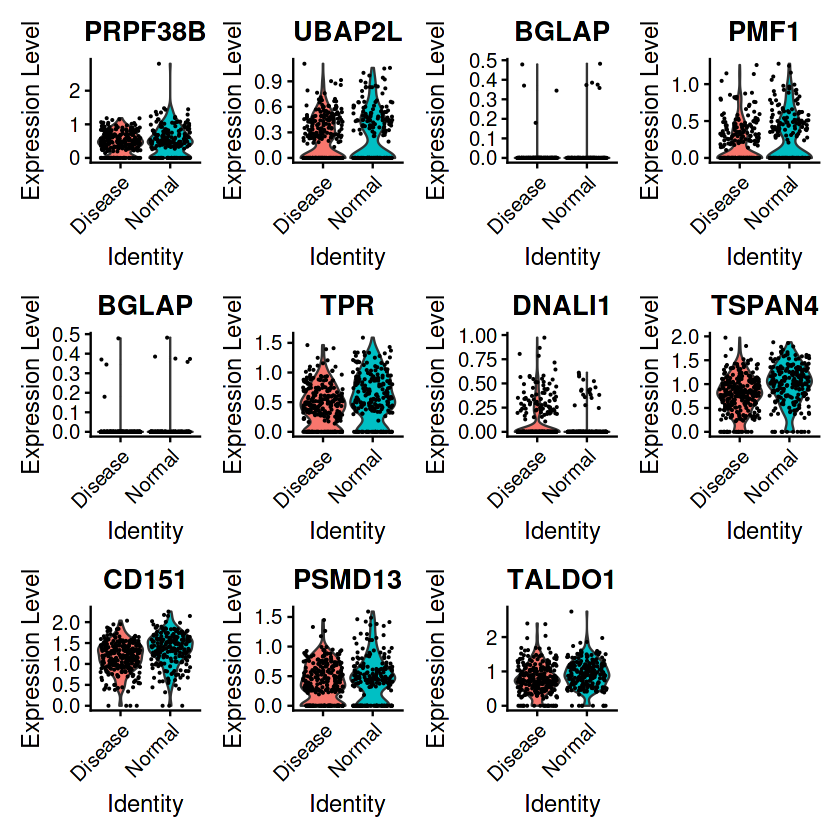

Warning message in FetchData(object = object, vars = features, slot = slot):
“The following requested variables were not found: KNL1, WFIKKN1”


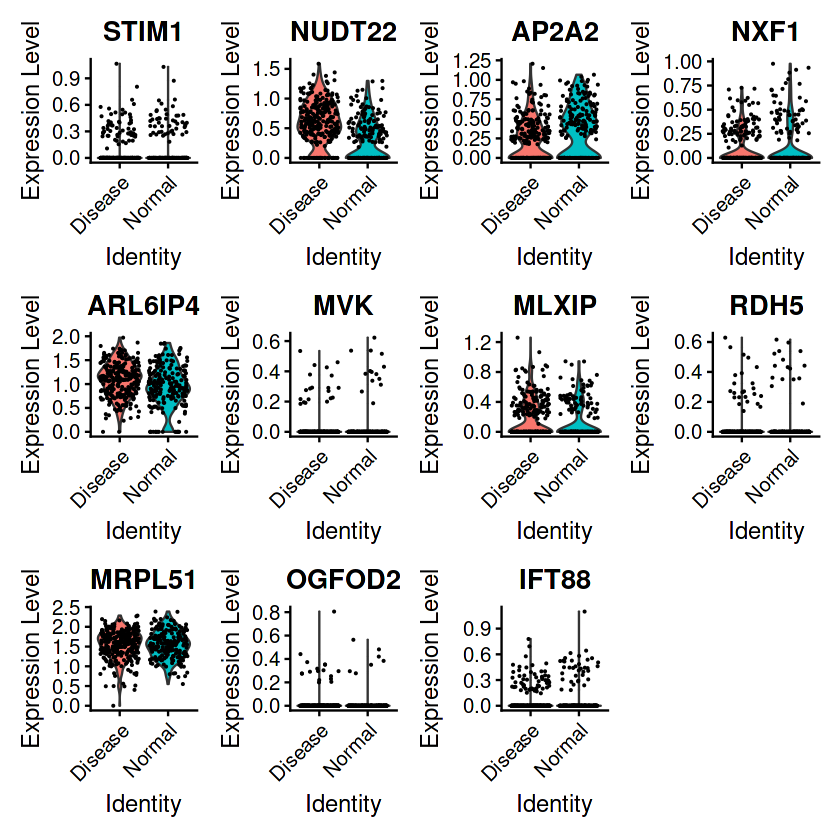

Warning message in FetchData(object = object, vars = features, slot = slot):
“The following requested variables were not found: EIF3CL, CCDC103, NXPH3”


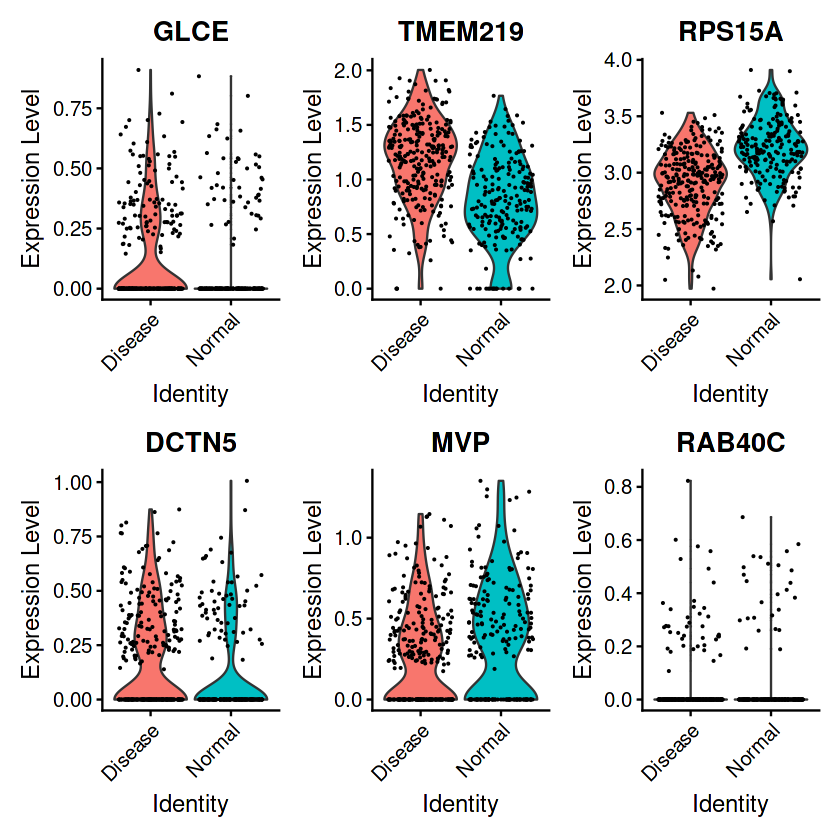

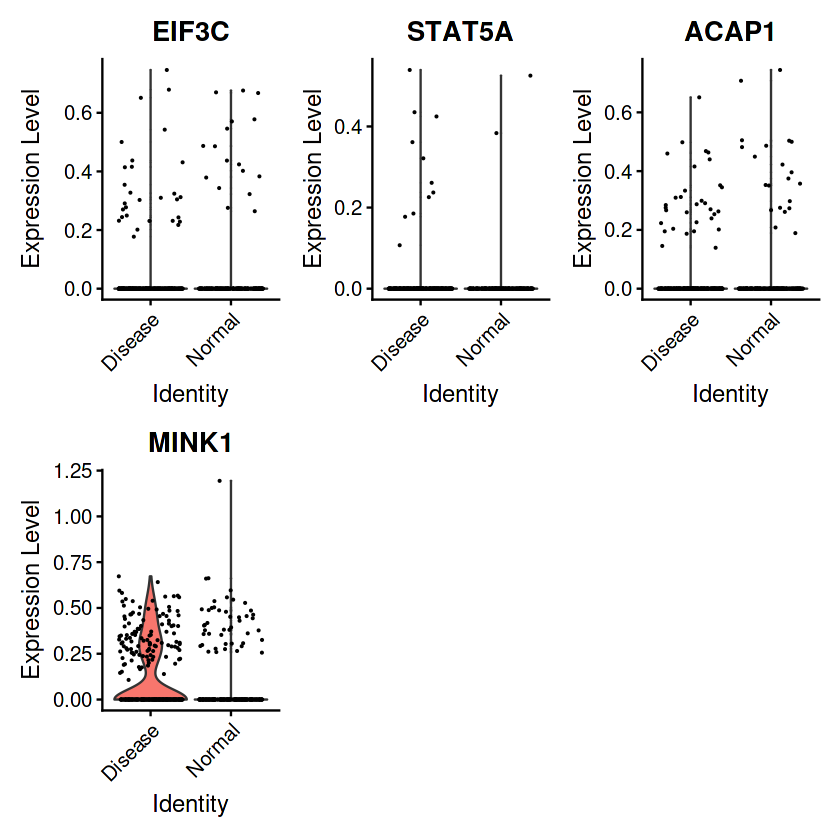

Warning message in FetchData(object = object, vars = features, slot = slot):
“The following requested variables were not found: ATP5F1D, ZSCAN1”


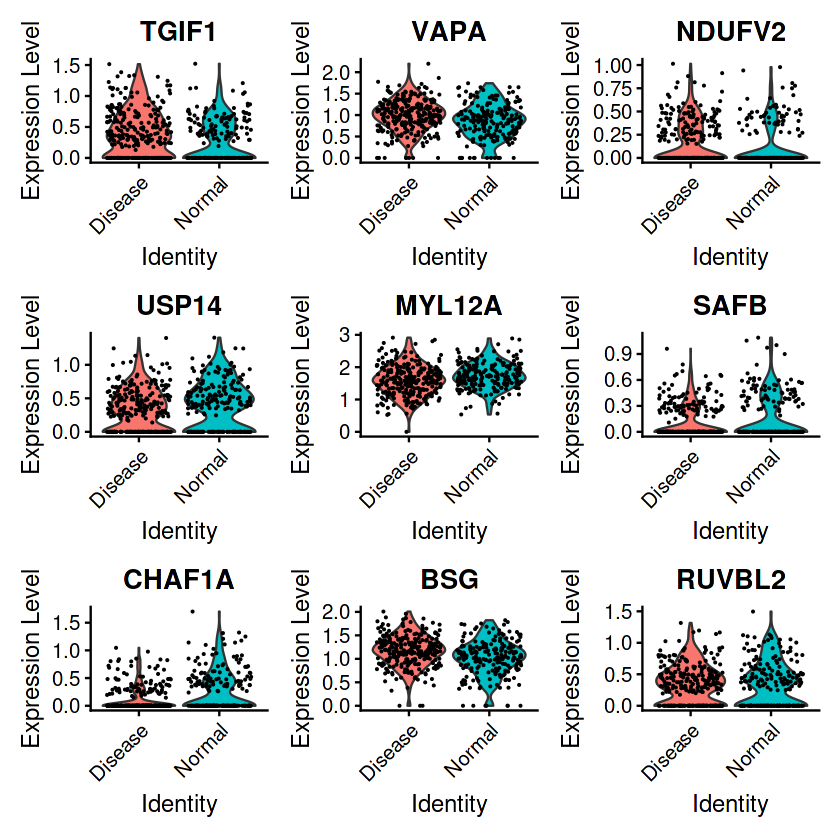

Warning message in FetchData(object = object, vars = features, slot = slot):
“The following requested variables were not found: PSD4”


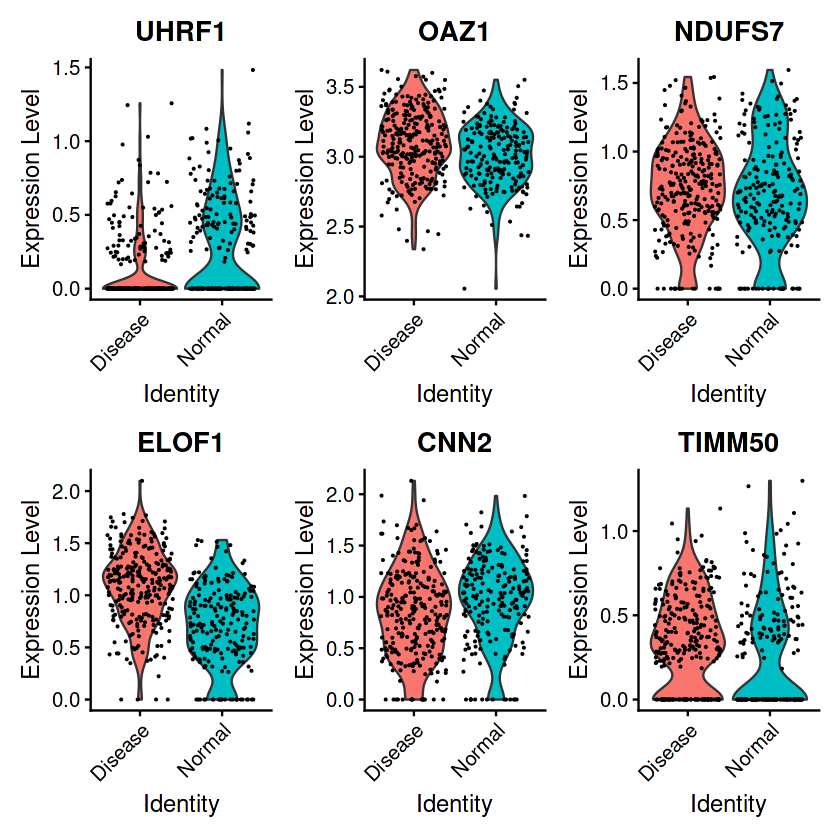

Warning message in FetchData(object = object, vars = features, slot = slot):
“The following requested variables were not found: CSPG5, SLC38A3”


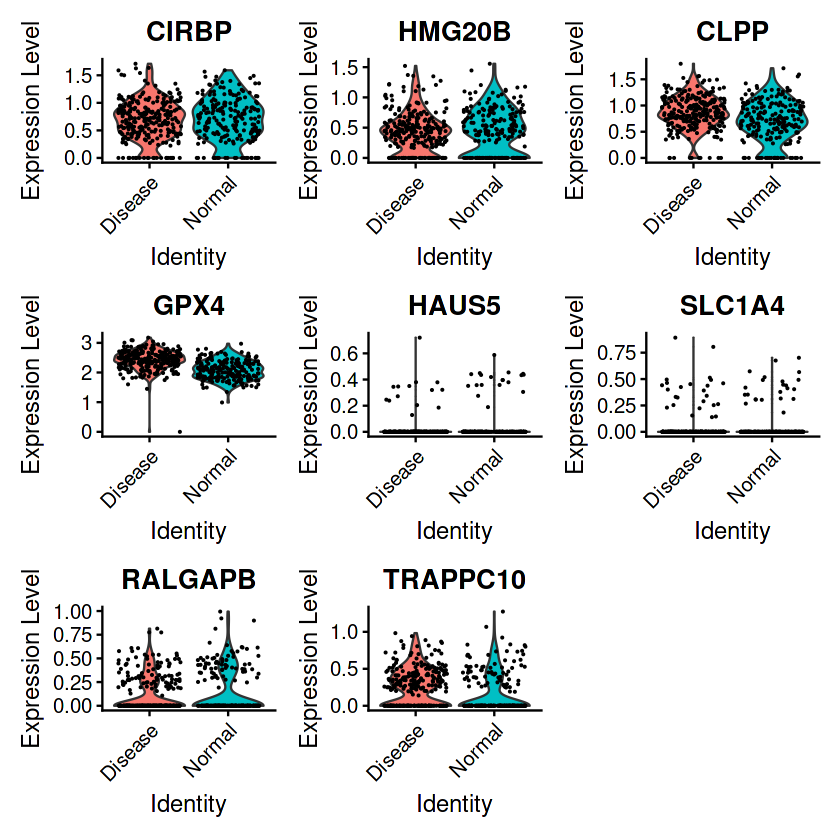

Warning message in FetchData(object = object, vars = features, slot = slot):
“The following requested variables were not found: TLR9, ART3, TARS1, H2AC7, H3C4”


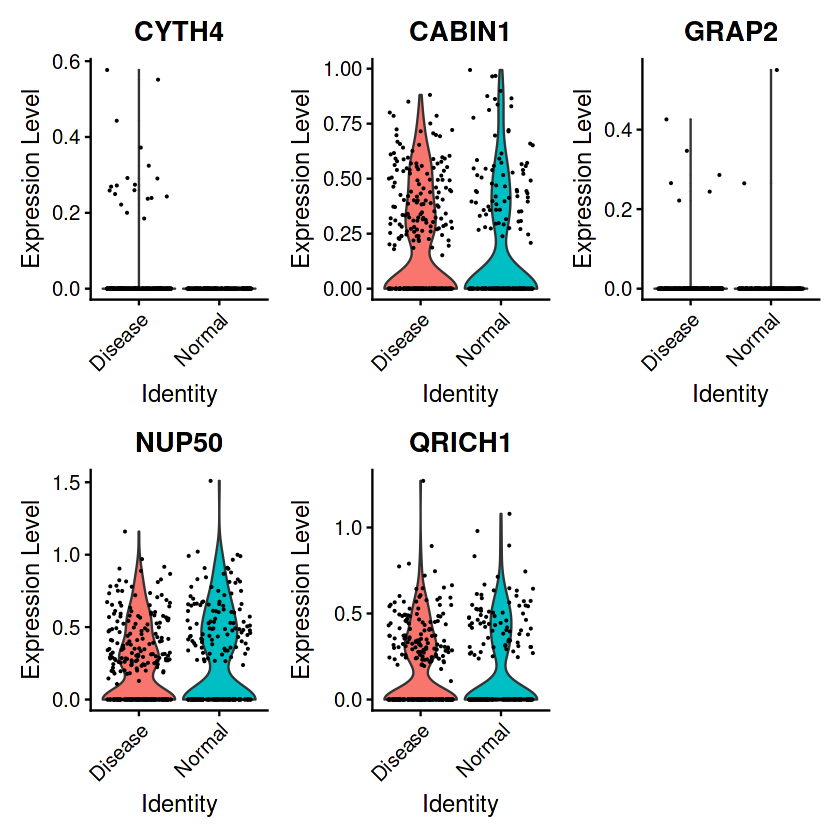

Warning message in FetchData(object = object, vars = features, slot = slot):
“The following requested variables were not found: NRCAM, NCF1”


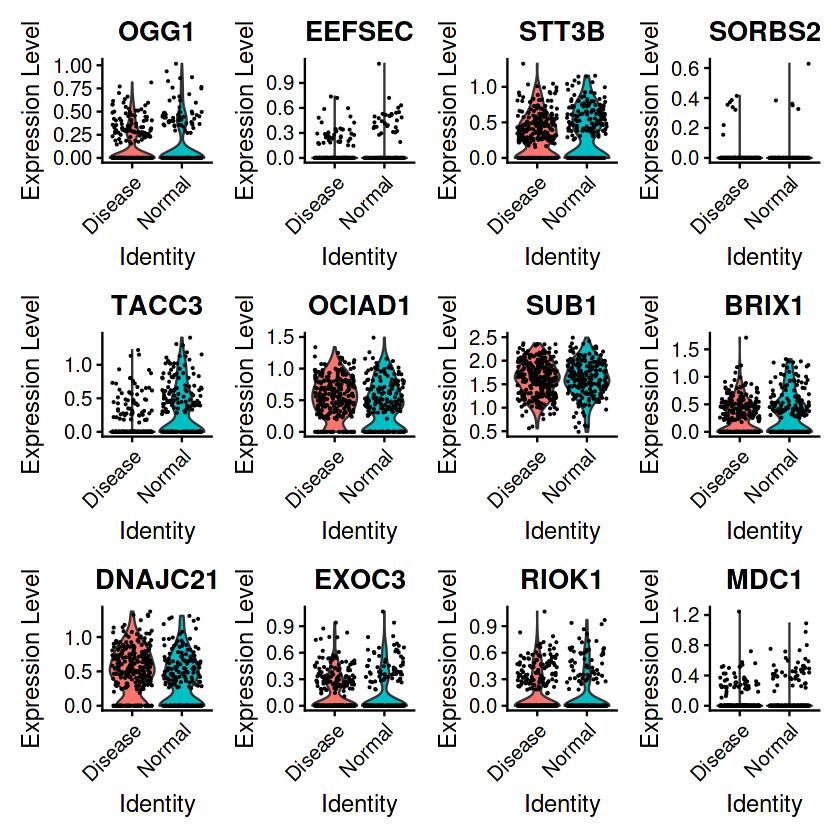

Warning message in FetchData(object = object, vars = features, slot = slot):
“The following requested variables were not found: MED14OS, RPLP36”


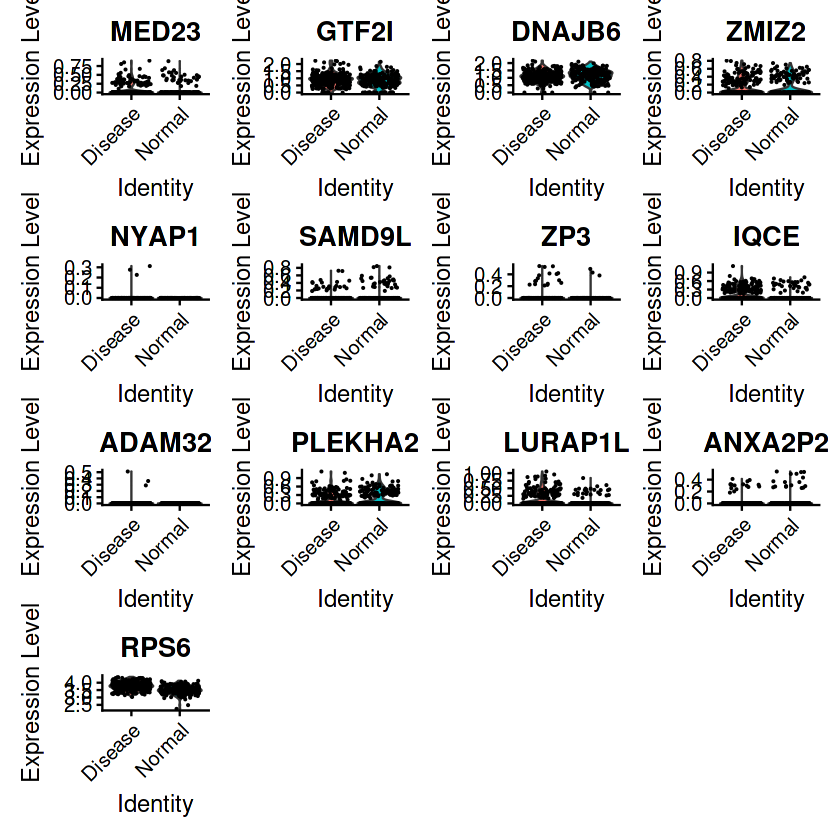

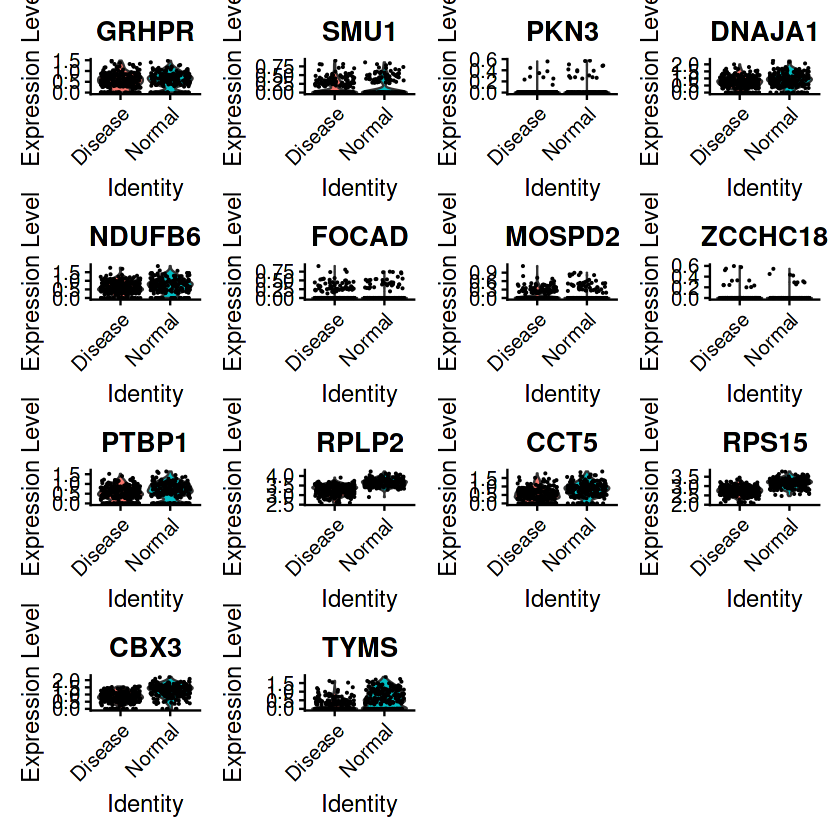

Warning message in FetchData(object = object, vars = features, slot = slot):
“The following requested variables were not found: H3C10”


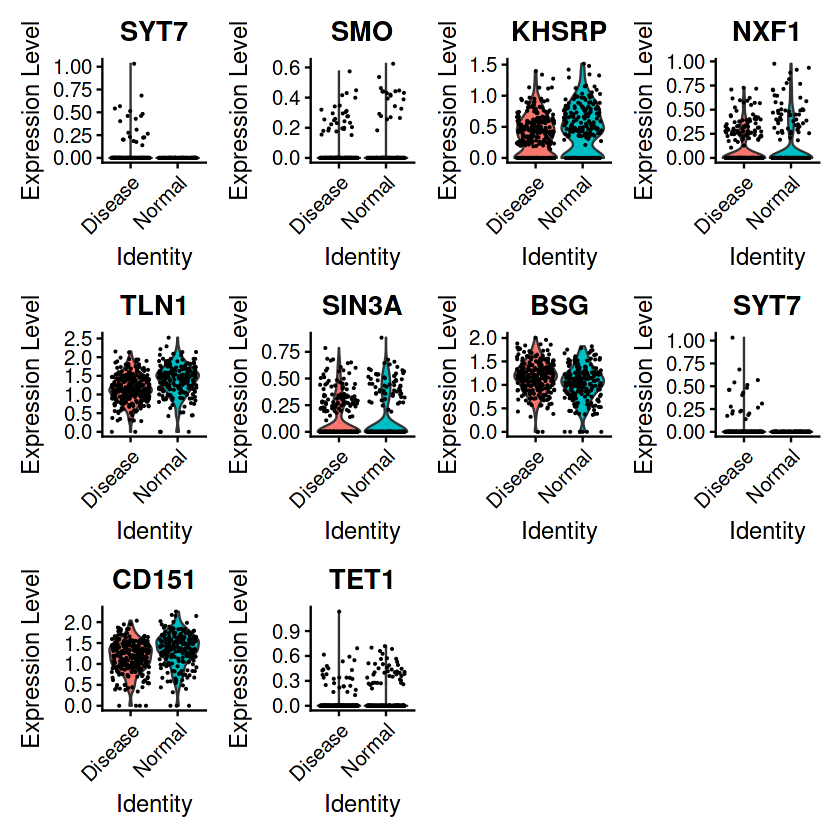

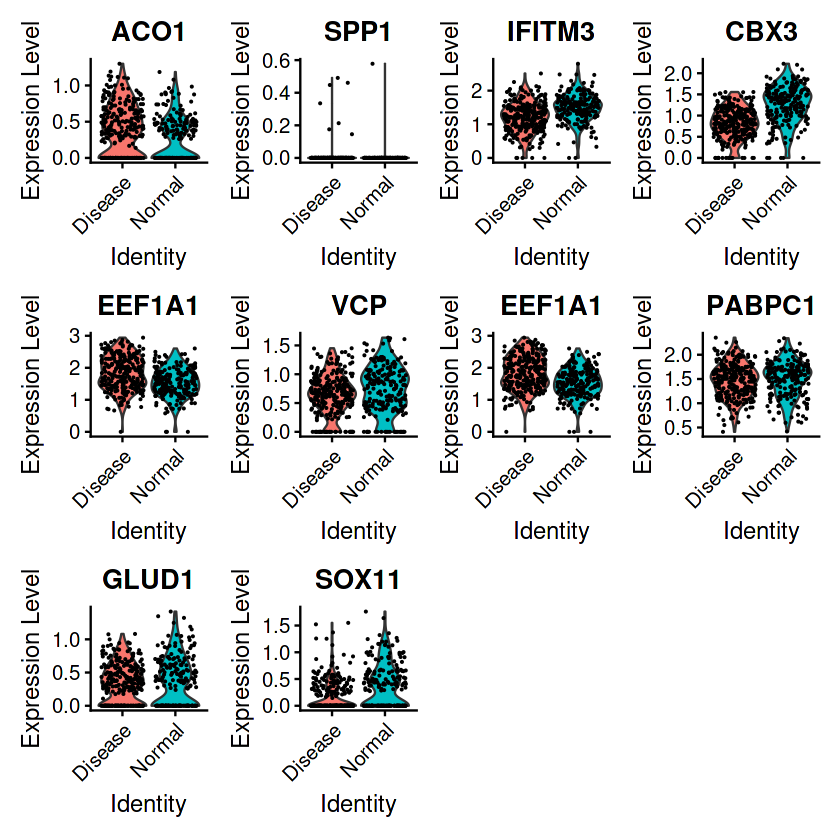

In [20]:
pbmcF$groups <- sample(c("Normal", "Disease"), size = ncol(pbmcF), replace = TRUE)
features <- c("PTBP1","TIMM44","RPL36","NOTCH2NLB","RPLP2","H3C10","CCT5","EEF1A1","RACK1","RPS24","TMPPE","RPL21","ZFP36")
VlnPlot(pbmcF, features = features)
pbmcF$groups <- sample(c("Normal", "Disease"), size = ncol(pbmcF), replace = TRUE)
features <- c("TSC2","TSC1","MTOR","TRIM21","TPM4","TOM1L1","AKT1","AKT3","EIF4E","LAMTOR2","PRKCA","RICTOR","RAF1","KSR1","EIF4G2","RAB5B","KLC1","CNIH3","RAS","RIN1","ATG16L1","CHMP2A","GRK3","STRAP","TGFBR1")
VlnPlot(pbmcF, features = features)

pbmcF$groups <- sample(c("Normal", "Disease"), size = ncol(pbmcF), replace = TRUE)
features <- c("PTBP1","TIMM44","RPL36","NOTCH2NLB","RPLP2","H3C10","CCT5","EEF1A1","RACK1","RPS24","TMPPE","RPL21","ZFP36")
VlnPlot(pbmcF, features = features)
features <- c("IFITM3","VCP","RABL3","TET1","SPP1","RPL4","RP9","RPL18","RPS9","CBX3")
VlnPlot(pbmcF, features = features)
features <- c("CTC1","H2BC4","PTBP1","TIMM44","RPL36","NOTCH2NLB","RPLP2","H3C10","CCT5","IFITM3")
VlnPlot(pbmcF, features = features)
features <- c("VCP","RABL3","ACO1","RPS15","EEF2","CTC1","H2BC4")
VlnPlot(pbmcF, features = features)
features <- c("PRPF38B","UBAP2L","BGLAP","PMF1","BGLAP","TPR","DNALI1","TSPAN4","CD151","SLC22A12","PSMD13","TALDO1")
VlnPlot(pbmcF, features = features)
features <- c("STIM1","NUDT22","AP2A2","NXF1","TNS2","ARL6IP4","PTPN6","MVK","MLXIP","RDH5","MRPL51","OGFOD2","IFT88")
VlnPlot(pbmcF, features = features)
features <- c("KNL1","GLCE","TMEM219","RPS15A","DCTN5","MVP","RAB40C","WFIKKN1")
VlnPlot(pbmcF, features = features)
features <- c("EIF3C","EIF3CL","STAT5A","ACAP1","CCDC103","NXPH3","MINK1")
VlnPlot(pbmcF, features = features)
features <- c("TGIF1","VAPA","NDUFV2","USP14","MYL12A","SAFB","CHAF1A","BSG","RUVBL2")
VlnPlot(pbmcF, features = features)
features <- c("UHRF1","OAZ1","NDUFS7","ELOF1","CNN2","TIMM50","ATP5F1D","ZSCAN1")
VlnPlot(pbmcF, features = features)
features <- c("CIRBP","HMG20B","CLPP","GPX4","HAUS5","SLC1A4","PSD4","RALGAPB","TRAPPC10")
VlnPlot(pbmcF, features = features)
features <- c("CYTH4","CABIN1","GRAP2","NUP50","QRICH1","CSPG5","SLC38A3")
VlnPlot(pbmcF, features = features)
features <- c("TLR9","OGG1","EEFSEC","STT3B","ART3","SORBS2","TACC3","OCIAD1","TARS1","SUB1","BRIX1","DNAJC21","EXOC3","H2AC7","H3C4","RIOK1","MDC1")
VlnPlot(pbmcF, features = features)
features <- c("MED23","GTF2I","DNAJB6","NRCAM","ZMIZ2","NYAP1","SAMD9L","ZP3","IQCE","NCF1","ADAM32","PLEKHA2","LURAP1L","ANXA2P2","RPS6")
VlnPlot(pbmcF, features = features)
features <- c("GRHPR","SMU1","PKN3","DNAJA1","NDUFB6","FOCAD","MOSPD2","ZCCHC18","MED14OS","PTBP1","RPLP2","CCT5","RPS15","RPLP36","CBX3","TYMS")
VlnPlot(pbmcF, features = features)
features <- c("SYT7","SMO","KHSRP","NXF1","TLN1","SIN3A","BSG","SYT7","CD151","TET1")
VlnPlot(pbmcF, features = features)
features <- c("ACO1","SPP1","IFITM3","CBX3","EEF1A1","VCP","H3C10","EEF1A1","PABPC1","GLUD1","SOX11")
VlnPlot(pbmcF, features = features)

Warning message in FetchData(object = object, vars = features, slot = slot):
“The following requested variables were not found: H3C10”
Warning message in FetchData(object = object, vars = features, slot = slot):
“The following requested variables were not found: NRCAM”


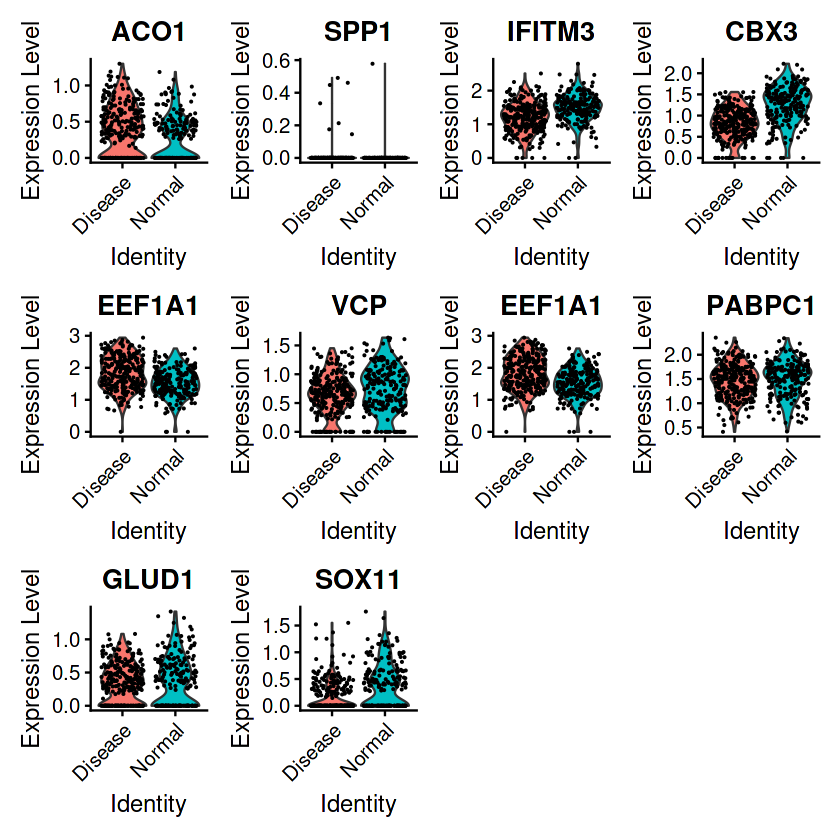

Warning message in FetchData(object = object, vars = features, slot = slot):
“The following requested variables were not found: NCF1”


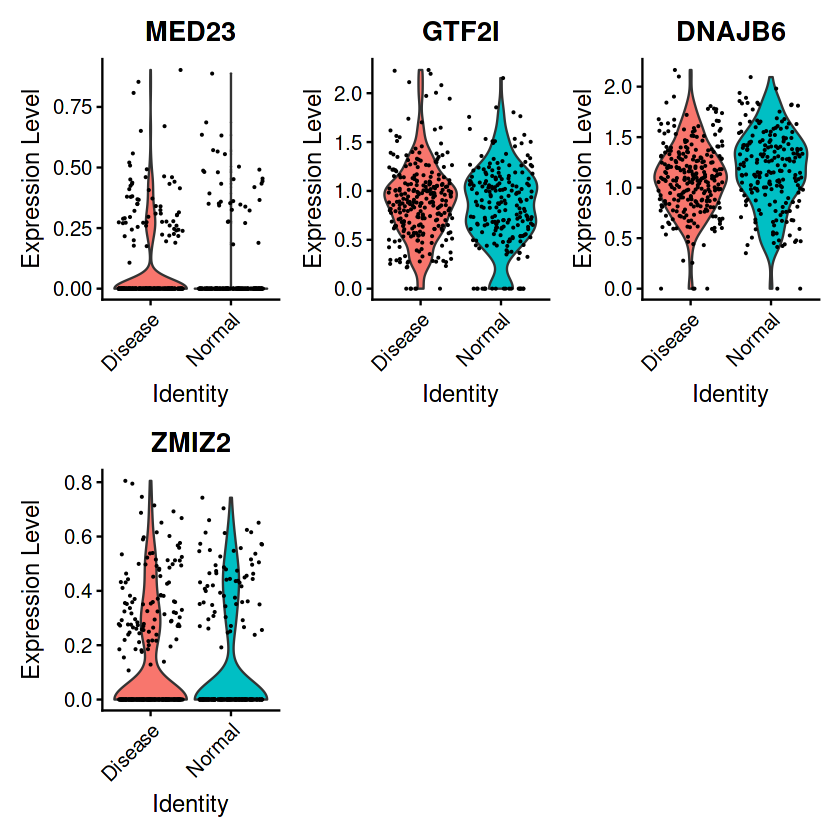

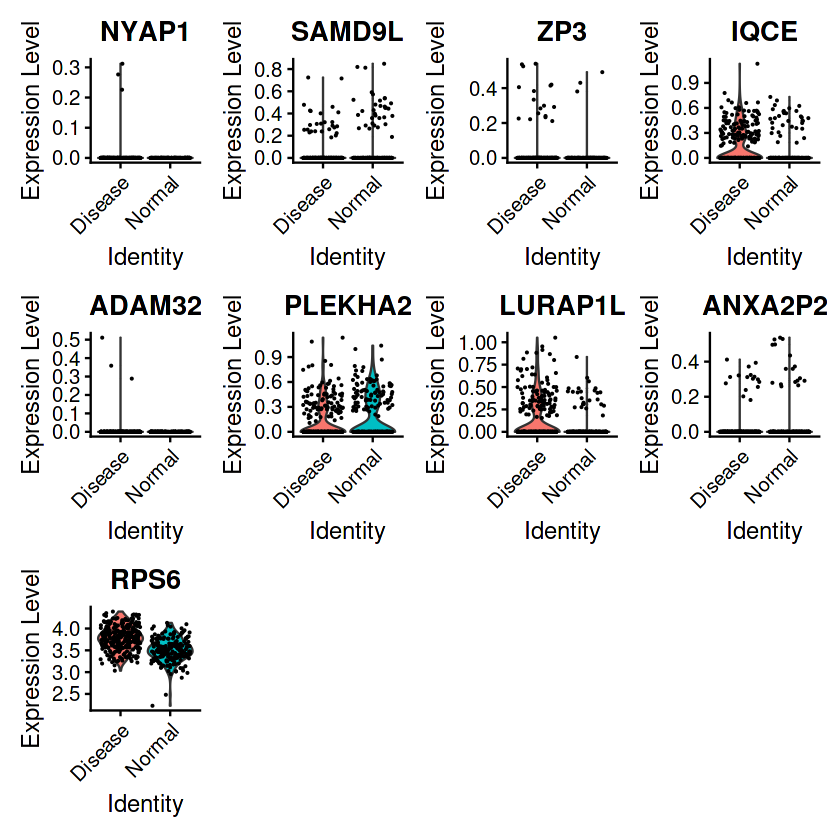

Warning message in FetchData(object = object, vars = features, slot = slot):
“The following requested variables were not found: MED14OS, RPLP36”


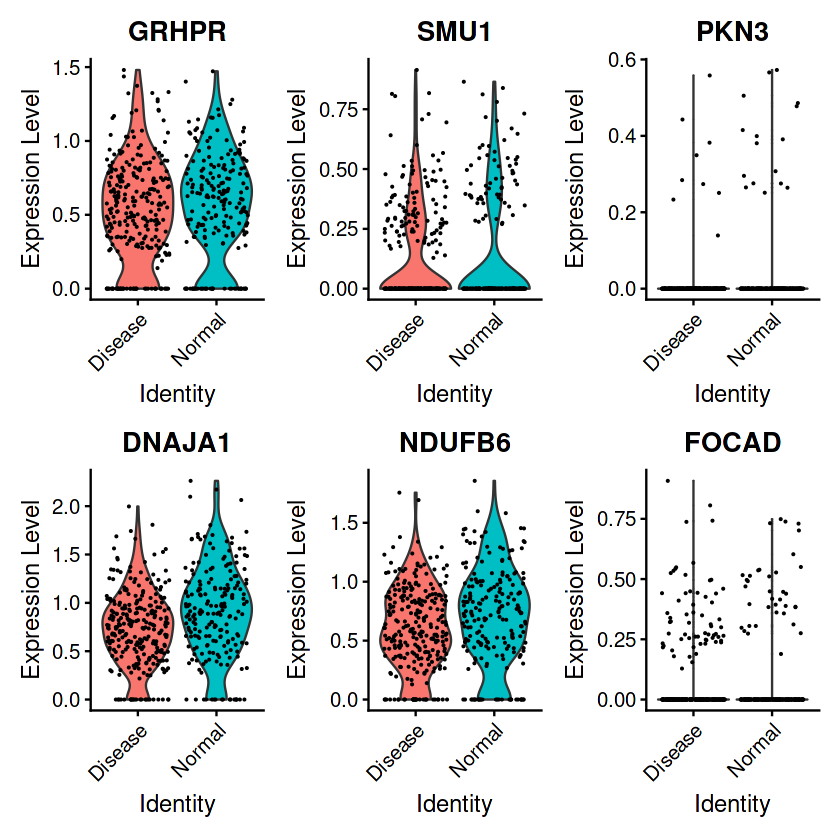

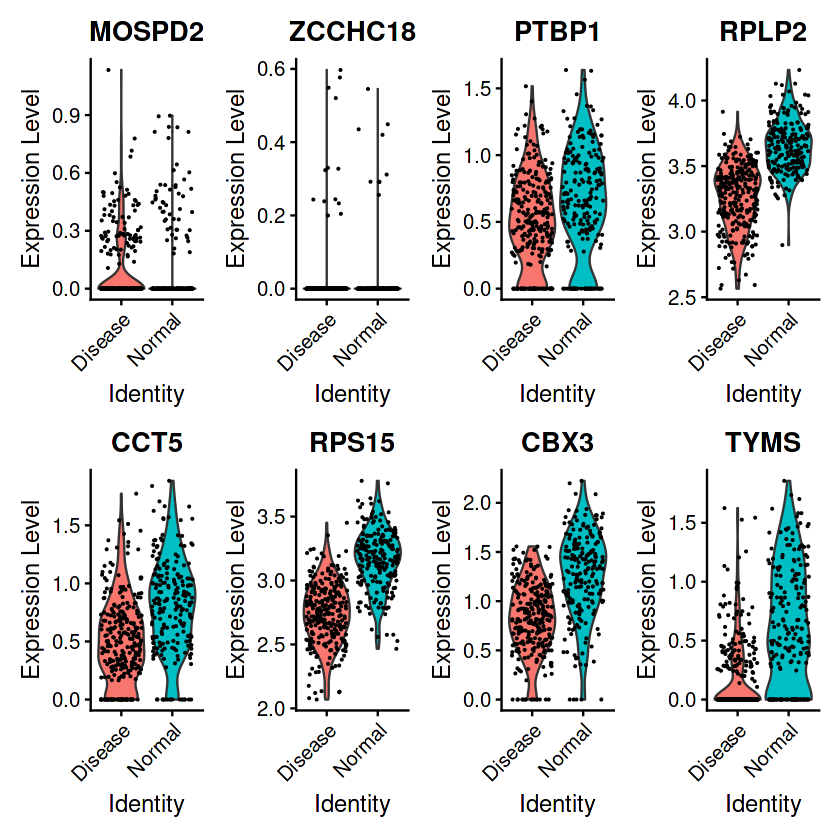

Warning message in FetchData(object = object, vars = features, slot = slot):
“The following requested variables were not found: H3C10”


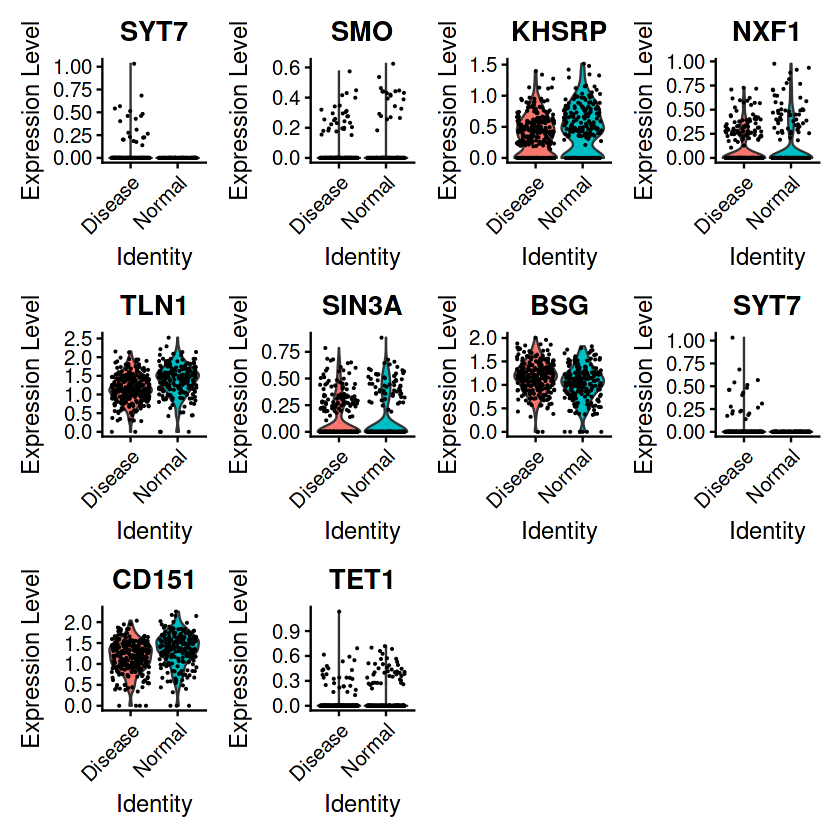

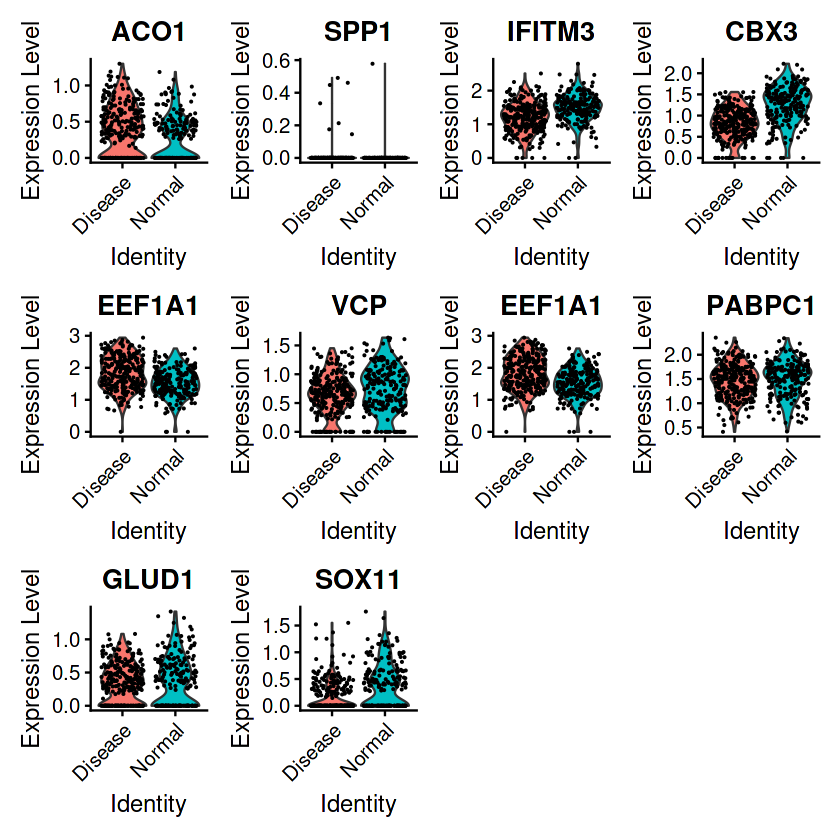

In [21]:
VlnPlot(pbmcF, features = features)
features <- c("MED23","GTF2I","DNAJB6","NRCAM","ZMIZ2")
VlnPlot(pbmcF, features = features)
features <- c("NYAP1","SAMD9L","ZP3","IQCE","NCF1","ADAM32","PLEKHA2","LURAP1L","ANXA2P2","RPS6")
VlnPlot(pbmcF, features = features)
features <- c("GRHPR","SMU1","PKN3","DNAJA1","NDUFB6","FOCAD")
VlnPlot(pbmcF, features = features)
features <- c("MOSPD2","ZCCHC18","MED14OS","PTBP1","RPLP2","CCT5","RPS15","RPLP36","CBX3","TYMS")
VlnPlot(pbmcF, features = features)
features <- c("SYT7","SMO","KHSRP","NXF1","TLN1","SIN3A","BSG","SYT7","CD151","TET1")
VlnPlot(pbmcF, features = features)
features <- c("ACO1","SPP1","IFITM3","CBX3","EEF1A1","VCP","H3C10","EEF1A1","PABPC1","GLUD1","SOX11")
VlnPlot(pbmcF, features = features)

Warning message in FetchData(object = object, vars = features, cells = cells):
“The following requested variables were not found: NOTCH2NLB, EIF3CL, H3C10, PTPN6”


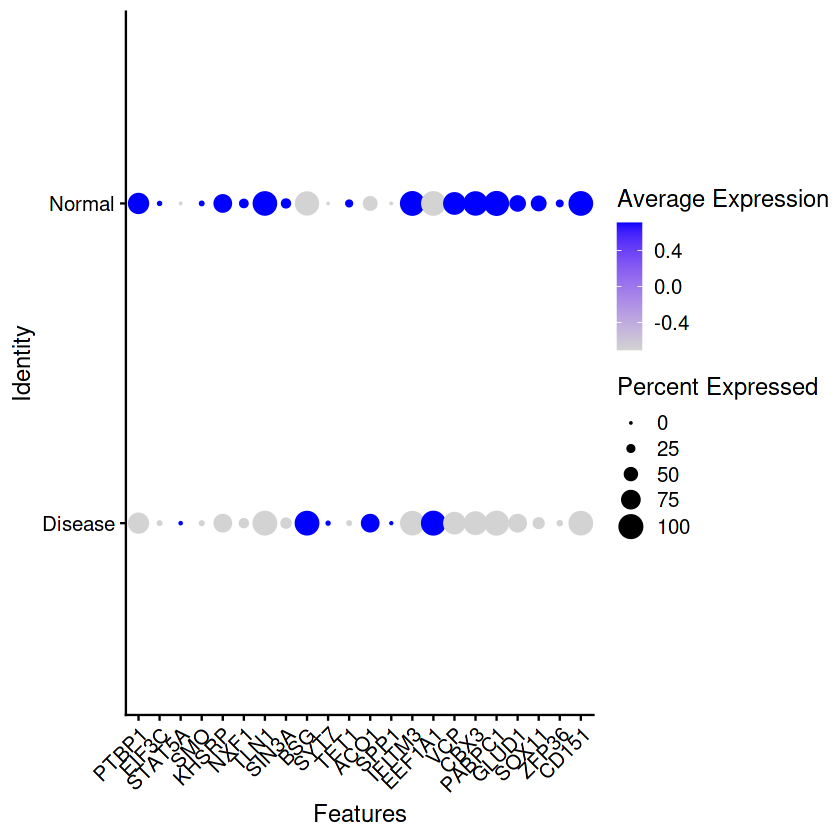

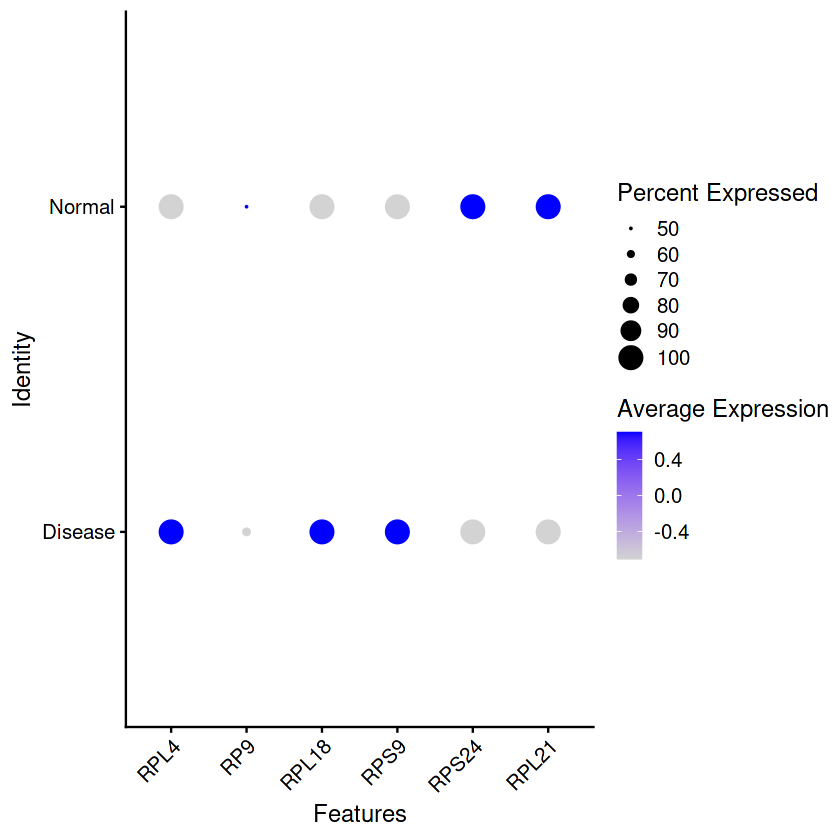

Warning message in FetchData(object = object, vars = features, cells = cells):
“The following requested variables were not found: RAS, GRK3”


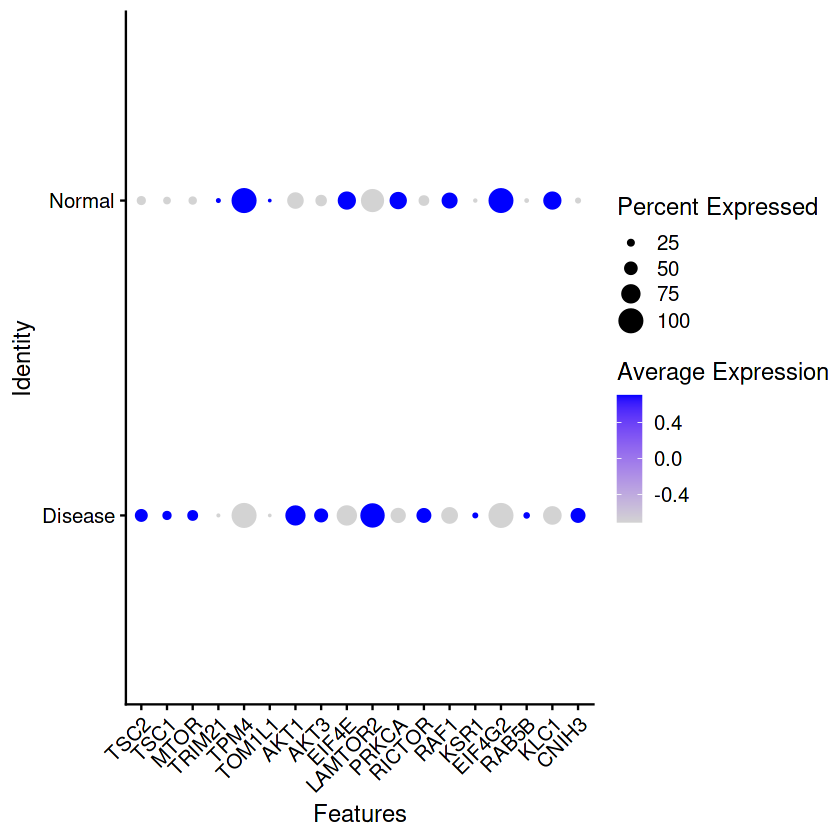

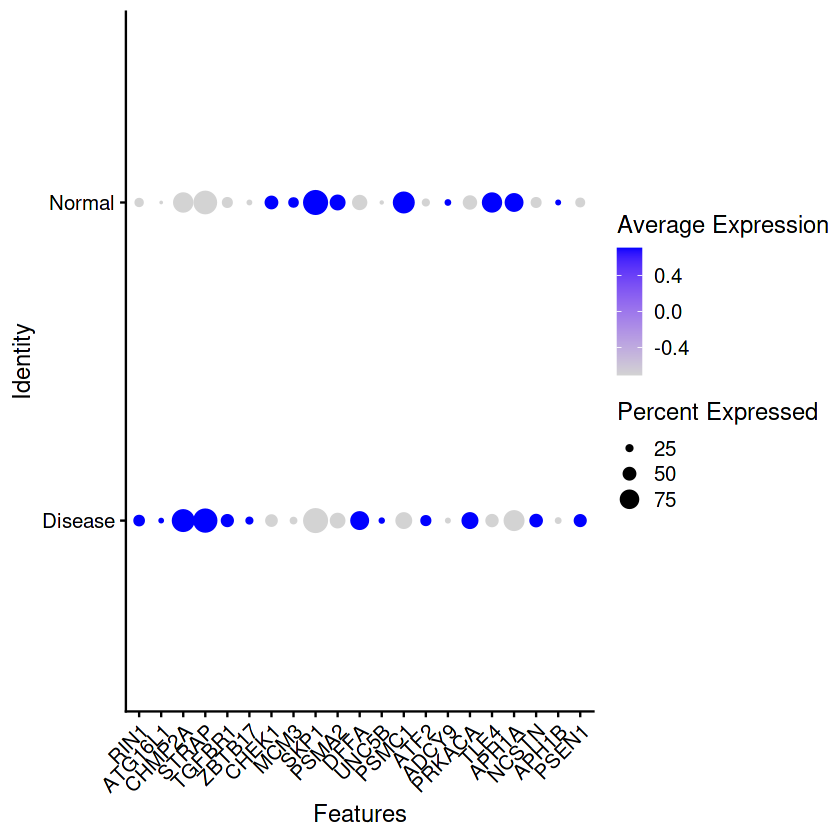

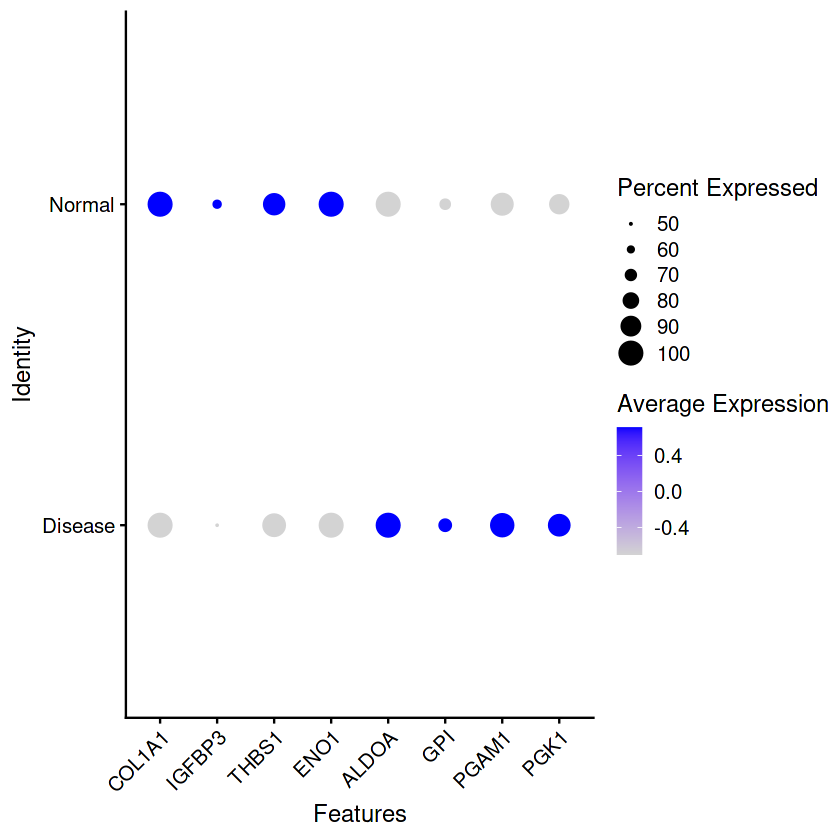

In [21]:
features <- c("PTBP1","NOTCH2NLB","EIF3C","EIF3CL","STAT5A","SMO","KHSRP","NXF1","TLN1","SIN3A","BSG","SYT7","TET1","ACO1","SPP1","IFITM3","EEF1A1","VCP","CBX3","H3C10","PABPC1","GLUD1","SOX11","ZFP36","CD151","PTPN6")
DotPlot(pbmcF, features = features) + RotatedAxis()
features <- c("RPL4","RP9","RPL18","RPS9","RPS24","RPL21")
DotPlot(pbmcF, features = features) + RotatedAxis()
features <- c("TSC2","TSC1","MTOR","TRIM21","TPM4","TOM1L1","AKT1","AKT3","EIF4E","LAMTOR2","PRKCA","RICTOR","RAF1","KSR1","EIF4G2","RAB5B","KLC1","CNIH3")
DotPlot(pbmcF, features = features) + RotatedAxis()
features <- c("RAS","RIN1","ATG16L1","CHMP2A","GRK3","STRAP","TGFBR1","ZBTB17","CHEK1","MCM3","SKP1","PSMA2","DFFA","UNC5B","PSMC1","ATF2","ADCY9","PRKACA","TLE4","APH1A","NCSTN","APH1B","PSEN1")
DotPlot(pbmcF, features = features) + RotatedAxis()
features <- c("COL1A1","IGFBP3","THBS1","ENO1","ALDOA","GPI","PGAM1","PGK1")
DotPlot(pbmcF, features = features) + RotatedAxis()

Warning message in FetchData(object = object, vars = features, cells = cells):
“The following requested variables were not found: ATP5PF, ATP5F1B”


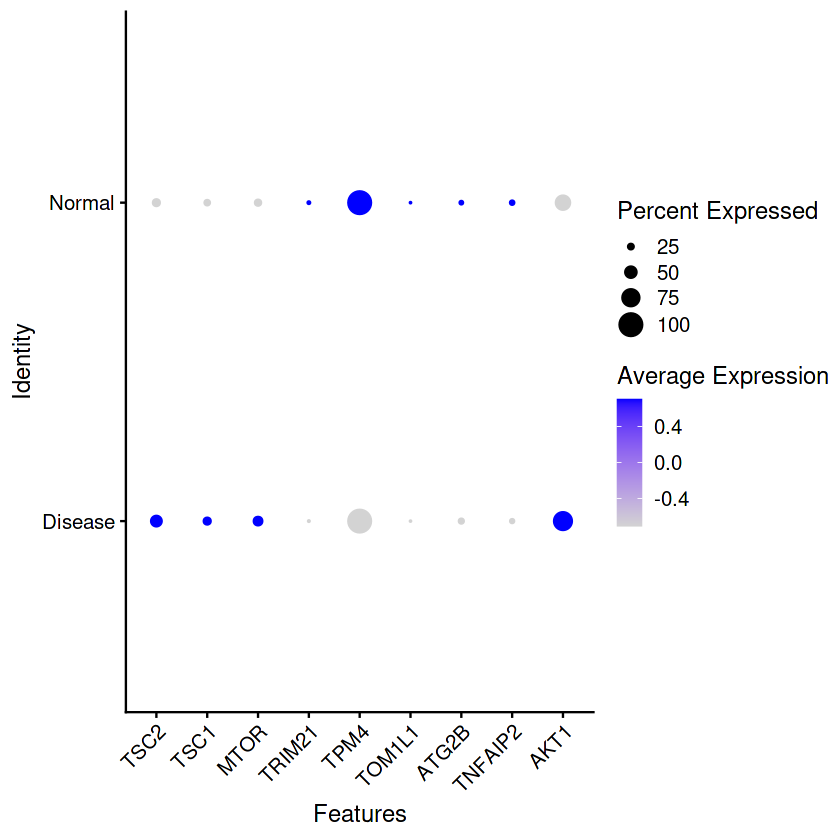

Warning message in FetchData(object = object, vars = features, cells = cells):
“The following requested variables were not found: ATP5PF, ATP5F1B”


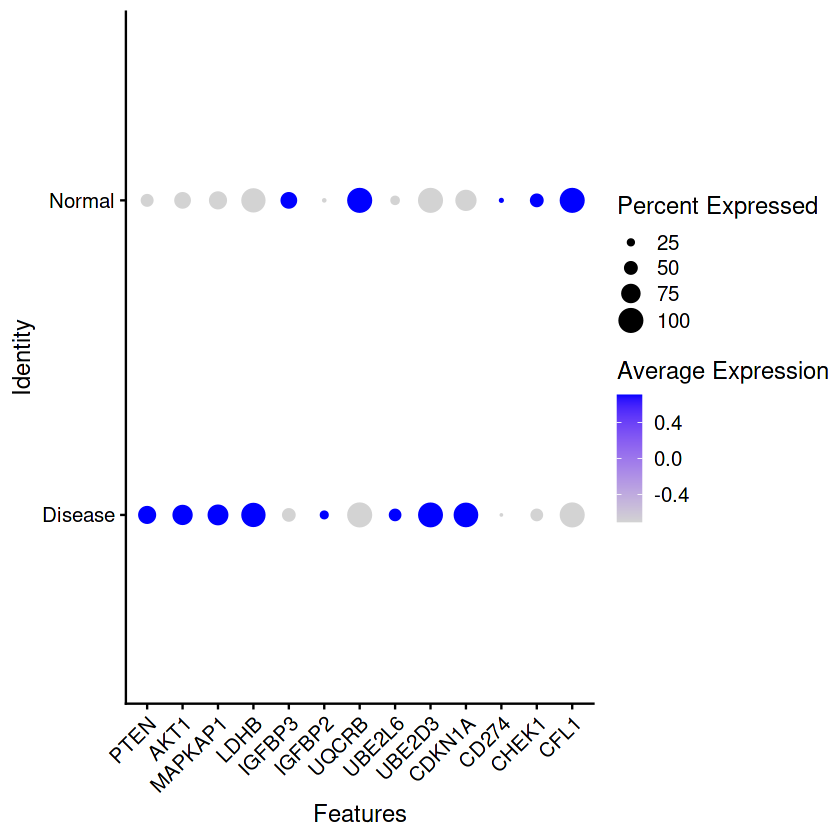

Warning message in FetchData(object = object, vars = features, cells = cells):
“The following requested variables were not found: NDUFB8, NDUFA7”


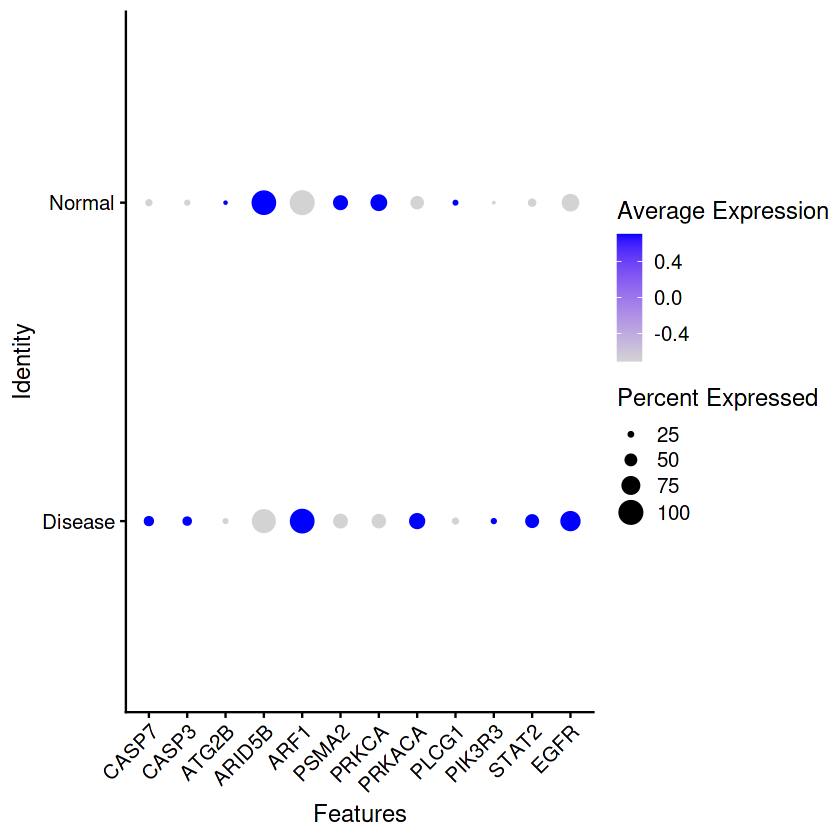

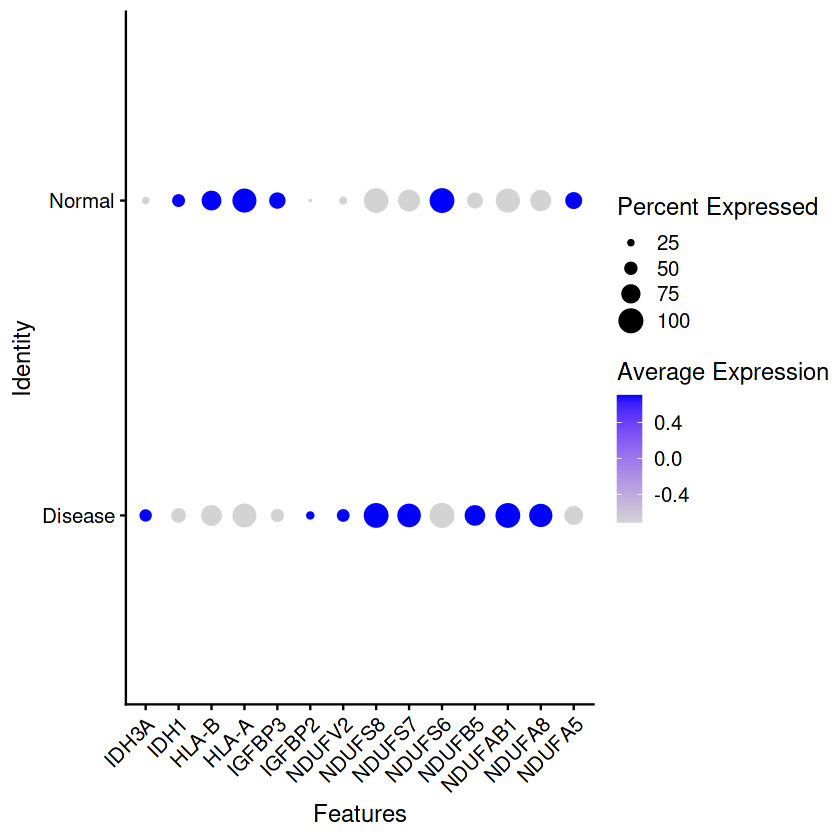

In [48]:
features <- c("TSC2","TSC1","MTOR","TRIM21","TPM4","TOM1L1","ATP5PF","ATP5F1B","ATG2B","TNFAIP2","AKT1")
DotPlot(pbmcF, features = features) + RotatedAxis()
features <- c("PTEN","AKT1","MAPKAP1","LDHB","IGFBP3","IGFBP2","UQCRB","UBE2L6","UBE2D3","CDKN1A","CD274","CHEK1","CFL1")
DotPlot(pbmcF, features = features) + RotatedAxis()
features <- c("CASP7","CASP3","ATP5PF","ATP5F1B","ATG2B","ARID5B","ARF1","PSMA2","PRKCA","PRKACA","PLCG1","PIK3R3","STAT2","EGFR")
DotPlot(pbmcF, features = features) + RotatedAxis()
features <- c("IDH3A","IDH1","HLA-B","HLA-A","IGFBP3","IGFBP2","NDUFV2","NDUFS8","NDUFS7","NDUFS6","NDUFB8","NDUFB5","NDUFAB1","NDUFA8","NDUFA7","NDUFA5")
DotPlot(pbmcF, features = features) + RotatedAxis()


PC_ 1 
Positive:  STMN1, HMGN2, CENPF, TOP2A, BIRC5, DEK, HMGB2, CENPW, HIST1H4C, MKI67 
	   HMGB1, PBK, KIAA0101, CDKN3, PRC1, TUBA1B, PTTG1, TPX2, RPS29, TUBA1C 
	   DYNC1I2, CKS1B, H2AFZ, NUSAP1, ANLN, SMC4, GTSE1, CKAP2, CEP55, UBE2C 
Negative:  IGFBP5, IL1B, WLS, IL8, C9orf16, CD82, AREG, SLC16A6, RPL13A, TFPI2 
	   TIMP1, IER3, GPX1, PLAT, FTL, GAL, GNG11, EREG, PLAU, RPS5 
	   ATP6V1G1, WIPI1, ATP6V1F, RP3-412A9.11, WNT5A, PHLDA1, RPL3, MXD4, RPL7A, RPL11 
PC_ 2 
Positive:  COL1A2, NUPR1, COL1A1, DCN, BDNF, CALD1, ACTA2, GABARAPL1, LOX, SPARC 
	   PALLD, FSTL1, TAGLN, COL4A1, EEF1A1, MYLK, GREM1, RPS4X, COL3A1, CTGF 
	   AMIGO2, LMOD1, MYOCD, MFGE8, CTD-2319I12.1, LBH, NREP, PSAT1, SLC38A1, COL8A1 
Negative:  UBE2S, HMGA1, PLAU, STC1, UBE2E3, H2AFZ, BCL2L12, CKS1B, H2AFX, SLC20A1 
	   CKS2, SRM, SMC4, TPX2, HMGA2, LYAR, DTYMK, ODC1, AURKA, MKI67 
	   ANP32E, ARHGAP22, MCL1, PHF19, SPRY2, MRPL12, CENPF, RRM2, TMEM158, TMPO 
PC_ 3 
Positive:  SMURF2, AC068491.1, CD44, CCND1, SERPI

PC_ 1 
Positive:  STMN1, HMGN2, CENPF, TOP2A, BIRC5 
Negative:  IGFBP5, IL1B, WLS, IL8, C9orf16 
PC_ 2 
Positive:  COL1A2, NUPR1, COL1A1, DCN, BDNF 
Negative:  UBE2S, HMGA1, PLAU, STC1, UBE2E3 
PC_ 3 
Positive:  SMURF2, AC068491.1, CD44, CCND1, SERPINE1 
Negative:  RPL7, RPL3, RPS3, RPL7A, RPL10A 
PC_ 4 
Positive:  MYL6, CALD1, TPM1, CALM2, CAV2 
Negative:  RPS27, RPS29, SFRP1, FN1, SERPINE1 
PC_ 5 
Positive:  COL1A1, COL4A1, PXDN, COL3A1, TGFBI 
Negative:  S100A6, GADD45B, ATF3, PRDX1, RRAD 


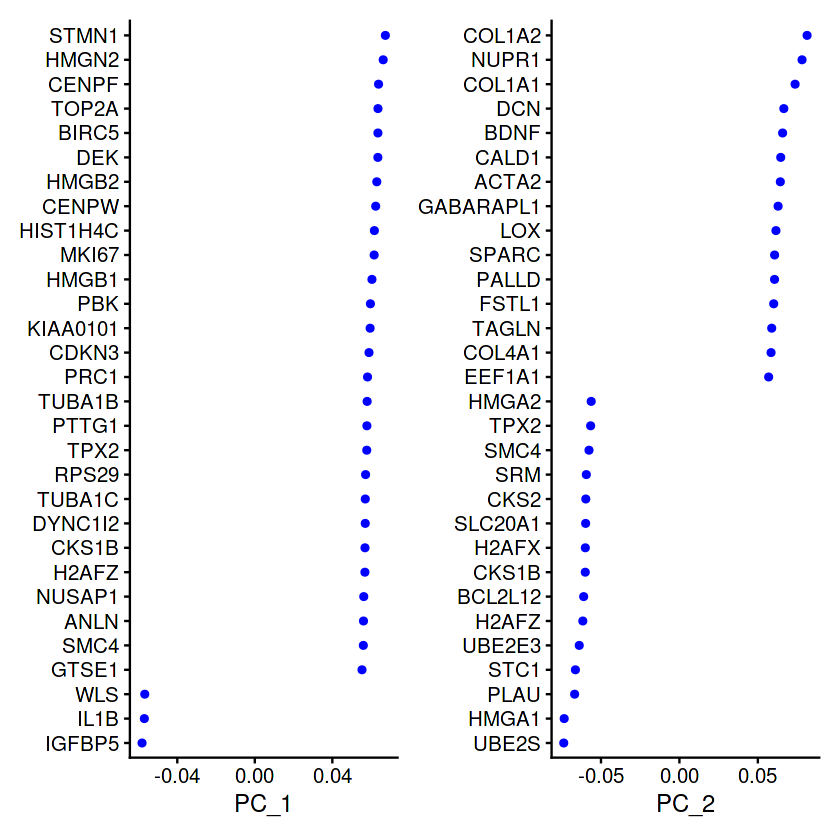

Warning message:
“Requested number is larger than the number of available items (480). Setting to 480.”


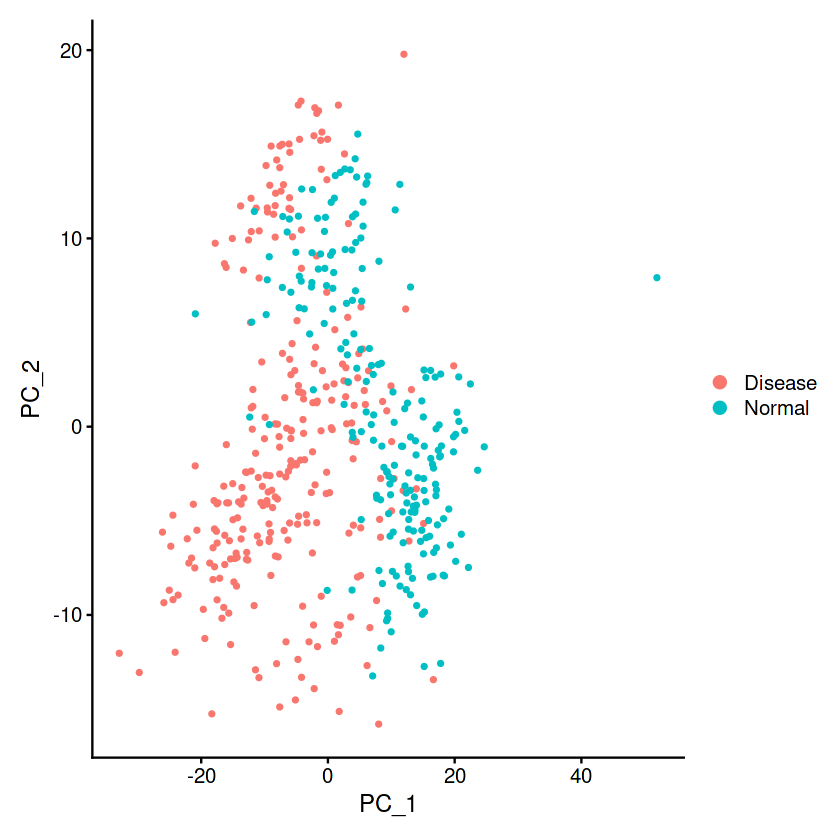

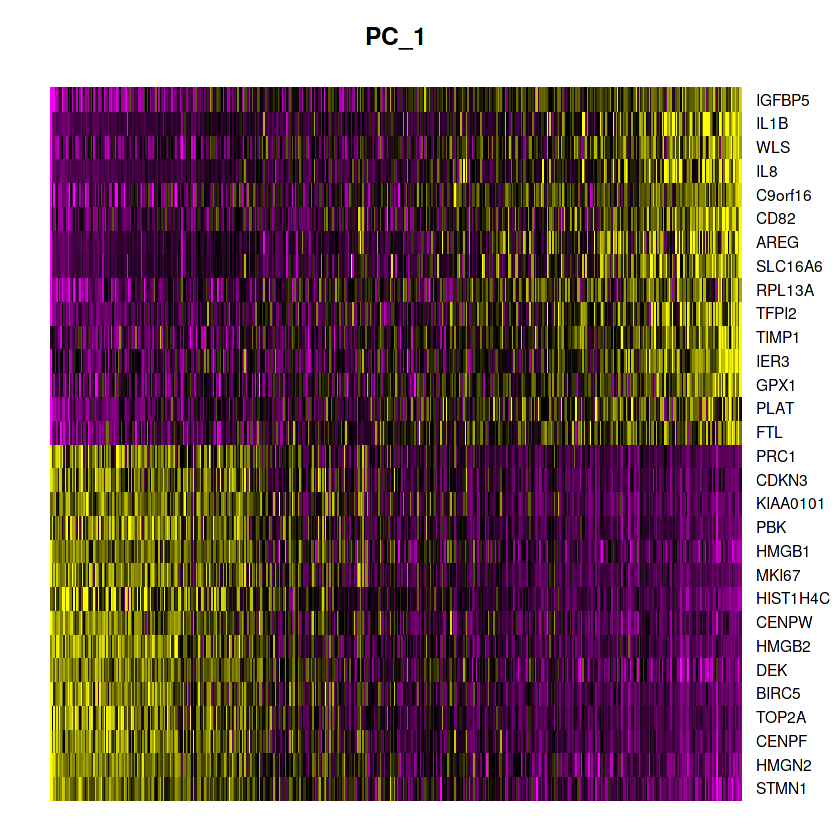

In [22]:
pbmcF <- RunPCA(object = pbmcF, features = VariableFeatures(object = pbmcF))
print(x = pbmcF[['pca']], dims = 1:5, nfeatures = 5)
VizDimLoadings(object = pbmcF, dims = 1:2, reduction = 'pca')
DimPlot(object = pbmcF, reduction = 'pca')
DimHeatmap(object = pbmcF, dims = 1, cells = 500, balanced = TRUE)

In [25]:
marrow <- CellCycleScoring(pbmcF, s.features = s.genes, g2m.features = g2m.genes, set.ident = TRUE)

In [26]:
head(marrow[[]])

,orig.ident,nCount_RNA,nFeature_RNA,percent.mt,S.Score,G2M.Score,Phase,old.ident
,<fct>,<dbl>,<int>,<dbl>,<dbl>,<dbl>,<chr>,<fct>
Disease_AAACGGGCAACCGCCA.1,Disease,55027,7463,7.354571,-0.11758950,-0.3436026,G1,Disease
Disease_AAACGGGGTGCCTGCA.1,Disease,27556,5400,6.619248,-0.12438503,-0.2895493,G1,Disease
Disease_AAAGCAATCCTAGAAC.1,Disease,44117,6924,8.706394,0.08687924,0.2062981,G2M,Disease
Disease_AAAGCAATCGCCTGTT.1,Disease,32899,5588,5.702301,-0.09881008,-0.2968586,G1,Disease
Disease_AAAGTAGTCTCTTATG.1,Disease,29147,5147,7.290630,-0.12114629,-0.2308138,G1,Disease
Disease_AACCGCGAGCACGCCT.1,Disease,26240,5322,8.258384,-0.09879466,-0.2711648,G1,Disease


Picking joint bandwidth of 0.0479

Picking joint bandwidth of 0.019

Picking joint bandwidth of 0.0444

Picking joint bandwidth of 0.115

Picking joint bandwidth of 0.0812

Picking joint bandwidth of 0.121

Picking joint bandwidth of 0.133

Picking joint bandwidth of 0.108

Picking joint bandwidth of 0.0816

Picking joint bandwidth of 0.102

Picking joint bandwidth of 3.81e-06



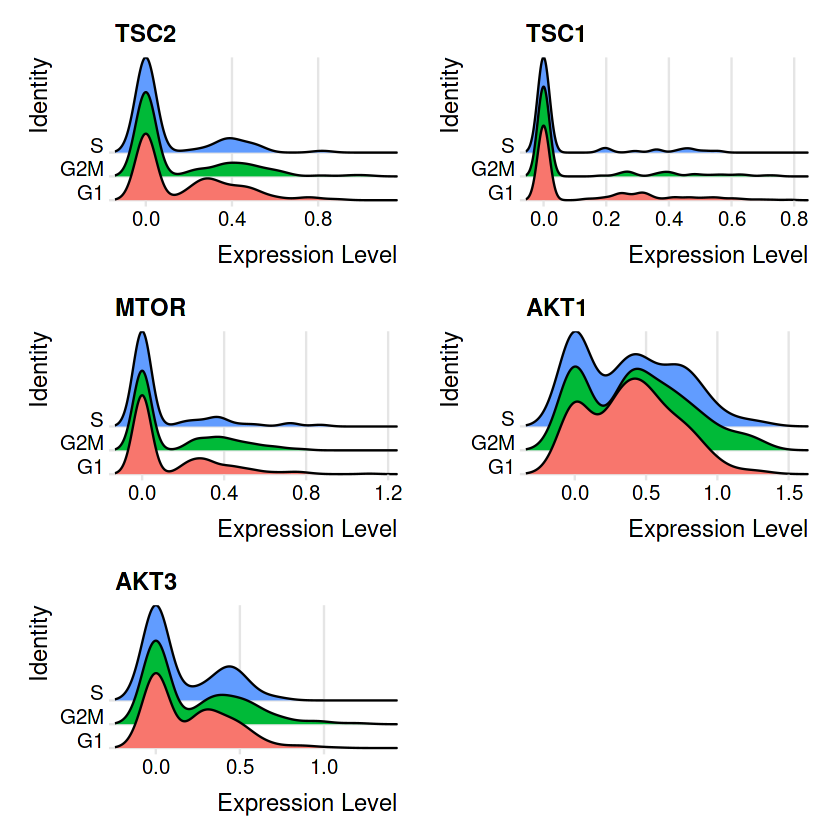

Warning message in FetchData(object = object, vars = features, slot = slot):
“The following requested variables were not found: RAS”
Picking joint bandwidth of 0.118

Picking joint bandwidth of 3.96e-06

Picking joint bandwidth of 0.114

Picking joint bandwidth of 0.0554

Picking joint bandwidth of 0.0701

Picking joint bandwidth of 3.53e-06



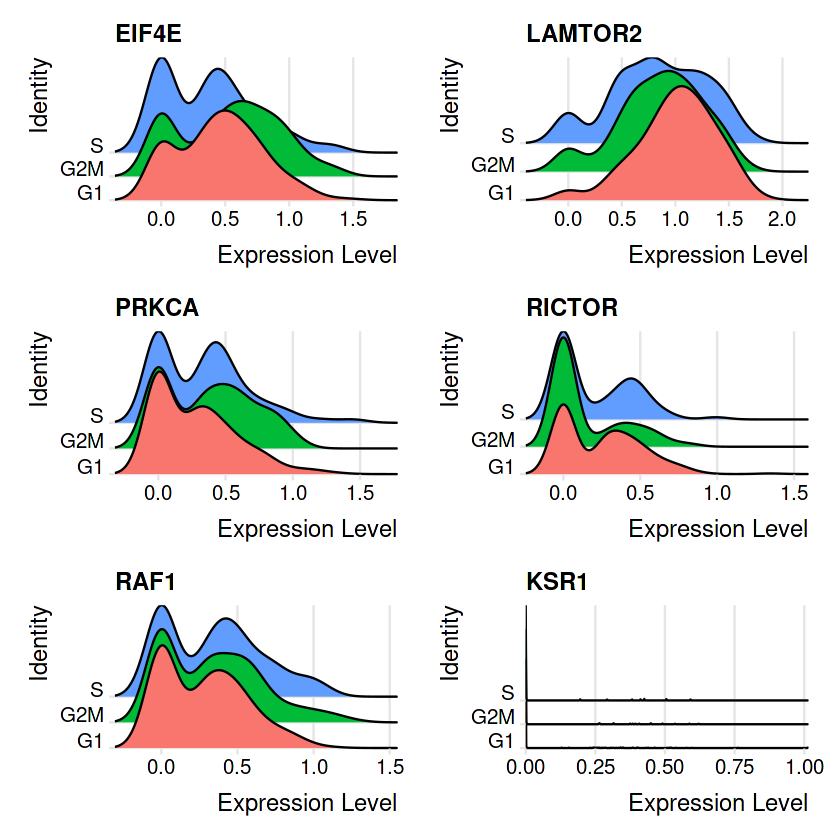

Warning message in FetchData(object = object, vars = features, slot = slot):
“The following requested variables were not found: GRK3”
Picking joint bandwidth of 0.129

Picking joint bandwidth of 0.117

Picking joint bandwidth of 0.0854



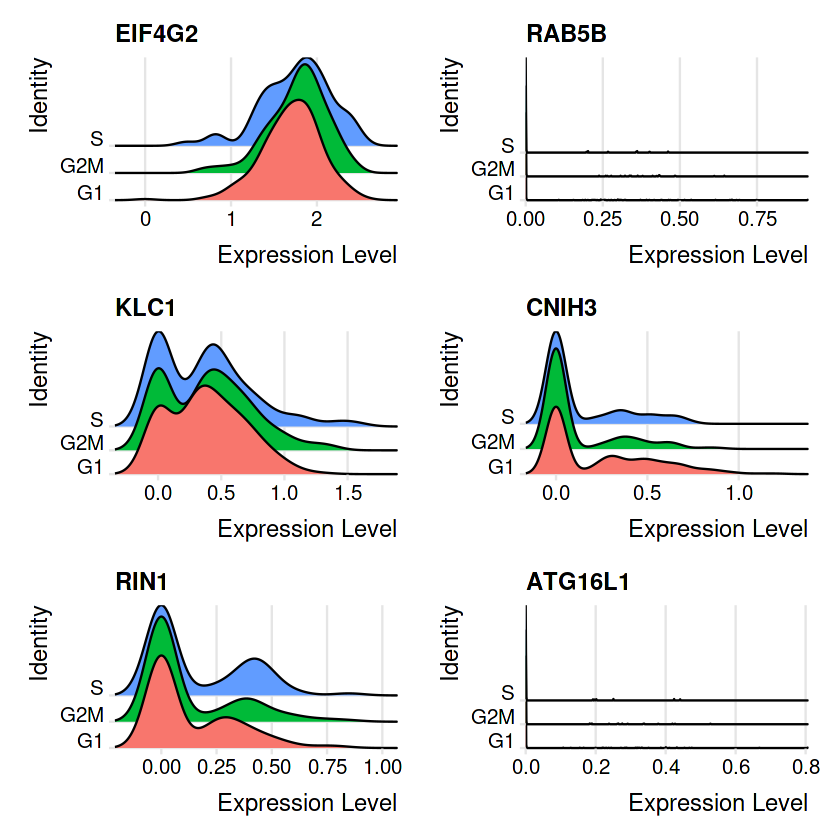

Warning message in FetchData(object = object, vars = features, slot = slot):
“The following requested variables were not found: RAS, GRK3”
Picking joint bandwidth of 0.0701

Picking joint bandwidth of 3.53e-06

Picking joint bandwidth of 0.129

Picking joint bandwidth of 0.117



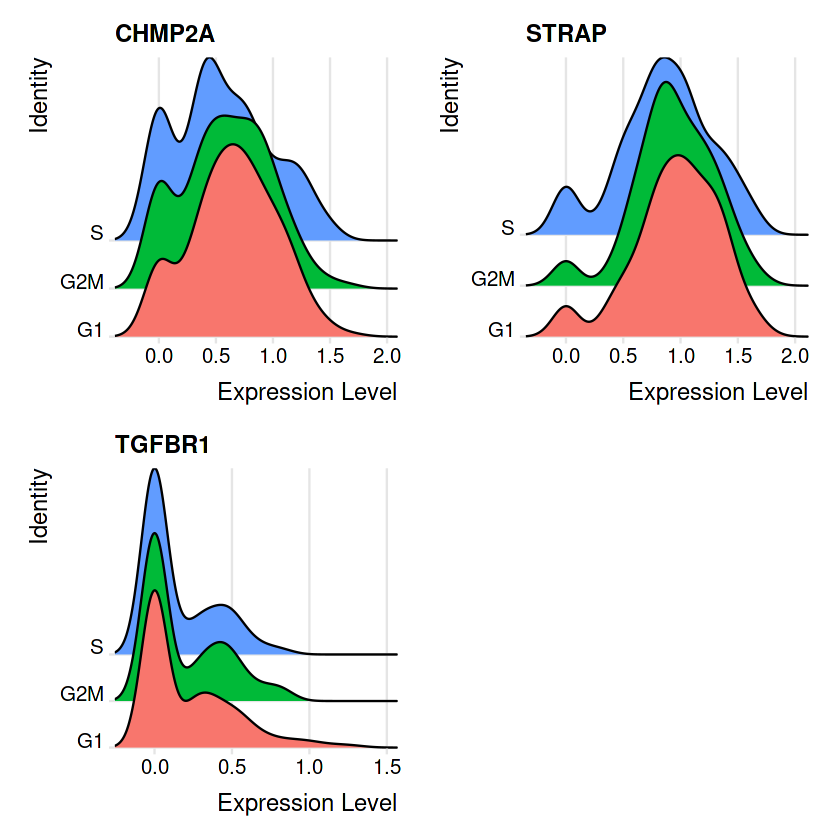

Picking joint bandwidth of 0.0854

Picking joint bandwidth of 4.64e-06

Picking joint bandwidth of 0.0939

Picking joint bandwidth of 0.0749

Picking joint bandwidth of 0.12

Picking joint bandwidth of 0.108



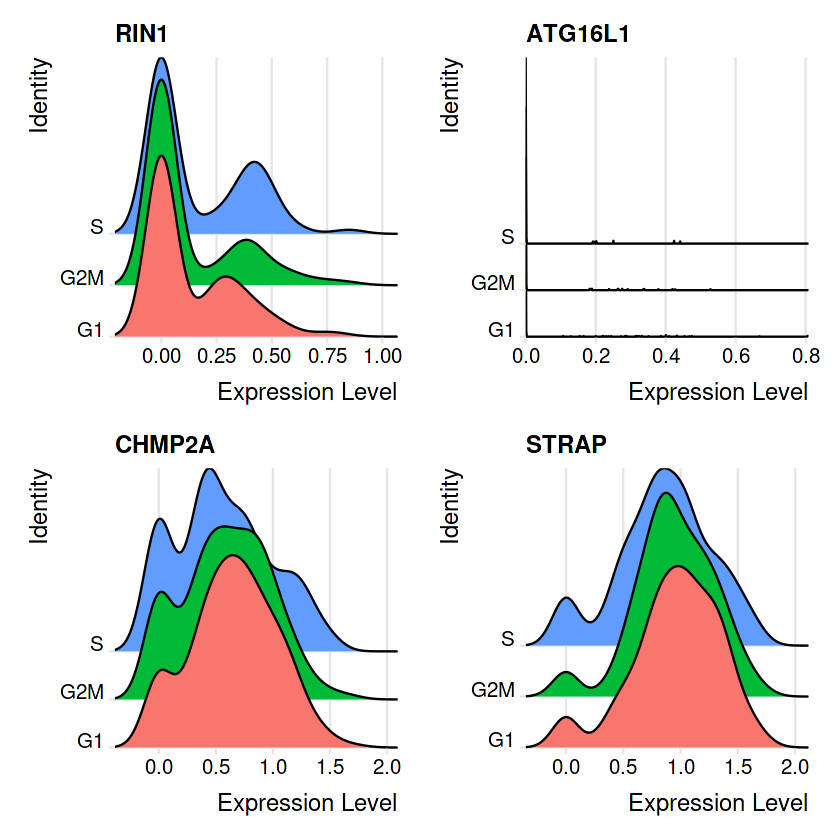

Picking joint bandwidth of 0.114

Picking joint bandwidth of 3.76e-06

Picking joint bandwidth of 0.139

Picking joint bandwidth of 0.0463

Picking joint bandwidth of 4.1e-06

Picking joint bandwidth of 0.101



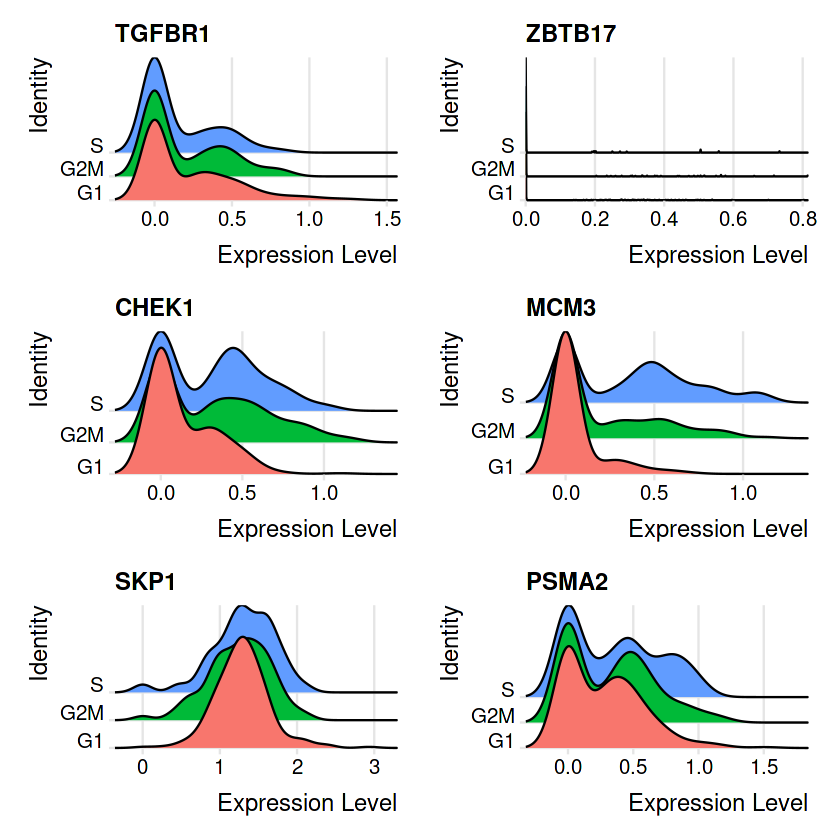

Picking joint bandwidth of 0.142

Picking joint bandwidth of 0.119

Picking joint bandwidth of 0.0847

Picking joint bandwidth of 4.23e-06

Picking joint bandwidth of 0.075



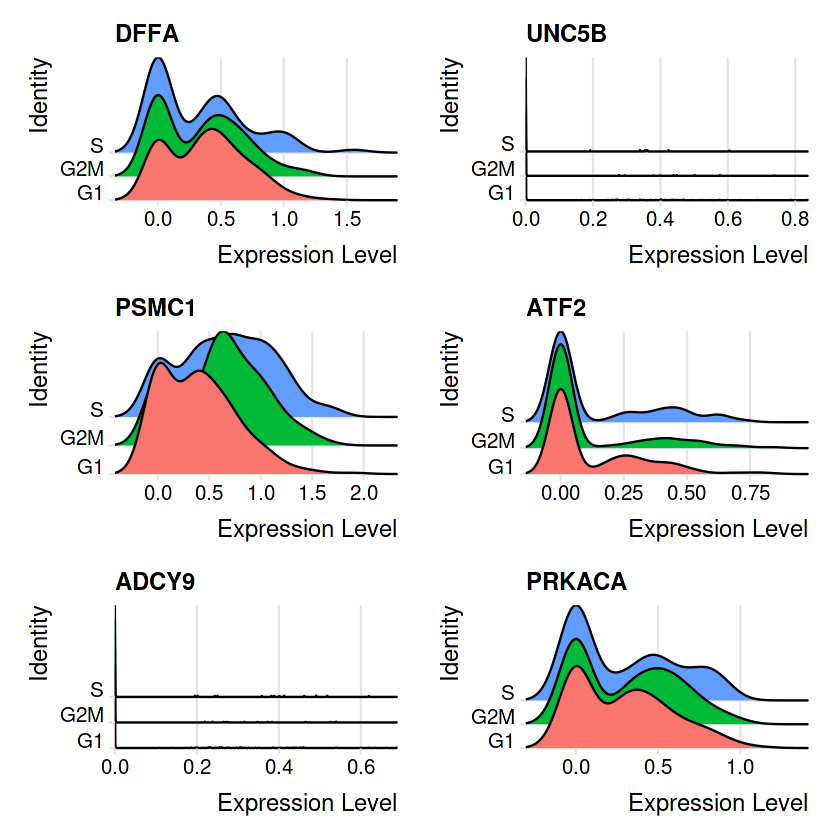

Picking joint bandwidth of 0.177

Picking joint bandwidth of 0.153

Picking joint bandwidth of 0.192

Picking joint bandwidth of 0.135

Picking joint bandwidth of 0.111

Picking joint bandwidth of 0.102

Picking joint bandwidth of 0.137

Picking joint bandwidth of 0.136



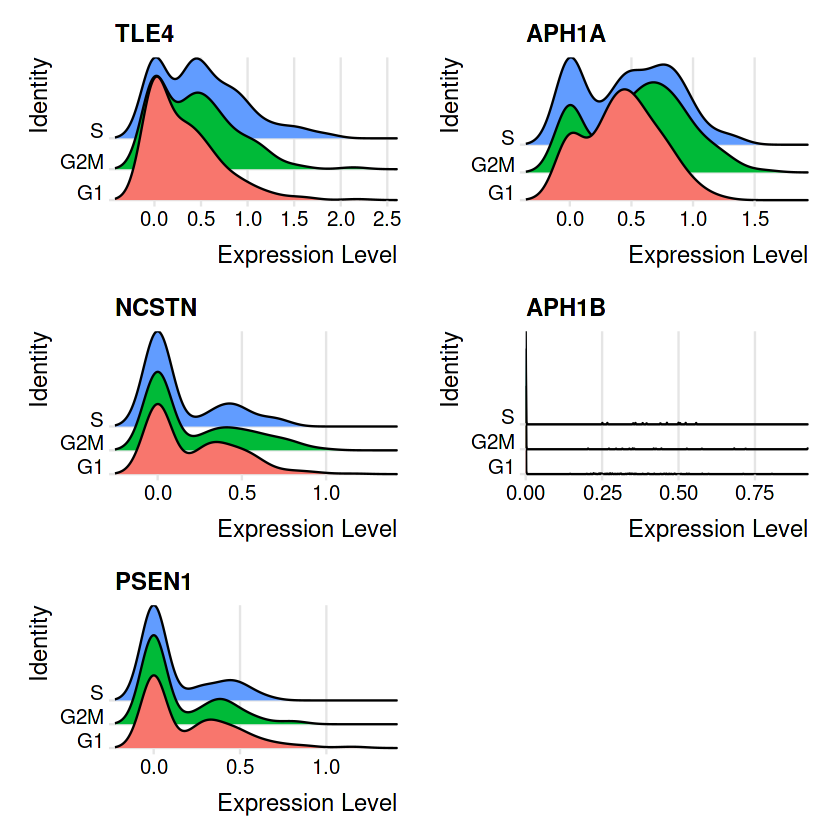

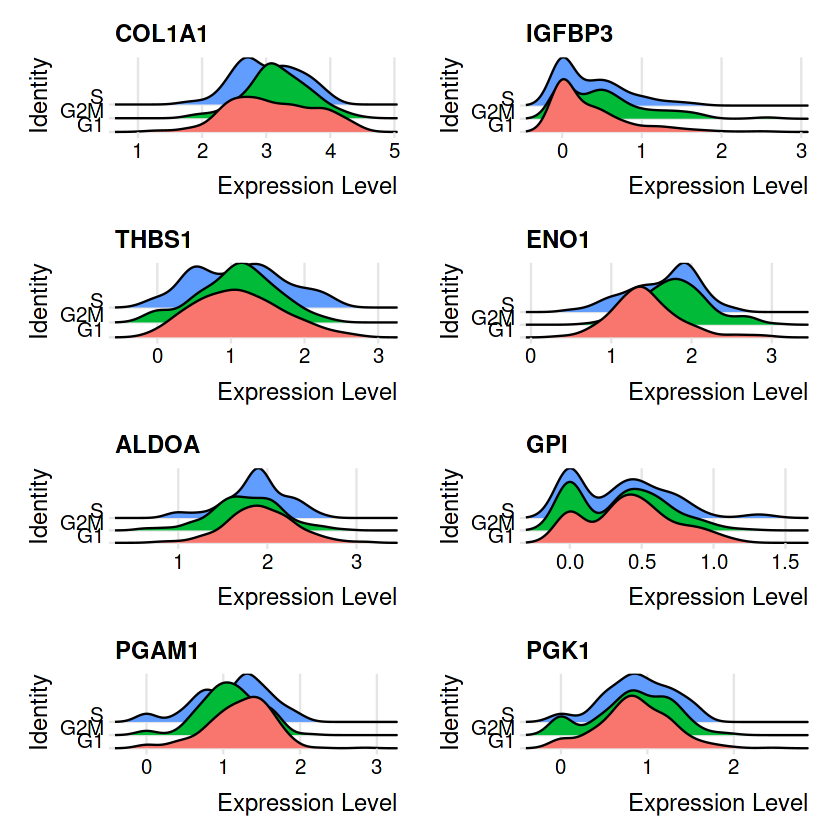

In [28]:
RidgePlot(marrow, features = c("TSC2", "TSC1", "MTOR", "AKT1","AKT3"), ncol = 2)
RidgePlot(marrow, features = c("EIF4E","LAMTOR2","PRKCA","RICTOR","RAF1","KSR1"), ncol = 2)
RidgePlot(marrow, features = c("EIF4G2","RAB5B","KLC1","CNIH3","RAS","RIN1","ATG16L1"), ncol = 2)
RidgePlot(marrow, features = c("CHMP2A","GRK3","STRAP","TGFBR1"), ncol = 2)

RidgePlot(marrow, features = c("RAS","RIN1","ATG16L1","CHMP2A","GRK3","STRAP"), ncol = 2)
RidgePlot(marrow, features = c("TGFBR1","ZBTB17","CHEK1","MCM3","SKP1","PSMA2"), ncol = 2)
RidgePlot(marrow, features = c("DFFA","UNC5B","PSMC1","ATF2","ADCY9","PRKACA"), ncol = 2)
RidgePlot(marrow, features = c("TLE4","APH1A","NCSTN","APH1B","PSEN1"), ncol = 2)
RidgePlot(marrow, features = c("COL1A1","IGFBP3","THBS1","ENO1","ALDOA","GPI","PGAM1","PGK1"), ncol = 2)


Picking joint bandwidth of 0.0982

Picking joint bandwidth of 0.135

Picking joint bandwidth of 0.0712

Picking joint bandwidth of 0.0467



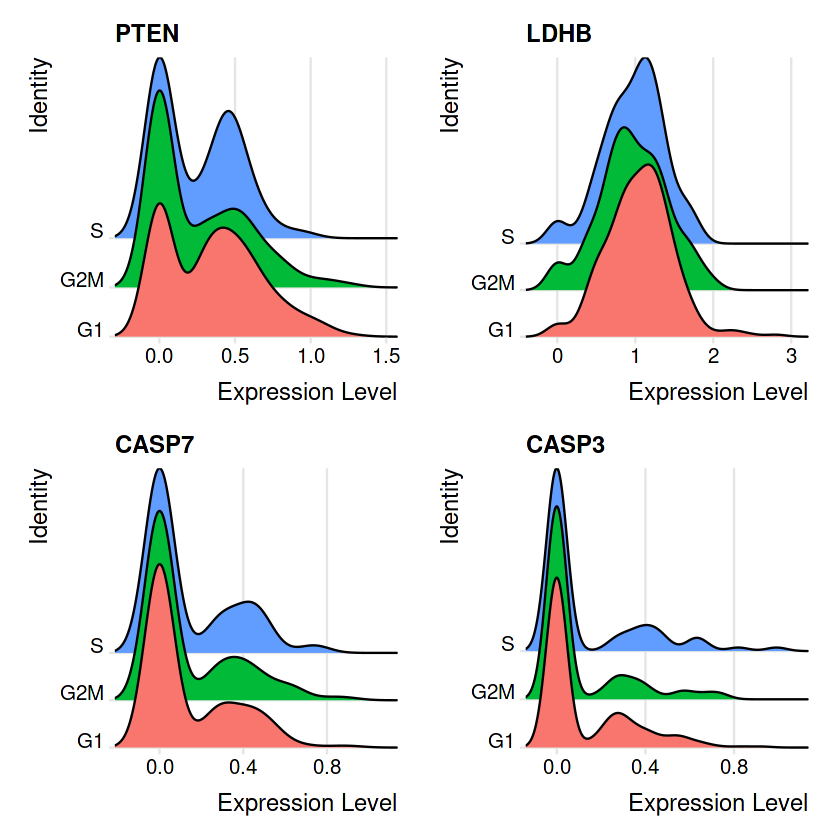

In [104]:
RidgePlot(marrow, features = c("PTEN", "LDHB", "CASP7", "CASP3"), ncol = 2)

Picking joint bandwidth of 0.0479

Picking joint bandwidth of 0.019

Picking joint bandwidth of 0.0444

Picking joint bandwidth of 0.128

Picking joint bandwidth of 0.114

Picking joint bandwidth of 0.075



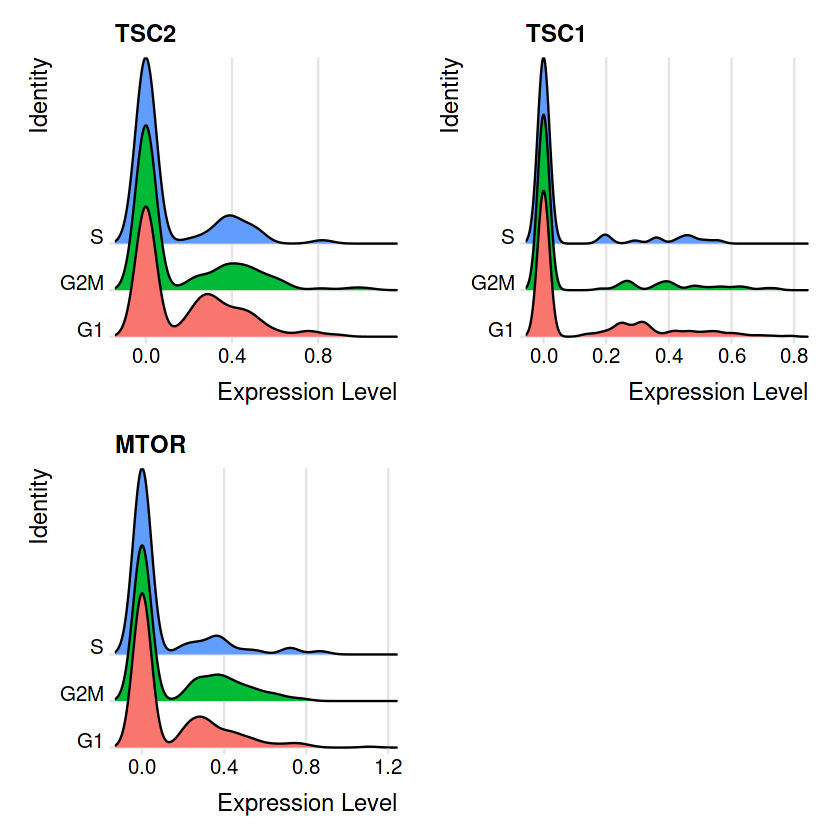

Picking joint bandwidth of 0.111

Picking joint bandwidth of 0.135

Picking joint bandwidth of 0.239

Picking joint bandwidth of 0.108



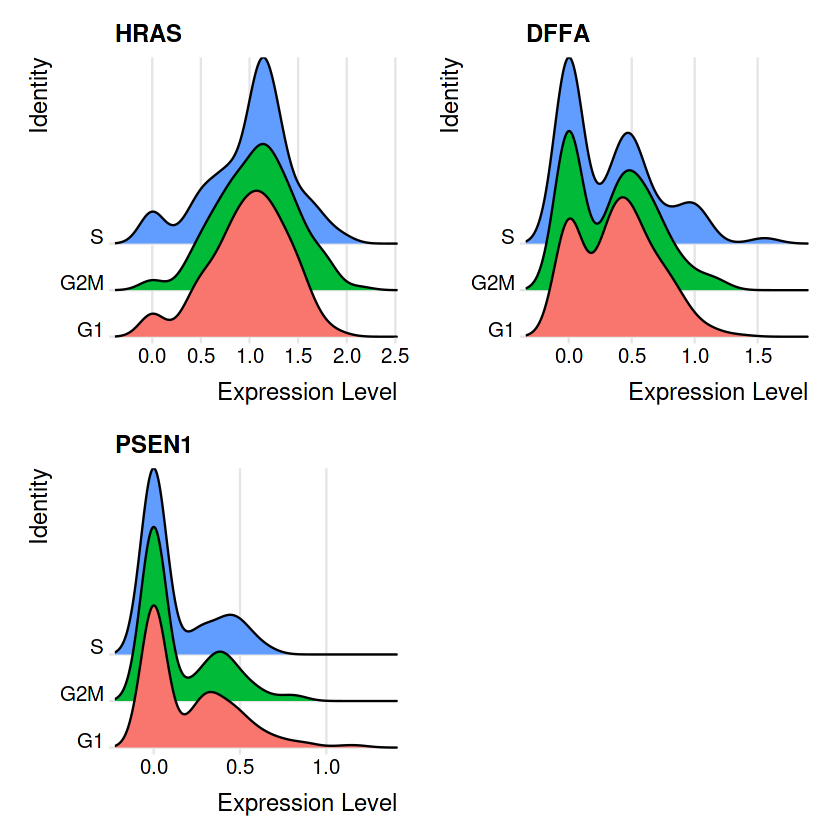

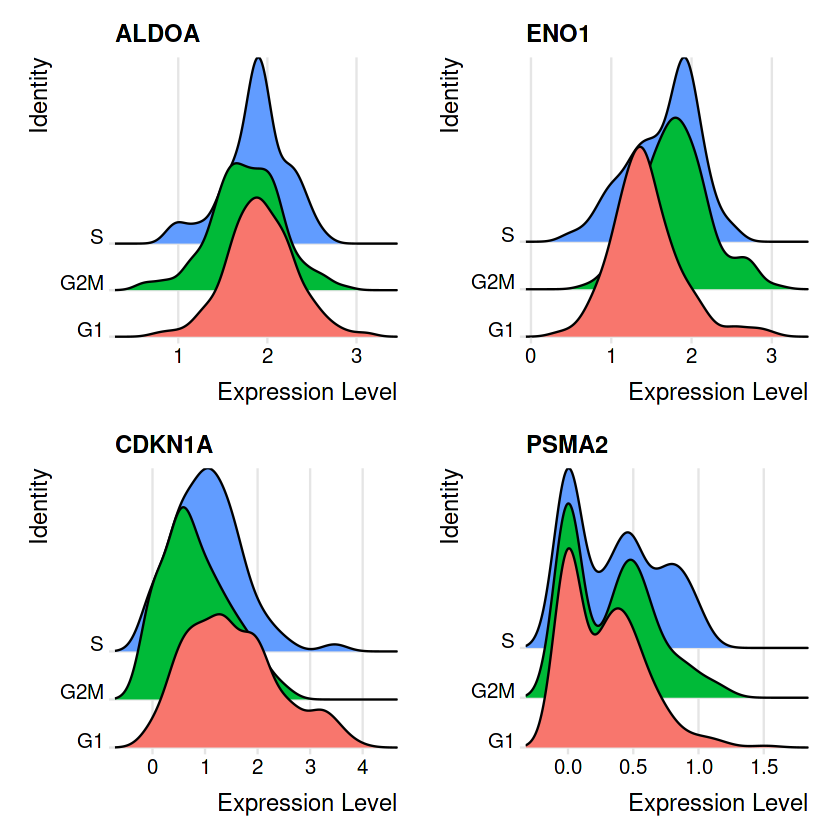

In [40]:
RidgePlot(marrow, features = c("TSC2", "TSC1", "MTOR"), ncol = 2)
RidgePlot(marrow, features = c("HRAS","DFFA","PSEN1"), ncol = 2)
RidgePlot(marrow, features = c("ALDOA","ENO1","CDKN1A", "PSMA2"), ncol = 2)

Warning message:
“Requested number is larger than the number of available items (480). Setting to 480.”
Warning message:
“Requested number is larger than the number of available items (480). Setting to 480.”
Warning message:
“Requested number is larger than the number of available items (480). Setting to 480.”
Warning message:
“Requested number is larger than the number of available items (480). Setting to 480.”
Warning message:
“Requested number is larger than the number of available items (480). Setting to 480.”
Warning message:
“Requested number is larger than the number of available items (480). Setting to 480.”
Warning message:
“Requested number is larger than the number of available items (480). Setting to 480.”
Warning message:
“Requested number is larger than the number of available items (480). Setting to 480.”
Warning message:
“Requested number is larger than the number of available items (480). Setting to 480.”
Warning message:
“Requested number is larger than the number of 

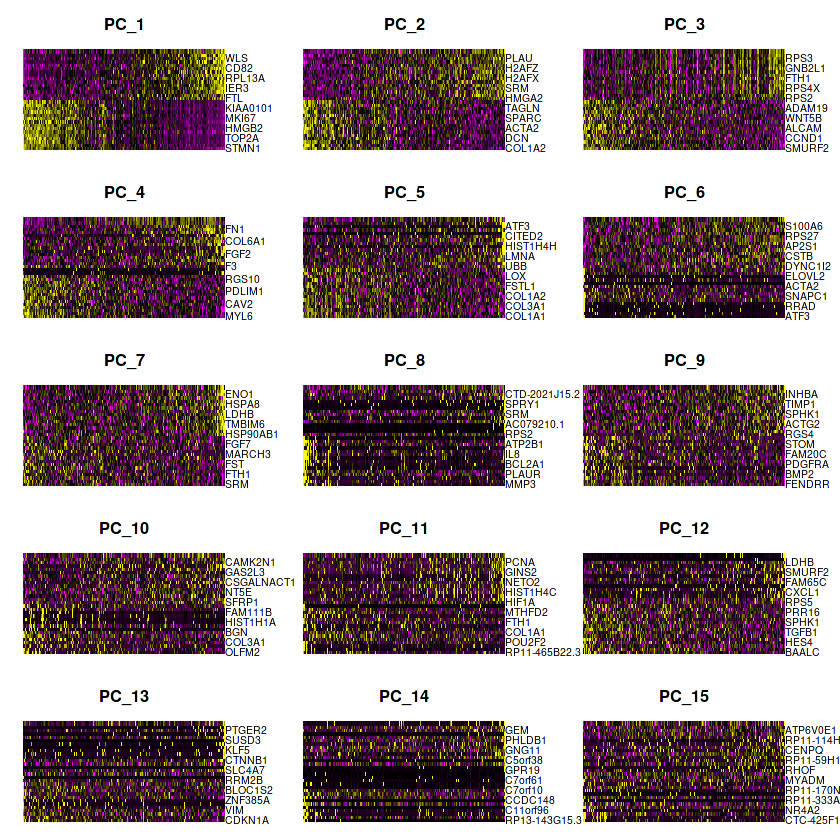

In [29]:
DimHeatmap(object = pbmcF, dims = 1:15, cells = 500, balanced = TRUE)

In [30]:
pbmcF <- FindNeighbors(object = pbmcF, dims = 1:10)
pbmcF <- FindClusters(object = pbmcF, resolution = 0.5)
head(x = Idents(object = pbmcF), 5)

Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 480
Number of edges: 15903

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.7872
Number of communities: 5
Elapsed time: 0 seconds


Disease_AAACGGGCAACCGCCA.1 Disease_AAACGGGGTGCCTGCA.1 
                         0                          0 
Disease_AAAGCAATCCTAGAAC.1 Disease_AAAGCAATCGCCTGTT.1 
                         1                          0 
Disease_AAAGTAGTCTCTTATG.1 
                         0 
Levels: 0 1 2 3 4

In [31]:
pbmcF <- RunUMAP(object = pbmcF, dims = 1:10)

Warning message:
“The default method for RunUMAP has changed from calling Python UMAP via reticulate to the R-native UWOT using the cosine metric
To use Python UMAP via reticulate, set umap.method to 'umap-learn' and metric to 'correlation'
This message will be shown once per session”
08:41:49 UMAP embedding parameters a = 0.9922 b = 1.112

08:41:49 Read 480 rows and found 10 numeric columns

08:41:49 Using Annoy for neighbor search, n_neighbors = 30

08:41:49 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

08:41:49 Writing NN index file to temp file /tmp/RtmpIXzKSZ/file1b5e14240773

08:41:49 Searching Annoy index using 1 thread, search_k = 3000

08:41:49 Annoy recall = 100%

08:41:50 Commencing smooth kNN distance calibration using 1 thread

08:41:51 Initializing from

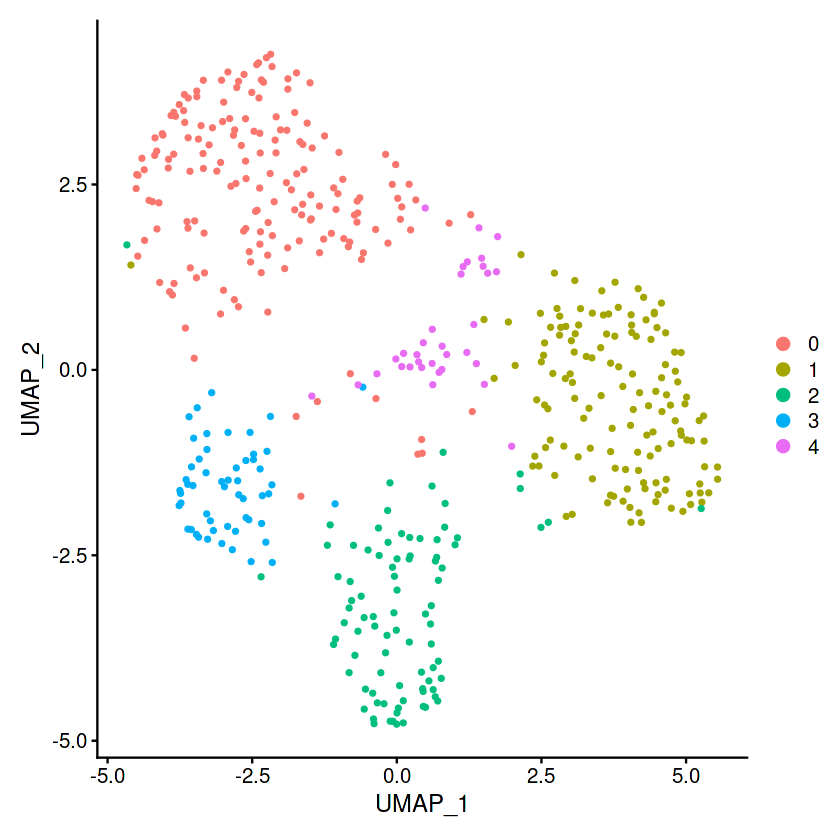

In [32]:
DimPlot(object = pbmcF, reduction = 'umap')

In [33]:
pbmc.markers <- FindAllMarkers(object = pbmcF, only.pos = TRUE, min.pct = 0.25,logfc.threshold = 0.17)
pbmc.markers %>% group_by(cluster) %>% top_n(n = 2, wt = avg_log2FC)
#write.csv(pbmc.markers, file = "/media/orsalia/Orsalia_SSD_512GB/mm10ribo/PNAS/RNAsingle/normandanddiseaseclusterallRISGrowing.csv")

Calculating cluster 0

Calculating cluster 1

Calculating cluster 2

Calculating cluster 3

Calculating cluster 4



p_val,avg_log2FC,pct.1,pct.2,p_val_adj,cluster,gene
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>
9.833858e-55,2.304532,0.953,0.277,1.661332e-50,0,IL1B
3.000124e-46,2.615065,0.976,0.358,5.068409e-42,0,IL8
9.555391e-53,2.049937,0.971,0.419,1.614288e-48,1,TOP2A
9.070771e-42,3.255016,0.971,0.759,1.532416e-37,1,HIST1H4C
4.638250e-28,1.079304,1.000,1.000,7.835859e-24,2,RPS27
1.744130e-21,1.076850,1.000,1.000,2.946533e-17,2,RPS29
1.221840e-20,1.860388,1.000,0.876,2.064176e-16,3,ACTA2
9.011578e-13,1.961018,0.722,0.371,1.522416e-08,3,RGCC
2.101060e-14,1.282130,1.000,0.993,3.549531e-10,4,UBE2S


In [25]:
head(pbmcF@meta.data)
write.csv(pbmcF@meta.data, "/media/orsalia/SP PHD U3/ERC/lung/object_clusterslung.csv")

,orig.ident,nCount_RNA,nFeature_RNA,percent.mt,RNA_snn_res.0.5,seurat_clusters
,<fct>,<dbl>,<int>,<dbl>,<fct>,<fct>
Disease_PTC10.0616A,Disease,265000,2706,0,2,2
Disease_PTC1.0616A,Disease,440034,3117,0,1,1
Disease_PTC11.0616A,Disease,263777,3259,0,0,0
Disease_PTC12.0616A,Disease,522133,3591,0,0,0
Disease_PTC13.0616A,Disease,371419,2944,0,0,0
Disease_PTC14.0616A,Disease,680640,3498,0,1,1


Warning message in DoHeatmap(object = pbmcF, features = top10$gene):
“The following features were omitted as they were not found in the scale.data slot for the RNA assay: MT-ND3, ATP5I, RPL38, RPL39, RPL37, RPL37A”


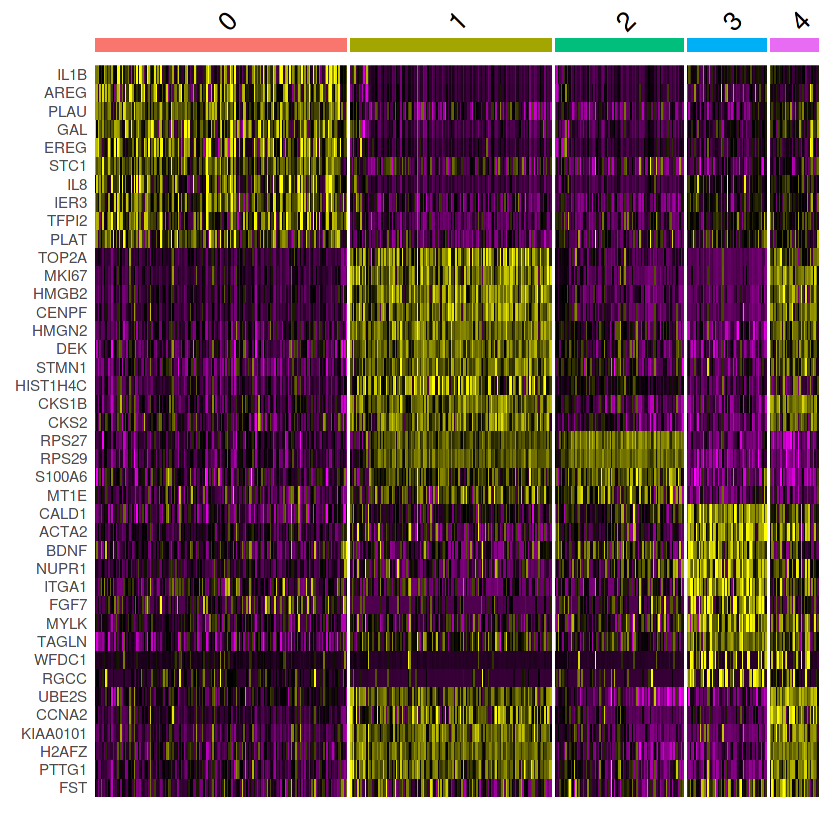

In [34]:
pbmc.markers %>% group_by(cluster) %>% top_n(n = 10, wt = avg_log2FC) -> top10
DoHeatmap(object = pbmcF, features = top10$gene) + NoLegend()


Warning message in FetchData(object = object, vars = features, slot = slot):
“The following requested variables were not found: ATP5PF, ATP5F1B”


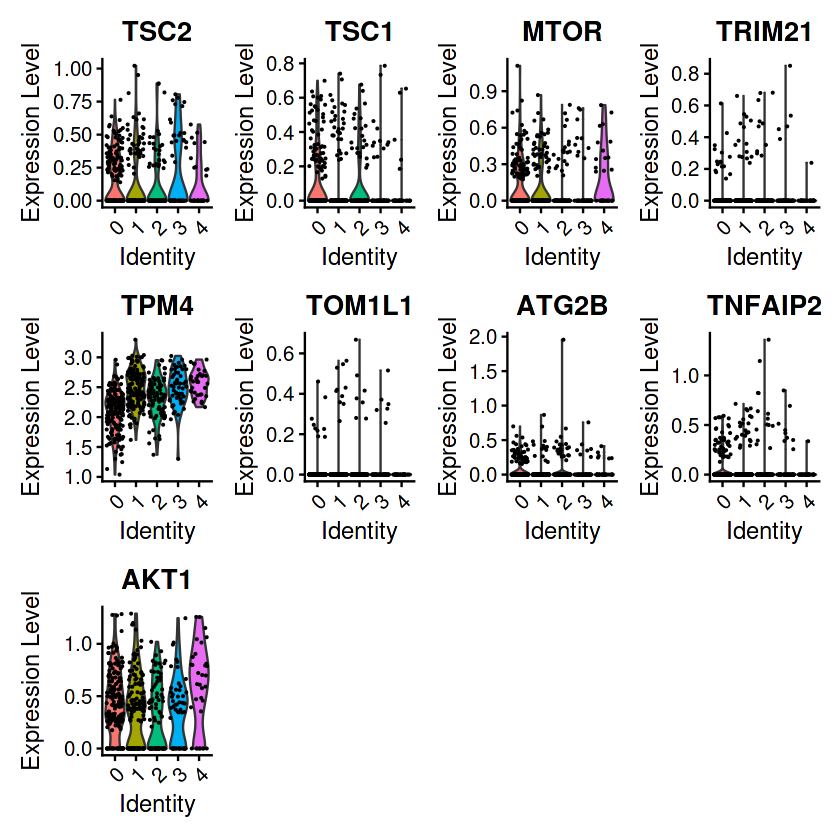

Warning message in FetchData(object = object, vars = features, slot = slot):
“The following requested variables were not found: ATP5PF, ATP5F1B”


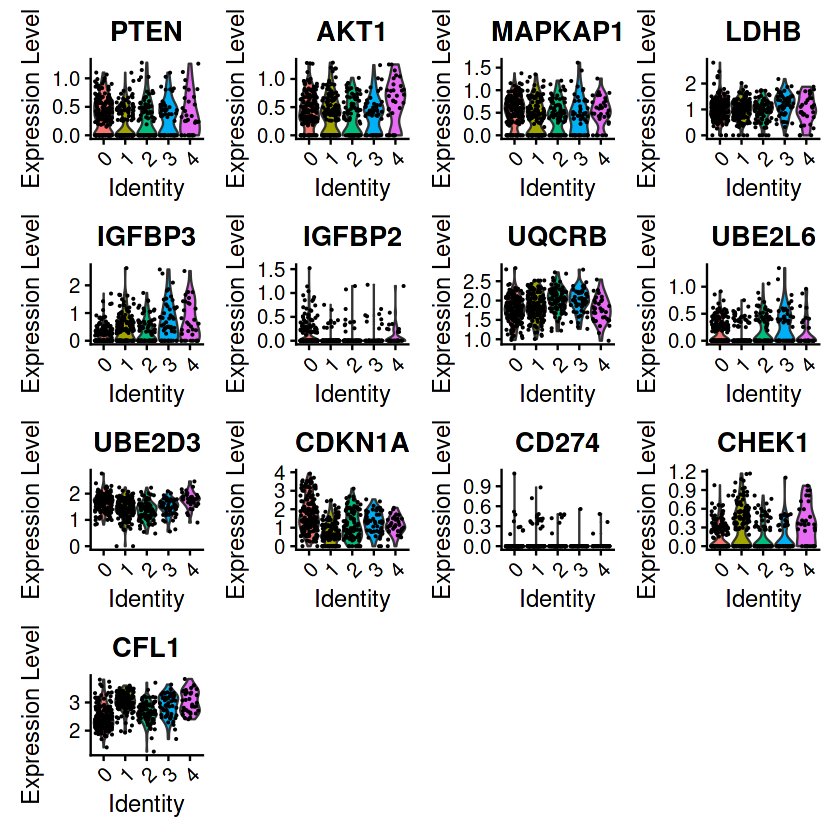

Warning message in FetchData(object = object, vars = features, slot = slot):
“The following requested variables were not found: NDUFB8, NDUFA7”


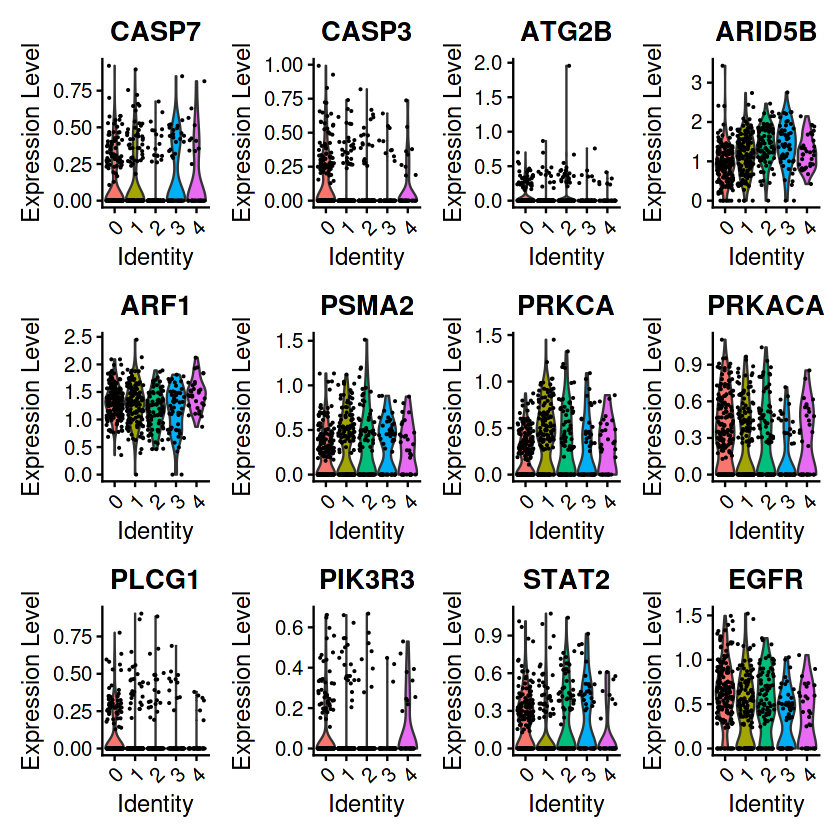

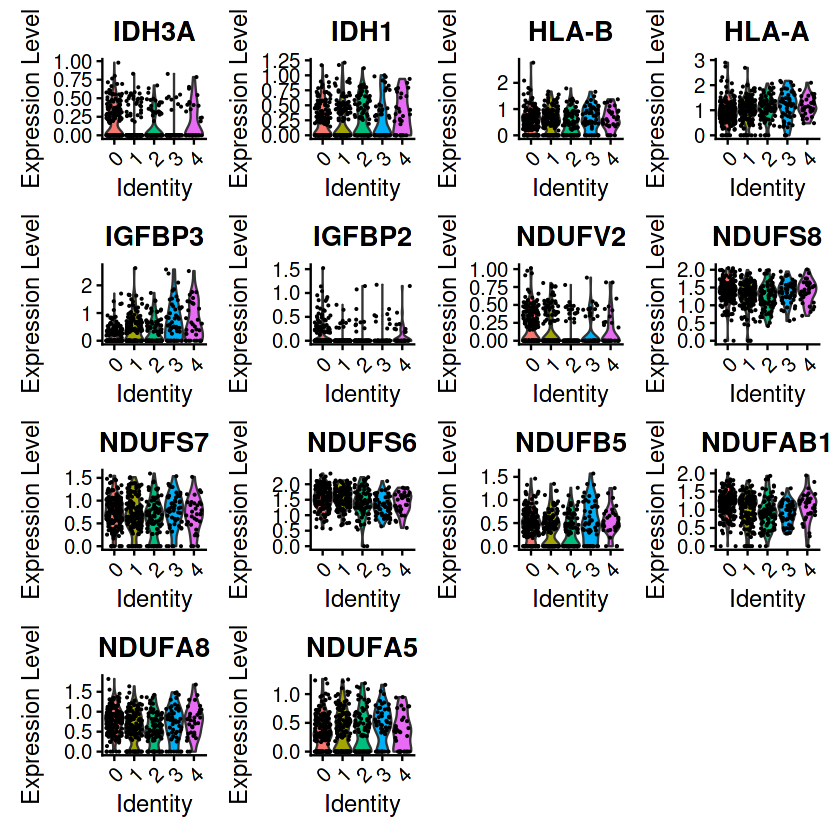

In [28]:
VlnPlot(object = pbmcF, features = c("TSC2","TSC1","MTOR","TRIM21","TPM4","TOM1L1","ATP5PF","ATP5F1B","ATG2B","TNFAIP2","AKT1"))       
VlnPlot(object = pbmcF, features = c("PTEN","AKT1","MAPKAP1","LDHB","IGFBP3","IGFBP2","UQCRB","UBE2L6","UBE2D3","CDKN1A","CD274","CHEK1","CFL1"))
VlnPlot(object = pbmcF, features = c("CASP7","CASP3","ATP5PF","ATP5F1B","ATG2B","ARID5B","ARF1","PSMA2","PRKCA","PRKACA","PLCG1","PIK3R3","STAT2","EGFR"))
VlnPlot(object = pbmcF, features = c("IDH3A","IDH1","HLA-B","HLA-A","IGFBP3","IGFBP2","NDUFV2","NDUFS8","NDUFS7","NDUFS6","NDUFB8","NDUFB5","NDUFAB1","NDUFA8","NDUFA7","NDUFA5"))


Warning message in FetchData(object = object, vars = features, slot = slot):
“The following requested variables were not found: LY6D”


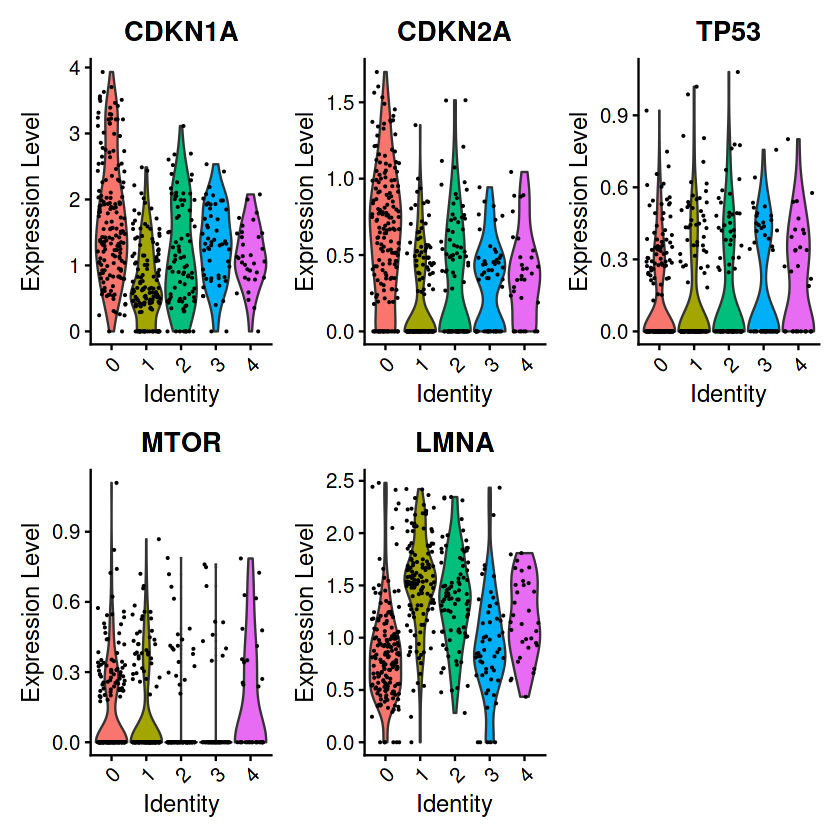

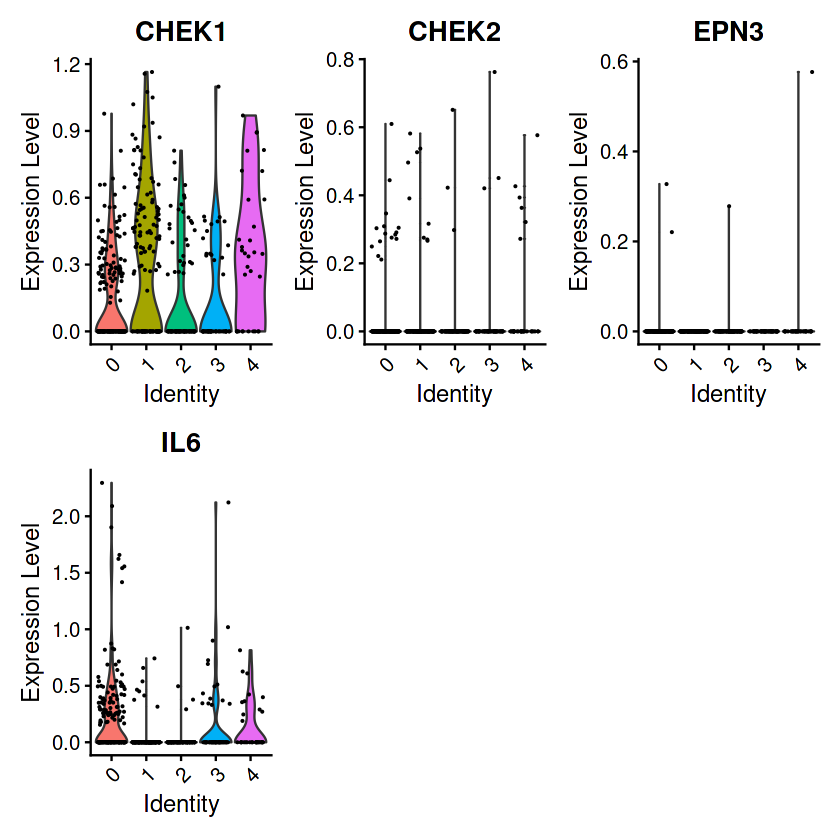

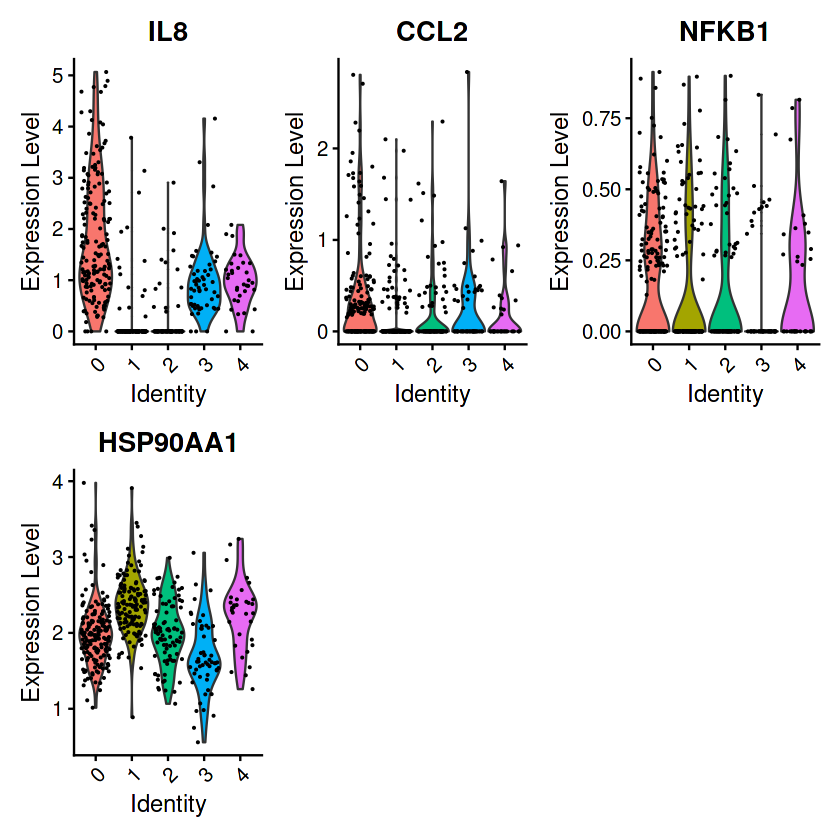

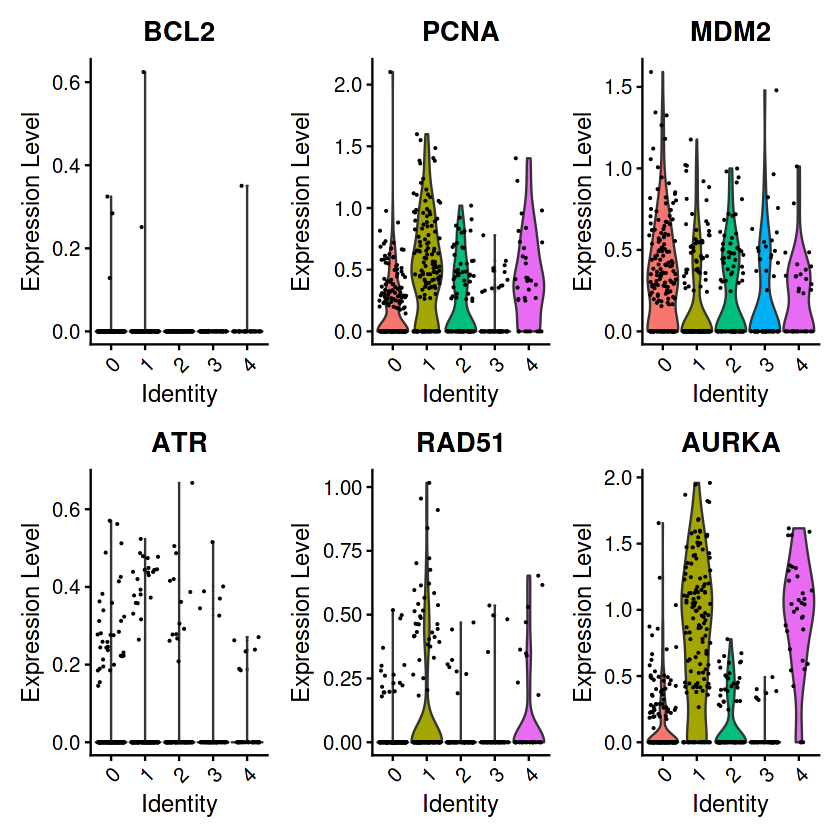

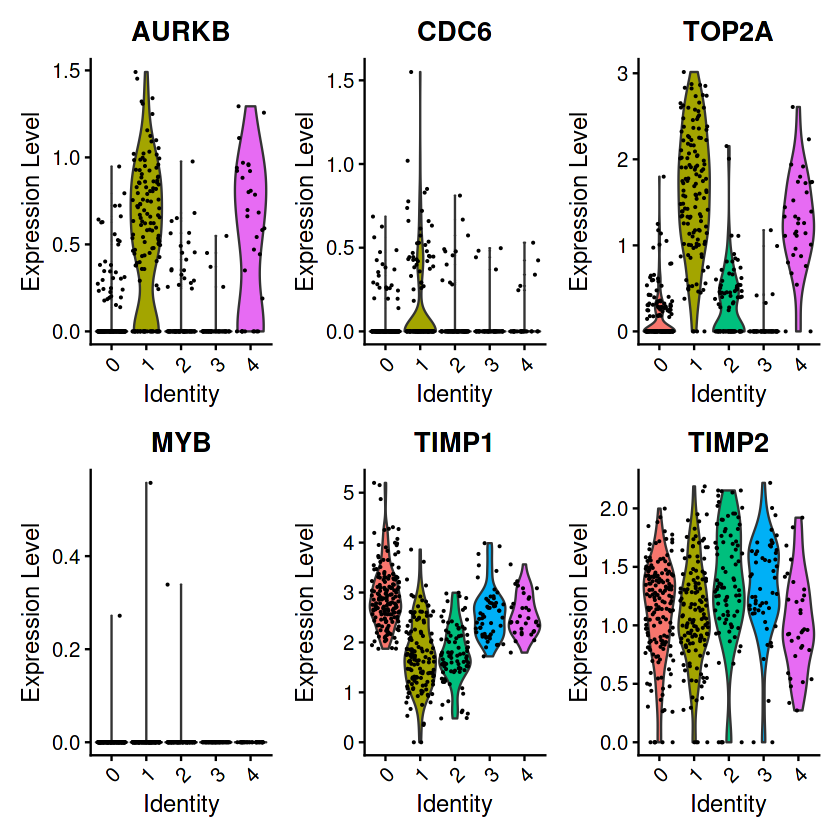

Warning message in FetchData(object = object, vars = features, slot = slot):
“The following requested variables were not found: CTPS”


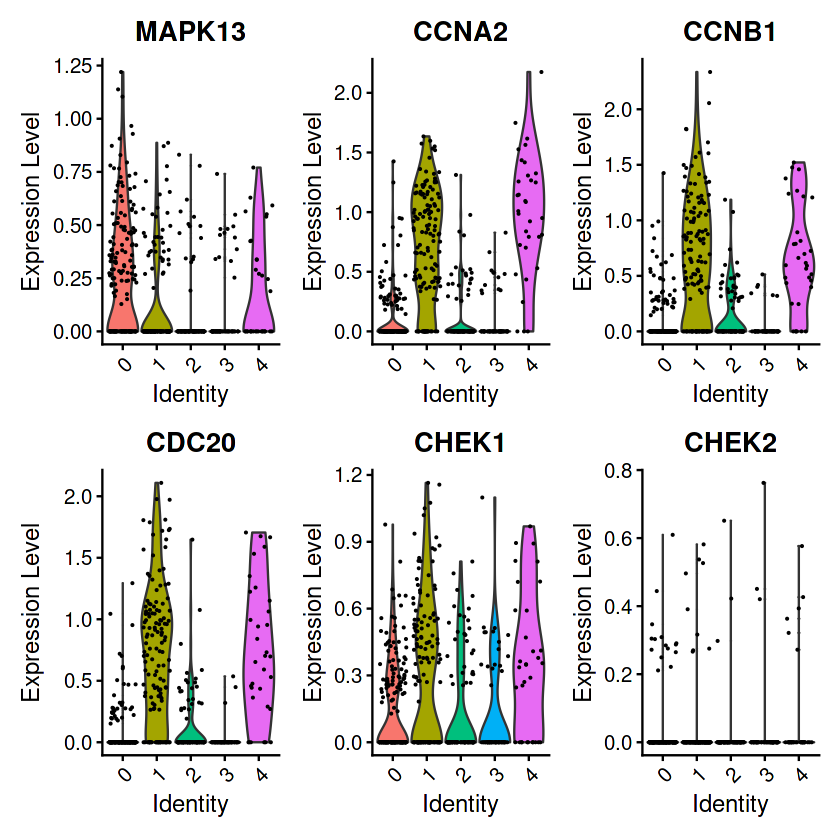

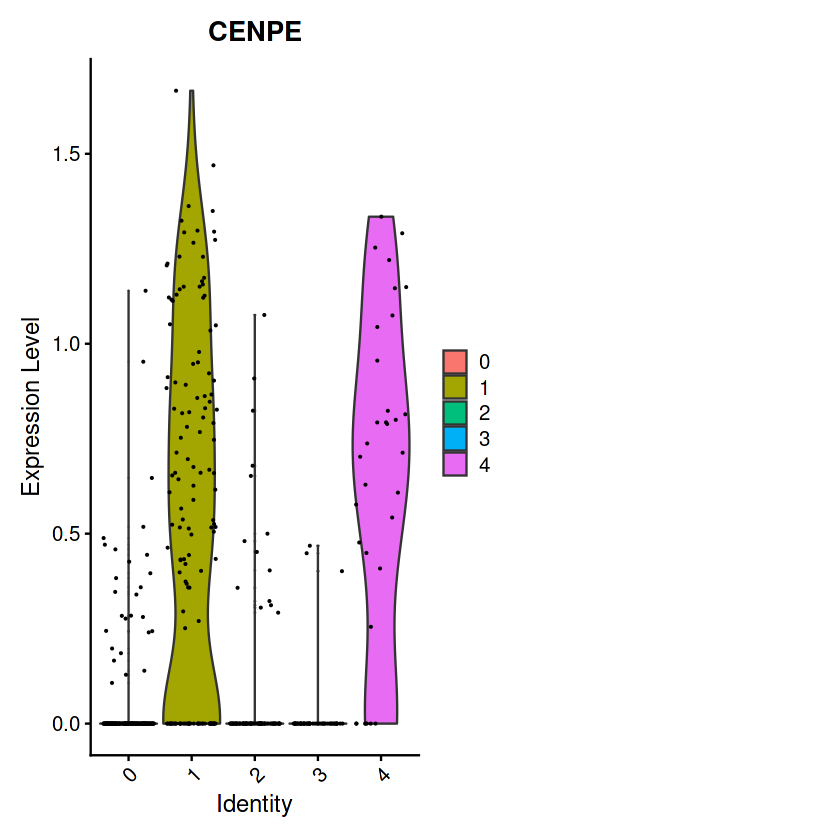

In [35]:
VlnPlot(object = pbmcF, features = c("CDKN1A", "CDKN2A", "TP53", "MTOR","LMNA"))
VlnPlot(object = pbmcF, features = c("CHEK1","CHEK2","LY6D","EPN3","IL6"))
VlnPlot(object = pbmcF, features = c("IL8", "CCL2","NFKB1", "HSP90AA1"))

VlnPlot(object = pbmcF, features = c("BCL2","PCNA","MDM2","ATR","RAD51","AURKA"))
VlnPlot(object = pbmcF, features = c("AURKB","CDC6","TOP2A","MYB","TIMP1","TIMP2"))
VlnPlot(object = pbmcF, features = c("MAPK13","CCNA2","CCNB1", "CDC20", "CHEK1", "CHEK2"))
VlnPlot(object = pbmcF, features = c("CENPE", "CTPS"))


In [67]:
library(monocle3)
library("stringr")
library("factoextra")
library("Rtsne")
data <- as(as.matrix(pbmcF@assays$RNA@data), 'sparseMatrix')


In [76]:
#seurat.object <- readRDS("Integrated.rds")
#data <- as(as.matrix(GetAssayData(pbmcF, assay = "integrated", slot = "scale.data")), 'sparseMatrix')
pd <- data.frame(pbmcF@meta.data)
#pd <- data.frame(seurat.object@meta.data)
#keep only the columns that are relevant
pData <- pd %>% select(orig.ident, nCount_RNA, nFeature_RNA)
fData <- data.frame(gene_short_name = row.names(data), row.names = row.names(data))

#Construct monocle cds
monocle.object <- new_cell_data_set(expression_data = data, cell_metadata = pData, gene_metadata = fData)
#preprocess
monocle.object = preprocess_cds(monocle.object, num_dim = 100, norm_method = "size_only", pseudo_count = 0)
monocle.object = reduce_dimension(monocle.object,reduction_method = "UMAP")
#map pseudotime
monocle.object <- cluster_cells(monocle.object)
monocle.object <- learn_graph(monocle.object)
#monocle.object = order_cells(monocle.object,reduction_method = "UMAP")




No preprocess_method specified, using preprocess_method = 'PCA'



  |======================================================================| 100%


In [79]:
cds_subset = order_cells(monocle.object,reduction_method = "UMAP")
cds_subset = order_cells(cds_subset,root_pr_nodes = "Y_2")
plot_cells(cds_subset, 
           color_cells_by = "pseudotime")
plot_cells(monocle.object, color_cells_by = "pseudotime")

ERROR: Error: When not in interactive mode, either root_pr_nodes or root_cells must be provided.


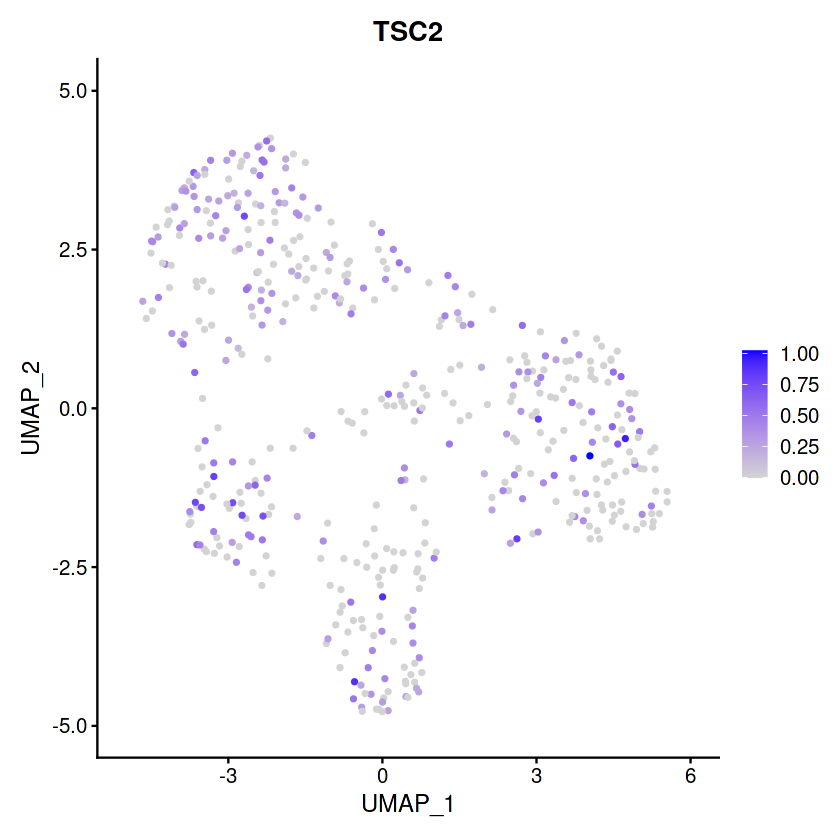

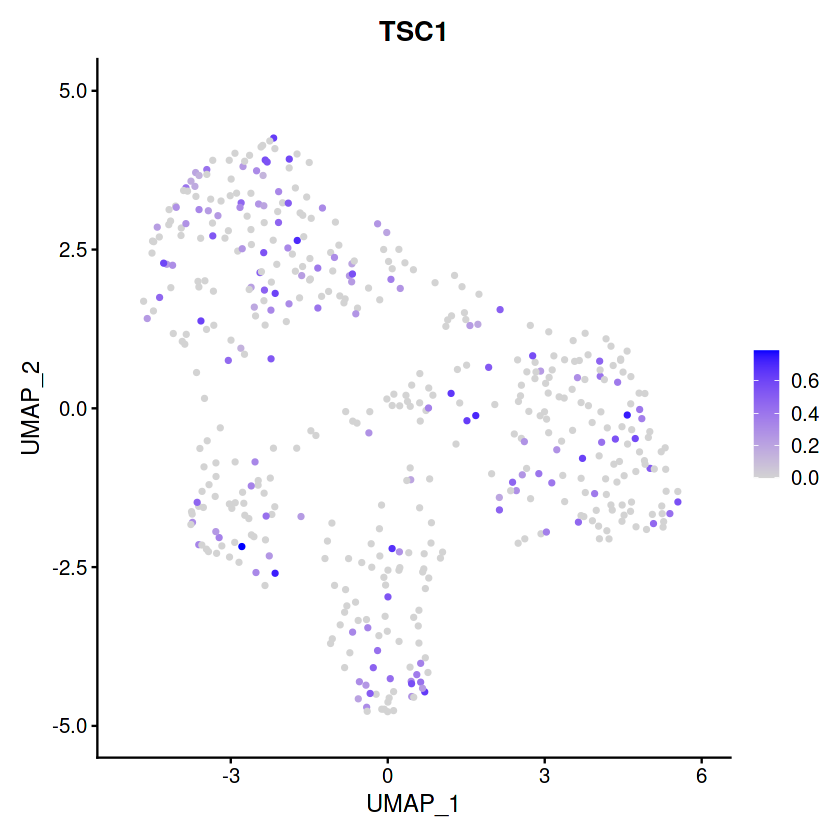

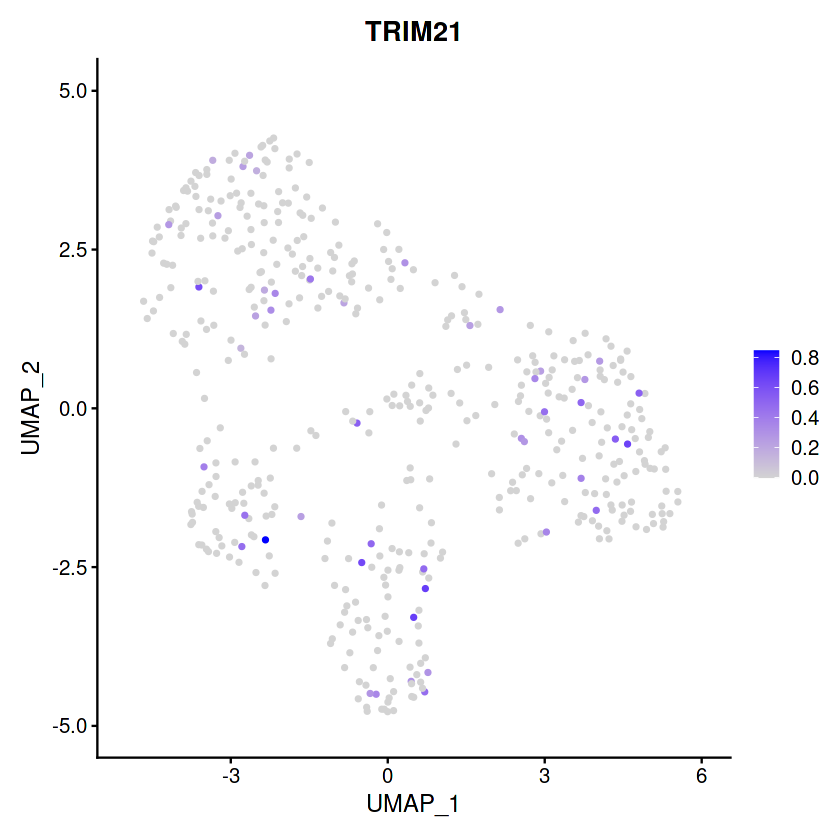

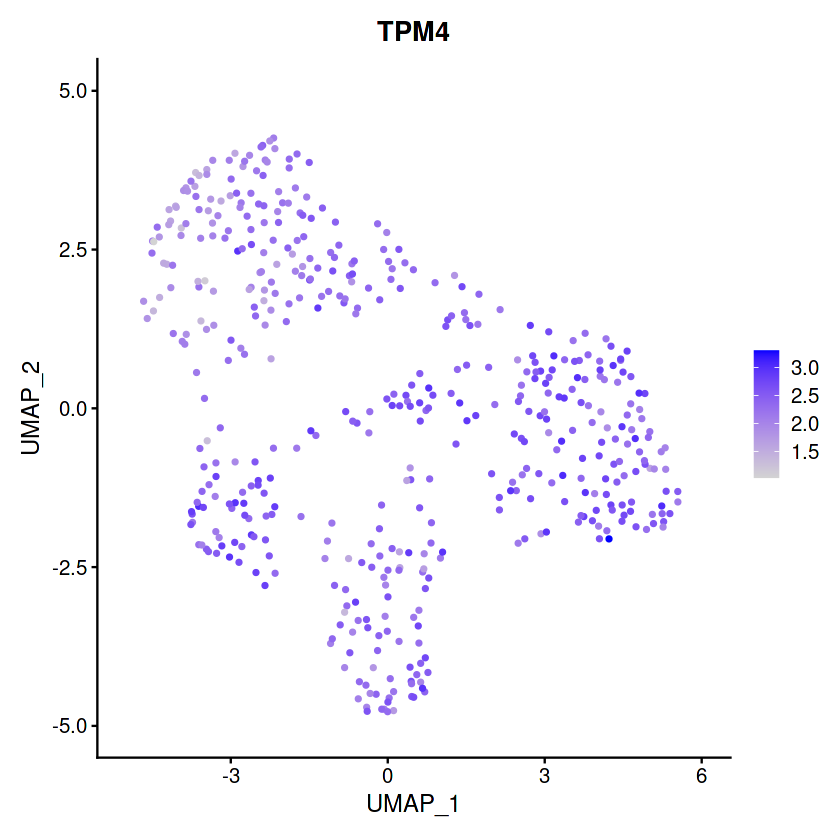

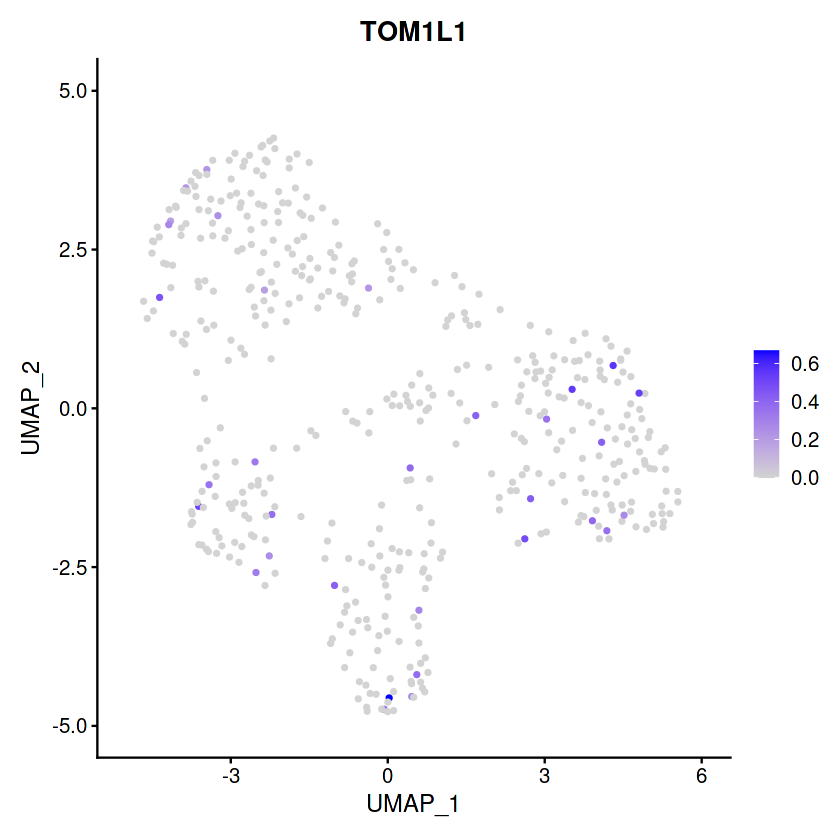

...

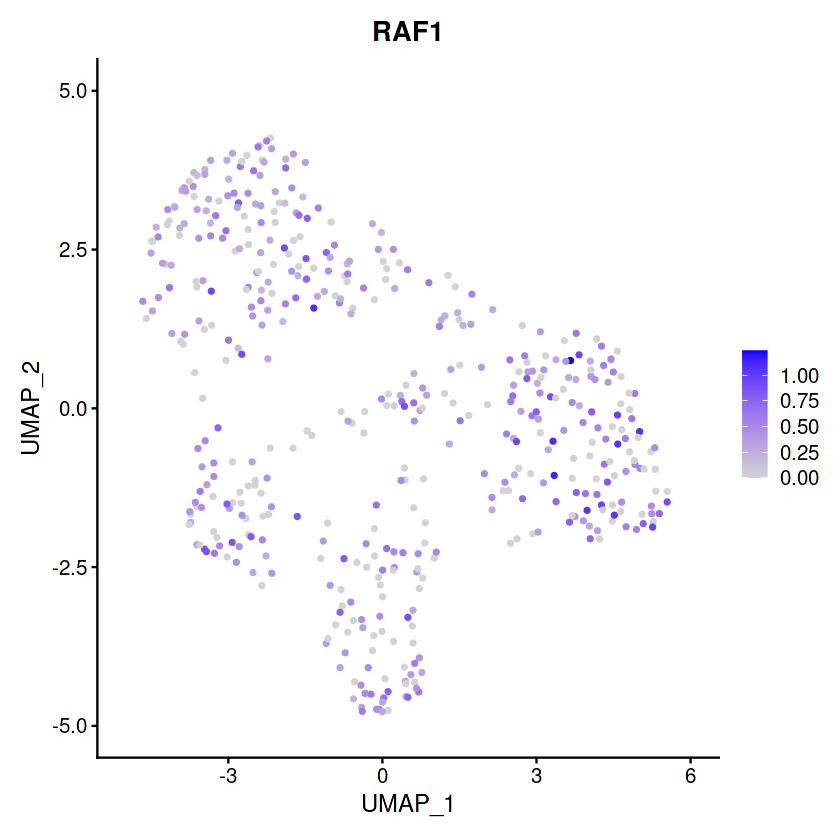

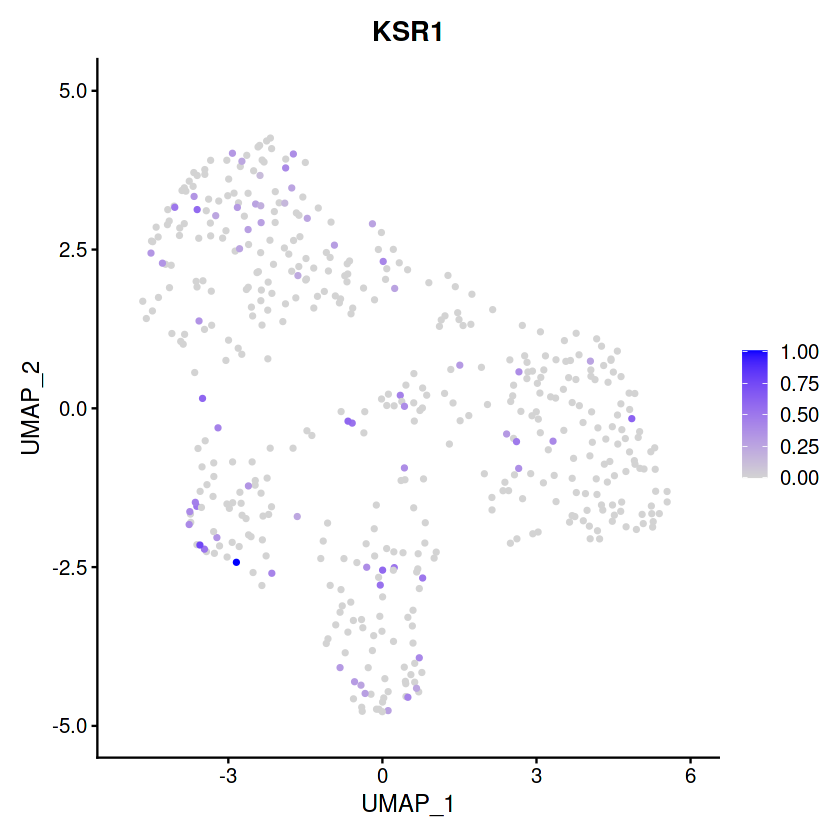

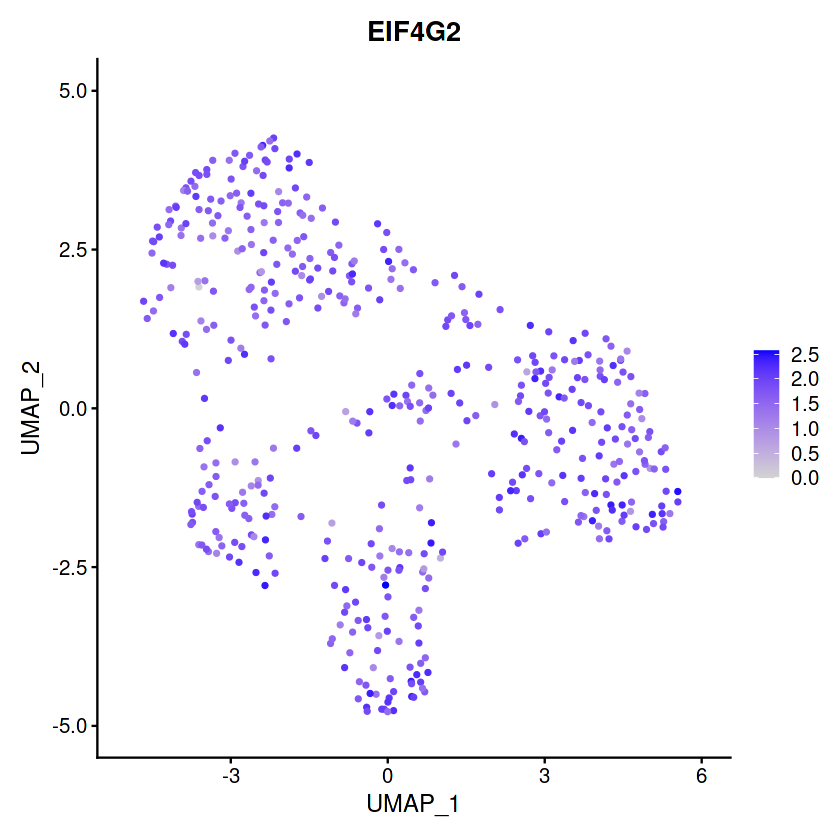

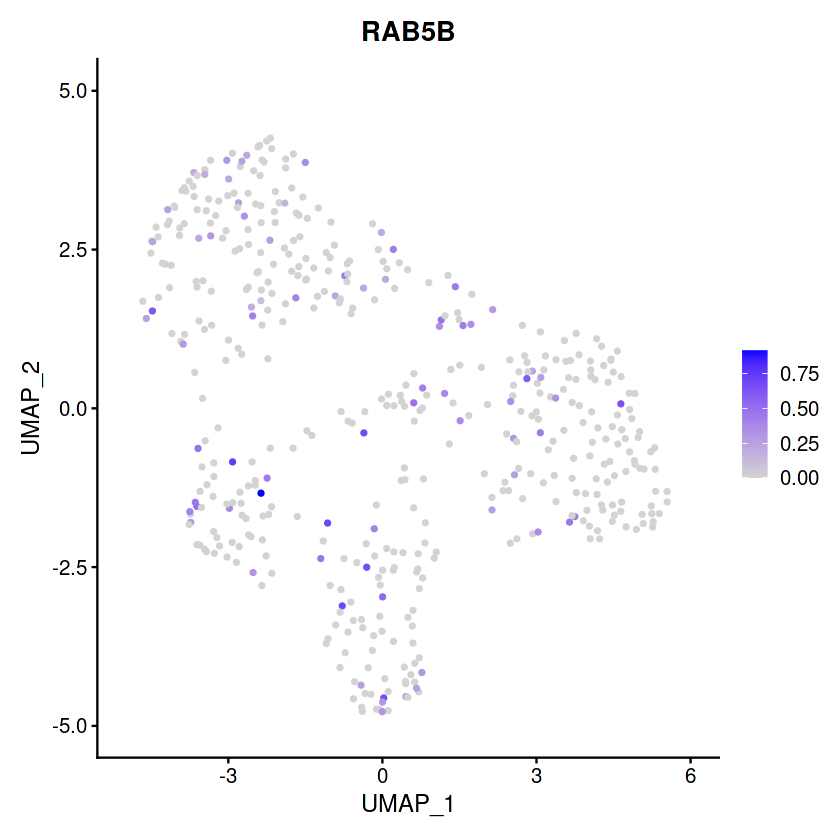

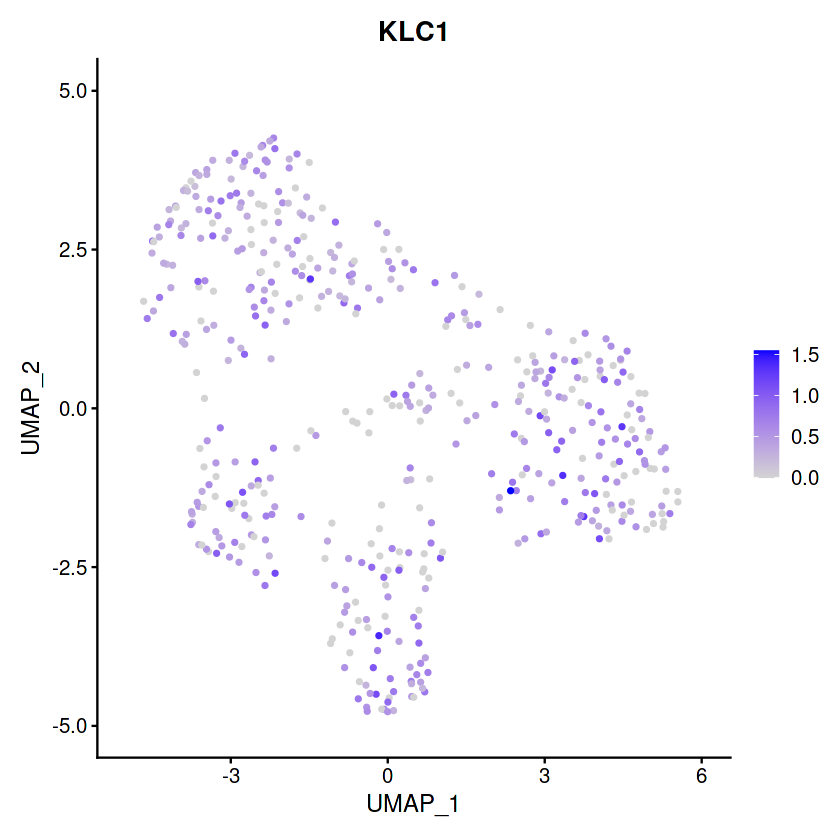

Warning message in FetchData(object = object, vars = c(dims, "ident", features), :
“The following requested variables were not found: RAS”


ERROR: Error: None of the requested features were found: RAS in slot data


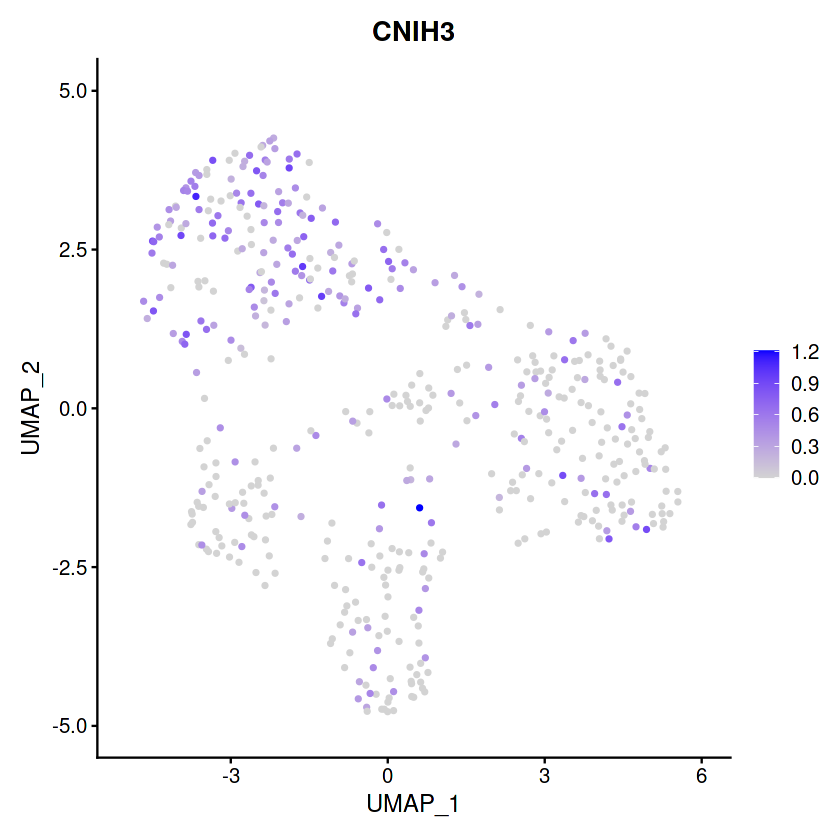

In [33]:
FeaturePlot(pbmcF, features = c("TSC2"))
FeaturePlot(pbmcF, features = c("TSC1"))
FeaturePlot(pbmcF, features = c("TRIM21"))
FeaturePlot(pbmcF, features = c("TPM4"))
FeaturePlot(pbmcF, features = c("TOM1L1"))
FeaturePlot(pbmcF, features = c("MTOR"))
#FeaturePlot(pbmcF, features = c("ATP5PF"))
FeaturePlot(pbmcF, features = c("ATG2B"))
FeaturePlot(pbmcF, features = c("TNFAIP2"))
FeaturePlot(pbmcF, features = c("AKT1"))
FeaturePlot(pbmcF, features = c("PTEN"))
FeaturePlot(pbmcF, features = c("AKT1"))
FeaturePlot(pbmcF, features = c("MAPKAP1"))
FeaturePlot(pbmcF, features = c("LDHB"))
FeaturePlot(pbmcF, features = c("IGFBP3"))
FeaturePlot(pbmcF, features = c("IGFBP2"))
FeaturePlot(pbmcF, features = c("UQCRB"))
FeaturePlot(pbmcF, features = c("UBE2L6"))
FeaturePlot(pbmcF, features = c("UBE2D3"))
FeaturePlot(pbmcF, features = c("CDKN1A"))
FeaturePlot(pbmcF, features = c("CD274"))
FeaturePlot(pbmcF, features = c("CHEK1"))
FeaturePlot(pbmcF, features = c("CFL1"))
FeaturePlot(pbmcF, features = c("ATG2B"))
FeaturePlot(pbmcF, features = c("STAT2"))
FeaturePlot(pbmcF, features = c("EGFR"))
FeaturePlot(pbmcF, features = c("PRKACA"))
FeaturePlot(pbmcF, features = c("AKT3"))
FeaturePlot(pbmcF, features = c("EIF4E"))
FeaturePlot(pbmcF, features = c("LAMTOR2"))
FeaturePlot(pbmcF, features = c("PRKCA"))
FeaturePlot(pbmcF, features = c("RICTOR"))
FeaturePlot(pbmcF, features = c("RAF1"))
FeaturePlot(pbmcF, features = c("KSR1"))
FeaturePlot(pbmcF, features = c("EIF4G2"))
FeaturePlot(pbmcF, features = c("RAB5B"))
FeaturePlot(pbmcF, features = c("KLC1"))
FeaturePlot(pbmcF, features = c("CNIH3"))
FeaturePlot(pbmcF, features = c("RAS"))
FeaturePlot(pbmcF, features = c("RIN1"))
FeaturePlot(pbmcF, features = c("ATG16L1"))
FeaturePlot(pbmcF, features = c("CHMP2A"))
FeaturePlot(pbmcF, features = c("GRK3"))
FeaturePlot(pbmcF, features = c("STRAP"))
FeaturePlot(pbmcF, features = c("TGFBR1"))





#"PTBP1","NOTCH2NLB","EIF3C","EIF3CL","STAT5A","SMO","KHSRP","NXF1","TLN1","SIN3A","BSG","SYT7","TET1","ACO1","SPP1","IFITM3","EEF1A1","VCP","CBX3","H3C10","PABPC1","GLUD1","SOX11","ZFP36","CD151","PTPN6"